GEOG5995M Final Assignment 
Student ID number:11489360

In [1]:
# For traditions sake start with the phrase 'Hello World'
print ('Hello World')

Hello World


In [2]:
#Import the required packages [FN 1]

import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import pyproj
import seaborn as sns
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Import further required packages [FN 2]
import matplotlib.lines as mlines 
import nbformat

The Project aims to explore whether there is a possible relationship between Fuel Poverty levels in English Local Authority 
Districts (LADs) and each LADs relative position in respect of that LAD's domestic residencies' homes energy efficiency levels
via the indirect route of using data from Energy Performance Certificates (EPCs)[FN 3]. 

The coding will include the seaborn (sns) elements 'pairplot','displot','jointplot' and 'scatterplot' which will be 
"deprecated in future version" but to aid readability the warning messages have been removed from the program below.
                                                                                                      
                                                                                            

In [3]:
# Remove warning messages [FN 4]
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Path to the first required CSV file [FN 5]
file_path = '/Users/user/Documents/GEOG5995-main/rmepc_laua21_mi.csv'

# Read in the CSV file and name DataFrame(df)
rmepc = pd.read_csv(file_path)

# Begin review of df
# Display df's first 5 rows
rmepc.head()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change,median_epc_change,median_pepc_change,median_area_change
0,E06000001,2.253,0.627,1.552,2,1,-0.52
1,E06000002,1.508,1.484,-6.120,1,1,-2.39
2,E06000003,1.542,1.221,-3.936,1,1,-0.92
3,E06000004,3.574,1.192,-3.375,3,1,1.00
4,E06000005,0.948,0.566,-2.002,1,1,-0.97


In [5]:
# Continue review of df

# Display df's last 5 rows
rmepc.tail()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change,median_epc_change,median_pepc_change,median_area_change
358,W06000020,3.183,1.804,-5.793,3,2,-1.695
359,W06000021,2.710,0.969,7.375,3,1,4.500
360,W06000022,3.400,1.379,-0.114,3,1,1.990
361,W06000023,-3.100,-0.366,9.190,-2,0,6.300
362,W06000024,2.141,1.281,-1.925,2,1,-0.440


In [6]:
# Continue review of df

# Display df's info -shape, columns, non-null columns and datatypes(dtype) 
rmepc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 363 entries, 0 to 362
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   laua21              363 non-null    object 
 1   mean_epc_change     363 non-null    float64
 2   mean_pepc_change    363 non-null    float64
 3   mean_area_change    363 non-null    float64
 4   median_epc_change   363 non-null    int64  
 5   median_pepc_change  363 non-null    int64  
 6   median_area_change  363 non-null    float64
dtypes: float64(4), int64(2), object(1)
memory usage: 20.0+ KB


In [7]:
# There is no obvious error in dtypes and no missing info for each column

# Print the column names prior to explaining their meaning   
rmepc.columns

Index(['laua21', 'mean_epc_change', 'mean_pepc_change', 'mean_area_change',
       'median_epc_change', 'median_pepc_change', 'median_area_change'],
      dtype='object')

Description of data variables-[FN6]:                                                                          

laua21 : Local Authotity District (LAD) in 2021 - England,Scotland and Wales 
    
For moves into the specified local auth LAD from outside that LAD 2008-2021 

mean_epc_change :     mean Energy Performance Certificate(EPC) score change (range is 0-100 where higher is more energy efficient)  

mean_pepc_change :    mean potential EPC score change 
    
mean_area_change :    mean area change ( in square metres) 
    
median_epc_change :   median EPC score change 
    
median_pepc_change :  median potential EPC score change 
    
median_area_change :  mean area change

A later set of dfs will introduce variables and geometry but those will be restricted to English LADs only.
Therefore Scottish and Welsh LADs can be removed (i.e keep E= England LADs('laua21'))

In [12]:
# Remove non-English LADs [FN 7]

# Check if each entry in 'laua21' starts with 'E'
mask = rmepc['laua21'].str.startswith('E')

# Keep only the rows where the condition is True
rmepc.drop(rmepc[~mask].index, inplace=True)

# Print the reduced df
print(rmepc)

        laua21  mean_epc_change  mean_pepc_change  mean_area_change  \
0    E06000001            2.253             0.627             1.552   
1    E06000002            1.508             1.484            -6.120   
2    E06000003            1.542             1.221            -3.936   
3    E06000004            3.574             1.192            -3.375   
4    E06000005            0.948             0.566            -2.002   
..         ...              ...               ...               ...   
304  E09000029           -0.283            -0.075            -3.867   
305  E09000030            7.657             1.783           -18.423   
306  E09000031           -0.707            -0.177            -6.164   
307  E09000032            2.070            -0.750           -10.024   
308  E09000033            2.336            -0.851           -15.390   

     median_epc_change  median_pepc_change  median_area_change  
0                    2                   1              -0.520  
1                

In [13]:
# Check the removal of non-E LADs ('laua21')

# check the last 5 rows (previously 'laua21' tail all began with W)   
rmepc.tail()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change,median_epc_change,median_pepc_change,median_area_change
304,E09000029,-0.283,-0.075,-3.867,0,0,-1.000
305,E09000030,7.657,1.783,-18.423,8,1,-11.000
306,E09000031,-0.707,-0.177,-6.164,-1,0,-1.835
307,E09000032,2.070,-0.750,-10.024,2,-1,-5.140
308,E09000033,2.336,-0.851,-15.390,2,-1,-11.410


In [14]:
# Check how many rows are now included (English LADs only)  

# Review the shape of the df  
rmepc.shape

(309, 7)

In [15]:
# Result is that E(nglish) LADs number 309 
# Check range index

# Review the index of the df 
rmepc.index

RangeIndex(start=0, stop=309, step=1)

In [16]:
# Information confirms 309 rows (0-308) and 7 columns

# Check no duplicated rows [FN 8]
is_duplicate = rmepc.duplicated()
rmepc['IsDuplicate'] = is_duplicate
print(rmepc)

        laua21  mean_epc_change  mean_pepc_change  mean_area_change  \
0    E06000001            2.253             0.627             1.552   
1    E06000002            1.508             1.484            -6.120   
2    E06000003            1.542             1.221            -3.936   
3    E06000004            3.574             1.192            -3.375   
4    E06000005            0.948             0.566            -2.002   
..         ...              ...               ...               ...   
304  E09000029           -0.283            -0.075            -3.867   
305  E09000030            7.657             1.783           -18.423   
306  E09000031           -0.707            -0.177            -6.164   
307  E09000032            2.070            -0.750           -10.024   
308  E09000033            2.336            -0.851           -15.390   

     median_epc_change  median_pepc_change  median_area_change  IsDuplicate  
0                    2                   1              -0.520       

In [17]:
# The df isn't printed out in full (just head and tail)

# The whole list is checked for duplications [FN 9]
is_duplicate = rmepc.duplicated()
false_count = (is_duplicate == False).sum()
print(false_count)

309


In [18]:
# Adjusted rmepc df has 309 rows and no duplications
# Review the information in the columns and rows that remain 

# Display df's info -shape, columns, non-null columns and datatypes(Dtype) 
rmepc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   laua21              309 non-null    object 
 1   mean_epc_change     309 non-null    float64
 2   mean_pepc_change    309 non-null    float64
 3   mean_area_change    309 non-null    float64
 4   median_epc_change   309 non-null    int64  
 5   median_pepc_change  309 non-null    int64  
 6   median_area_change  309 non-null    float64
 7   IsDuplicate         309 non-null    bool   
dtypes: bool(1), float64(4), int64(2), object(1)
memory usage: 17.3+ KB


In [19]:
# Before embarking on further analysis remove unwanted columns 

# Specify the columns to delete
columns_to_delete = ['median_epc_change', 'median_pepc_change', 'median_area_change', 'IsDuplicate']

# Delete specified columns
rmepc = rmepc.drop(columns=columns_to_delete)

# Print the modified df
rmepc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   laua21            309 non-null    object 
 1   mean_epc_change   309 non-null    float64
 2   mean_pepc_change  309 non-null    float64
 3   mean_area_change  309 non-null    float64
dtypes: float64(3), object(1)
memory usage: 9.8+ KB


In [20]:
# The remaining columns have correct dtypes so no required amendments  

# check sample of amended df is as desired (check tail as original df ordered alphabetically)  
rmepc.tail()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change
304,E09000029,-0.283,-0.075,-3.867
305,E09000030,7.657,1.783,-18.423
306,E09000031,-0.707,-0.177,-6.164
307,E09000032,2.070,-0.750,-10.024
308,E09000033,2.336,-0.851,-15.390


In [21]:
# Rename variable columns
rmepc.rename(columns={
    'mean_epc_change': 'epc_mi',
    'mean_pepc_change': 'pepc_mi',
    'mean_area_change': 'area_mi',
   
}, inplace=True)

# Display df's first 5 rows
rmepc.head()

,laua21,epc_mi,pepc_mi,area_mi
0,E06000001,2.253,0.627,1.552
1,E06000002,1.508,1.484,-6.120
2,E06000003,1.542,1.221,-3.936
3,E06000004,3.574,1.192,-3.375
4,E06000005,0.948,0.566,-2.002


RMEPC df sample is as required for merging, The addition of the second file adds additional datapoints and therefore accuracy 

In [22]:
# Path to the second required CSV file [FN 10]
file_path = '/Users/user/Documents/GEOG5995-main/rmepc_laua21_mo.csv'

# Read in the CSV file and name df
rmepc2 = pd.read_csv(file_path)

# Begin review of df
# Display df's first 5 rows
rmepc2.head()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change,median_epc_change,median_pepc_change,median_area_change
0,E06000001,1.135,0.818,-11.779,1.0,1.0,-2.89
1,E06000002,1.876,0.108,2.598,2.0,0.0,0.00
2,E06000003,1.388,-0.225,0.627,1.0,0.0,-1.20
3,E06000004,-0.636,-0.025,-1.699,0.0,0.0,-2.47
4,E06000005,2.181,0.749,-0.618,2.0,0.0,-0.81


In [23]:
# Continue review of df

# Display df's last 5 rows
rmepc2.tail()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change,median_epc_change,median_pepc_change,median_area_change
358,W06000020,0.098,-0.898,2.509,1.0,0.0,-1.96
359,W06000021,0.594,0.403,-11.689,1.0,0.0,-7.00
360,W06000022,-0.117,0.087,-4.824,0.0,0.0,-4.00
361,W06000023,4.373,0.468,-14.673,3.0,0.0,-9.42
362,W06000024,0.762,0.064,-0.117,1.0,0.0,-1.00


In [24]:
# Review the columns of the df

# Print the columns of the df
rmepc2.columns

Index(['laua21', 'mean_epc_change', 'mean_pepc_change', 'mean_area_change',
       'median_epc_change', 'median_pepc_change', 'median_area_change'],
      dtype='object')

Description of data variables-[FN12]: Which are the same as for df rmepc (see above).
    


In [25]:
# Again keep E= England LADs('laua21') [FN 11]
 
# Check if each entry in 'laua21' starts with 'E'
mask = rmepc2['laua21'].str.startswith('E')

# Keep only the rows where the condition is True
rmepc2.drop(rmepc2[~mask].index, inplace=True)

# Print the reduced df
print(rmepc2)

        laua21  mean_epc_change  mean_pepc_change  mean_area_change  \
0    E06000001            1.135             0.818           -11.779   
1    E06000002            1.876             0.108             2.598   
2    E06000003            1.388            -0.225             0.627   
3    E06000004           -0.636            -0.025            -1.699   
4    E06000005            2.181             0.749            -0.618   
..         ...              ...               ...               ...   
304  E09000029            2.456             0.952             4.753   
305  E09000030           -4.688            -0.553            14.010   
306  E09000031            2.444             1.439             4.429   
307  E09000032           -0.342             1.750             8.708   
308  E09000033           -0.553             1.480            12.051   

     median_epc_change  median_pepc_change  median_area_change  
0                  1.0                 1.0               -2.89  
1                

In [26]:
# Check the removal of non-E LADs ('laua21')

# Check the last 5 rows (previously 'laua21' tail all began with W)   
rmepc2.tail()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change,median_epc_change,median_pepc_change,median_area_change
304,E09000029,2.456,0.952,4.753,2.0,1.0,4.77
305,E09000030,-4.688,-0.553,14.010,-5.0,0.0,10.00
306,E09000031,2.444,1.439,4.429,2.0,1.0,2.48
307,E09000032,-0.342,1.750,8.708,0.0,2.0,7.00
308,E09000033,-0.553,1.480,12.051,-1.0,2.0,13.00


In [27]:
# Check how many rows are now included (English LADs only)  

# Review the shape of the df  
rmepc2.shape

(309, 7)

In [28]:
# Result is that E(nglish) LADs number 309 (same as for rmepc df) 
# Check range index

# review the  of the df 
rmepc2.index

RangeIndex(start=0, stop=309, step=1)

In [29]:
# Information confirms 363 rows (0-362) and 7 columns

# Check no duplicated rows 
is_duplicate = rmepc2.duplicated()
rmepc2['IsDuplicate'] = is_duplicate
print(rmepc2)

        laua21  mean_epc_change  mean_pepc_change  mean_area_change  \
0    E06000001            1.135             0.818           -11.779   
1    E06000002            1.876             0.108             2.598   
2    E06000003            1.388            -0.225             0.627   
3    E06000004           -0.636            -0.025            -1.699   
4    E06000005            2.181             0.749            -0.618   
..         ...              ...               ...               ...   
304  E09000029            2.456             0.952             4.753   
305  E09000030           -4.688            -0.553            14.010   
306  E09000031            2.444             1.439             4.429   
307  E09000032           -0.342             1.750             8.708   
308  E09000033           -0.553             1.480            12.051   

     median_epc_change  median_pepc_change  median_area_change  IsDuplicate  
0                  1.0                 1.0               -2.89       

In [30]:
# The df isn't printed out in full (just head and tail)

# The whole list is checked for duplications 
is_duplicate = rmepc2.duplicated()
false_count = (is_duplicate == False).sum()
print(false_count)

309


In [31]:
# Information confirms 309 rows and no duplications
# Review the information in the columns and rows that remain 

# Display df's info -shape, columns, non-null columns and datatypes(Dtype) 
rmepc2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   laua21              309 non-null    object 
 1   mean_epc_change     309 non-null    float64
 2   mean_pepc_change    309 non-null    float64
 3   mean_area_change    309 non-null    float64
 4   median_epc_change   309 non-null    float64
 5   median_pepc_change  309 non-null    float64
 6   median_area_change  309 non-null    float64
 7   IsDuplicate         309 non-null    bool   
dtypes: bool(1), float64(6), object(1)
memory usage: 17.3+ KB


In [32]:
# Before embarking on merging dfs remove unwanted columns 
# Median inforamtion is not needed going forward and IsDuplicate has performed its function

# Specify the columns to delete
columns_to_delete = ['median_epc_change', 'median_pepc_change', 'median_area_change', 'IsDuplicate']

# Delete specified columns
rmepc2 = rmepc2.drop(columns=columns_to_delete)

# Print the modified df
rmepc2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   laua21            309 non-null    object 
 1   mean_epc_change   309 non-null    float64
 2   mean_pepc_change  309 non-null    float64
 3   mean_area_change  309 non-null    float64
dtypes: float64(3), object(1)
memory usage: 9.8+ KB


In [33]:
# Once more the remaining columns have correct dtypes and no missing data (i.e 309 non-null count) so no required amendments  

# check sample to confirm of df is as required 
rmepc2.tail()

,laua21,mean_epc_change,mean_pepc_change,mean_area_change
304,E09000029,2.456,0.952,4.753
305,E09000030,-4.688,-0.553,14.010
306,E09000031,2.444,1.439,4.429
307,E09000032,-0.342,1.750,8.708
308,E09000033,-0.553,1.480,12.051


As for first df certain varible names can be simplified and distinguished  
Mean and change are superflous at the stage, whilst designation for moving out(mo) is an important distinction 

In [34]:
# Rename variable columns
rmepc2.rename(columns={
    'mean_epc_change': 'epc_mo',
    'mean_pepc_change': 'pepc_mo',
    'mean_area_change': 'area_mo',
   
}, inplace=True)

# Display df's first 5 rows
rmepc2.head()

,laua21,epc_mo,pepc_mo,area_mo
0,E06000001,1.135,0.818,-11.779
1,E06000002,1.876,0.108,2.598
2,E06000003,1.388,-0.225,0.627
3,E06000004,-0.636,-0.025,-1.699
4,E06000005,2.181,0.749,-0.618


Dfs are now ready for aggregating via their common column ie 'laus21' : LAD's area code.  
 
                 

In [35]:
# Merge the dfs based on the common column 
merged_data = pd.merge(rmepc, rmepc2, on='laua21', how='inner')

# Display df's first 5 rows
merged_data.head()

,laua21,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo
0,E06000001,2.253,0.627,1.552,1.135,0.818,-11.779
1,E06000002,1.508,1.484,-6.120,1.876,0.108,2.598
2,E06000003,1.542,1.221,-3.936,1.388,-0.225,0.627
3,E06000004,3.574,1.192,-3.375,-0.636,-0.025,-1.699
4,E06000005,0.948,0.566,-2.002,2.181,0.749,-0.618


In [36]:
# Display df's last 5 rows
merged_data.tail()

,laua21,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo
304,E09000029,-0.283,-0.075,-3.867,2.456,0.952,4.753
305,E09000030,7.657,1.783,-18.423,-4.688,-0.553,14.010
306,E09000031,-0.707,-0.177,-6.164,2.444,1.439,4.429
307,E09000032,2.070,-0.750,-10.024,-0.342,1.750,8.708
308,E09000033,2.336,-0.851,-15.390,-0.553,1.480,12.051


In [37]:
## Display df's info -shape, columns, non-null columns and datatypes(Dtype) 
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   laua21   309 non-null    object 
 1   epc_mi   309 non-null    float64
 2   pepc_mi  309 non-null    float64
 3   area_mi  309 non-null    float64
 4   epc_mo   309 non-null    float64
 5   pepc_mo  309 non-null    float64
 6   area_mo  309 non-null    float64
dtypes: float64(6), object(1)
memory usage: 17.0+ KB


The merged dfs have correct Dtypes and 309 Non-Null Count so shapes fitted exactly. The next steps will introduce 
the geometry (multi-polygons) to enable maps to be plotted for the LADs and the names of the LADs [FN 12] 
                                                                                                                                                

In [89]:
# The df containing the area codes with attached names is required    

# Path to the third required CSV file [FN 13]
file_path = '/Users/user/Documents/GEOG5995-main/Local_Authority_Districts_December_2021_GB_BGC_2022_-350184439094746283.csv'

# Read in the CSV file and name df
LADE = pd.read_csv(file_path)

# Display df's first 5 rows
LADE.head()

,OBJECTID,LAD21CD,LAD21NM,LAD21NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,Shape__Area,Shape__Length
0,1,E06000001,Hartlepool,,447160,531474,-1.27018,54.67614,a0067727-6c25-4d75-bbe3-839cf676a069,9.377150e+07,68370.93253
1,2,E06000002,Middlesbrough,,451141,516887,-1.21099,54.54467,449ea171-0cf1-4f7e-bfd2-4a204eda5ff3,5.385857e+07,43639.80330
2,3,E06000003,Redcar and Cleveland,,464361,519597,-1.00608,54.56752,f5a51119-846e-4757-b327-73b4be205345,2.451429e+08,94929.15718
3,4,E06000004,Stockton-on-Tees,,444940,518183,-1.30664,54.55691,6c7f0974-4974-4793-9d56-56e9fd814184,2.049023e+08,117933.76630
4,5,E06000005,Darlington,,428029,515648,-1.56835,54.53534,9f91263d-693a-442d-b20d-91a0cd0631bb,1.974890e+08,105775.14000


In [90]:
# Reviewing the tail will provide further supporting evidence for confirming the area codes match the earlier dfs 

# Display df's last 5 rows
LADE.tail()

,OBJECTID,LAD21CD,LAD21NM,LAD21NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,Shape__Area,Shape__Length
358,359,W06000020,Torfaen,Torfaen,327459,200480,-3.05101,51.69836,6e6ba2e5-38cc-48d6-ad6e-52a675a80e94,1.262231e+08,78980.29057
359,360,W06000021,Monmouthshire,Sir Fynwy,337812,209231,-2.90280,51.77827,213c9584-4784-40ee-b115-c1cbc6c88e36,8.503370e+08,219069.22720
360,361,W06000022,Newport,Casnewydd,337897,187432,-2.89769,51.58231,02234c54-5db2-49de-8ecf-ffe8611321f2,1.904457e+08,148337.32440
361,362,W06000023,Powys,Powys,302329,273255,-3.43531,52.34864,ae549f63-3af8-49c8-8afd-f96cdb021e38,5.195417e+09,590030.50860
362,363,W06000024,Merthyr Tydfil,Merthyr Tudful,305916,206424,-3.36425,51.74858,297baf2b-ff25-43bc-b51a-851f73a289f0,1.119303e+08,65314.32098


In [91]:
# For this df only two columns are of interest so review summary information directly
LADE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 363 entries, 0 to 362
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   OBJECTID       363 non-null    int64  
 1   LAD21CD        363 non-null    object 
 2   LAD21NM        363 non-null    object 
 3   LAD21NMW       363 non-null    object 
 4   BNG_E          363 non-null    int64  
 5   BNG_N          363 non-null    int64  
 6   LONG           363 non-null    float64
 7   LAT            363 non-null    float64
 8   GlobalID       363 non-null    object 
 9   Shape__Area    363 non-null    float64
 10  Shape__Length  363 non-null    float64
dtypes: float64(4), int64(3), object(4)
memory usage: 31.3+ KB


In [92]:
# The two columns of interest 'LAD21CD' and 'LAD21NM' are both 'object' and no missing info
# the other columns are not rquired so are removed 

# Specify the columns to delete
columns_to_delete = ['OBJECTID', 'LAD21NMW', 'BNG_E', 'BNG_N', 'LONG', 'LAT', 'GlobalID', 'Shape__Area', 'Shape__Length']

# Delete columns
LADE = LADE.drop(columns=columns_to_delete)

# Print the new df
LADE.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 363 entries, 0 to 362
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   LAD21CD  363 non-null    object
 1   LAD21NM  363 non-null    object
dtypes: object(2)
memory usage: 5.8+ KB


In [93]:
# Review the new df

# Print the first 5 rows of adjusted df
LADE.head()

,LAD21CD,LAD21NM
0,E06000001,Hartlepool
1,E06000002,Middlesbrough
2,E06000003,Redcar and Cleveland
3,E06000004,Stockton-on-Tees
4,E06000005,Darlington


In [94]:
# Continue review the new df

# Print the last 5 rows (no restrcition yet to English LADs only)
LADE.tail()

,LAD21CD,LAD21NM
358,W06000020,Torfaen
359,W06000021,Monmouthshire
360,W06000022,Newport
361,W06000023,Powys
362,W06000024,Merthyr Tydfil


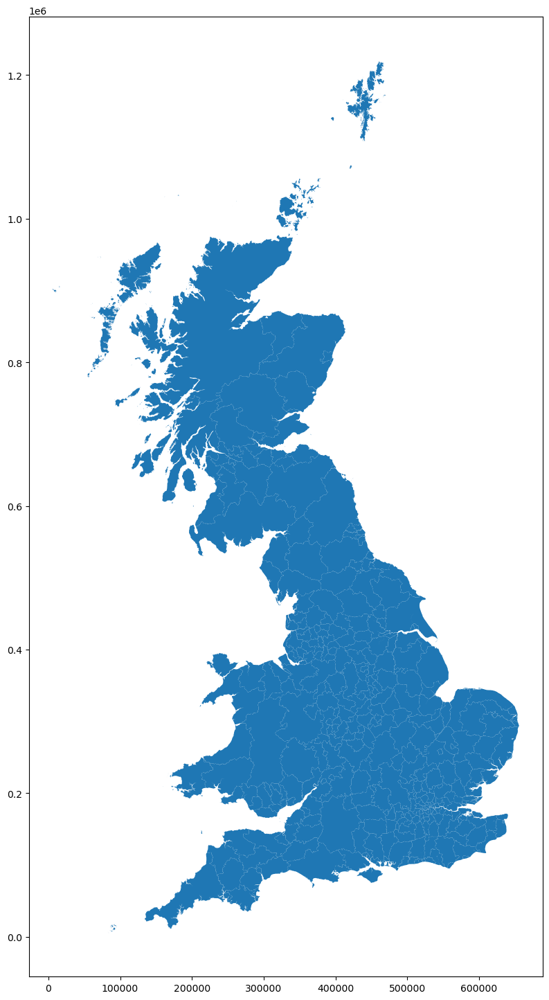

In [95]:
# Plot the map from the shapefile (shp) for review [FN 14]

plt.show()
# Load the GeoDataFrame 
shapefile_path = '/Users/user/Documents/GEOG5995-main/LAD_DEC_2021_GB_BGC.shx'
shp = gpd.read_file(shapefile_path)

# Create a plot
f, ax = plt.subplots(1, figsize=(24, 18))

# Plot the GeoDataFrame
shp.plot(ax=ax)

# Show the plot
plt.show()

In [96]:
# To continue review print first 5 rows
shp.head()

,geometry
0,"MULTIPOLYGON (((450153.600 525935.876, 450139...."
1,"MULTIPOLYGON (((446860.000 517200.300, 446854...."
2,"MULTIPOLYGON (((451747.397 520561.100, 451787...."
3,"MULTIPOLYGON (((447214.196 517857.904, 447186...."
4,"POLYGON ((423475.701 524731.597, 423497.204 52..."


In [97]:
# To further aid shp review print last 5 rows
shp.tail()

,geometry
358,"POLYGON ((323825.299 211337.105, 324481.004 21..."
359,"MULTIPOLYGON (((345920.603 181082.095, 345897...."
360,"MULTIPOLYGON (((334686.647 191802.418, 334690...."
361,"MULTIPOLYGON (((270878.107 297590.695, 270715...."
362,"POLYGON ((303244.101 214132.705, 303262.998 21..."


In [98]:
# There are very few columns so review available information

# Display df's info -shape, columns, non-null columns and datatypes(Dtype) 
shp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 363 entries, 0 to 362
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   geometry  363 non-null    geometry
dtypes: geometry(1)
memory usage: 3.0 KB


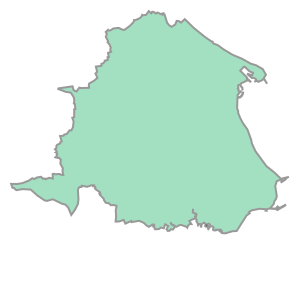

In [99]:
# The shape map does not include names or code index the only comparison available is mtaching the geometry to those attributes 
# For example index 0 is E06000001 Hartlepool which can be compared to geometry  

# Access and display the geometry of index 0
shp.loc[0, 'geometry']

It is hard to check whether the geometry does infact represent Hartlepool (Index 0) 
Therefore one can use examples that are much more recognisable. 

In [100]:
# Search for row with "Isles of Scilly" as name
row_isles_of_scilly = LADE.loc[LADE['LAD21NM'] == 'Isles of Scilly']
print(row_isles_of_scilly)

      LAD21CD          LAD21NM
49  E06000053  Isles of Scilly


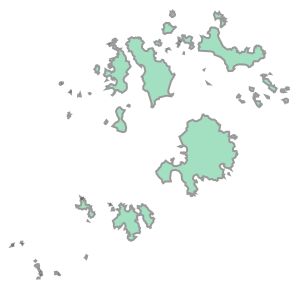

In [101]:
# Print geometry for row 49 "Isles of Scilly"

# Access and display the geometry of index 49
shp.loc[49, 'geometry']

In [102]:
# # Search for row with "Isle of Wight" as name
row_isle_of_wight = LADE.loc[LADE['LAD21NM'] == 'Isle of Wight']
print(row_isle_of_wight)

      LAD21CD        LAD21NM
43  E06000046  Isle of Wight


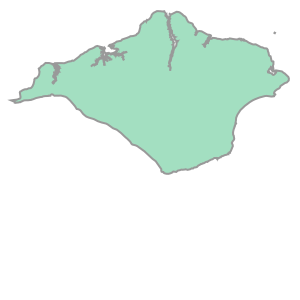

In [103]:
# Access and display the geometry of index 43
shp.loc[43, 'geometry']

In [104]:
# Final confirmation can be obtained by reviewing a LAD that one knows e.g. current address LAD  
# Therefore find row with "Lewes"

# # Search for row with "Lewes" as name
row_Lewes = LADE.loc[LADE['LAD21NM'] == 'Lewes']
print(row_Lewes)

      LAD21CD LAD21NM
88  E07000063   Lewes


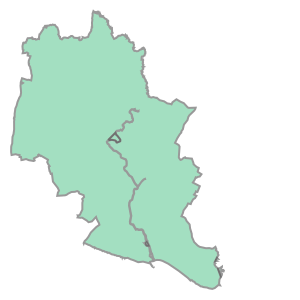

In [105]:
# Print geometry for row 88 "Lewes"

# Access and display the geometry of index 88
shp.loc[88, 'geometry']

All three tested (recognisiable) geometries for LADs are in line with the named LADs and number of LADs
are matched.

In [106]:
# Merge  df LADE and shp but retain geometry [FN 15]
merged_gdf = LADE.merge(shp, left_index=True, right_index=True, how='left')

# Convert the resulting DataFrame back to a GeoDataFrame
merged_gdf = gpd.GeoDataFrame(merged_gdf, geometry='geometry')

# Save the merged GeoDataFrame to a new shapefile
merged_gdf.to_file('/Users/user/Documents/GEOG5995-main/merged_shapefile.shp')

merged_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 363 entries, 0 to 362
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   LAD21CD   363 non-null    object  
 1   LAD21NM   363 non-null    object  
 2   geometry  363 non-null    geometry
dtypes: geometry(1), object(2)
memory usage: 8.6+ KB


In [107]:
# To continue review print first 5 rows
merged_gdf.head()

,LAD21CD,LAD21NM,geometry
0,E06000001,Hartlepool,"MULTIPOLYGON (((450153.600 525935.876, 450139...."
1,E06000002,Middlesbrough,"MULTIPOLYGON (((446860.000 517200.300, 446854...."
2,E06000003,Redcar and Cleveland,"MULTIPOLYGON (((451747.397 520561.100, 451787...."
3,E06000004,Stockton-on-Tees,"MULTIPOLYGON (((447214.196 517857.904, 447186...."
4,E06000005,Darlington,"POLYGON ((423475.701 524731.597, 423497.204 52..."


In [108]:
# To continue review print last 5 rows
merged_gdf.tail()

,LAD21CD,LAD21NM,geometry
358,W06000020,Torfaen,"POLYGON ((323825.299 211337.105, 324481.004 21..."
359,W06000021,Monmouthshire,"MULTIPOLYGON (((345920.603 181082.095, 345897...."
360,W06000022,Newport,"MULTIPOLYGON (((334686.647 191802.418, 334690...."
361,W06000023,Powys,"MULTIPOLYGON (((270878.107 297590.695, 270715...."
362,W06000024,Merthyr Tydfil,"POLYGON ((303244.101 214132.705, 303262.998 21..."


THe non-English LADs are still in the shp but will be excluded by next df merging.  


In [109]:
# Rename one of the dfs for the common column with a common name [FN 16]
merged_data = merged_data.rename(columns={'laua21': 'LAD21CD'})

# Merge the dfs based on the common column
merged_gdf2 = pd.merge(merged_gdf,merged_data, on='LAD21CD', how='inner')

# Display df's information
merged_gdf2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   LAD21CD   309 non-null    object  
 1   LAD21NM   309 non-null    object  
 2   geometry  309 non-null    geometry
 3   epc_mi    309 non-null    float64 
 4   pepc_mi   309 non-null    float64 
 5   area_mi   309 non-null    float64 
 6   epc_mo    309 non-null    float64 
 7   pepc_mo   309 non-null    float64 
 8   area_mo   309 non-null    float64 
dtypes: float64(6), geometry(1), object(2)
memory usage: 21.9+ KB


In [110]:
# The merged dfs have correct dtypes and 309 Non-Null Count so shape fitted exactly  

# Continue review by displaying df's first 5 rows
merged_gdf2.head()

,LAD21CD,LAD21NM,geometry,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo
0,E06000001,Hartlepool,"MULTIPOLYGON (((450153.600 525935.876, 450139....",2.253,0.627,1.552,1.135,0.818,-11.779
1,E06000002,Middlesbrough,"MULTIPOLYGON (((446860.000 517200.300, 446854....",1.508,1.484,-6.120,1.876,0.108,2.598
2,E06000003,Redcar and Cleveland,"MULTIPOLYGON (((451747.397 520561.100, 451787....",1.542,1.221,-3.936,1.388,-0.225,0.627
3,E06000004,Stockton-on-Tees,"MULTIPOLYGON (((447214.196 517857.904, 447186....",3.574,1.192,-3.375,-0.636,-0.025,-1.699
4,E06000005,Darlington,"POLYGON ((423475.701 524731.597, 423497.204 52...",0.948,0.566,-2.002,2.181,0.749,-0.618


In [111]:
# The df should be English LADs only so the last 5 rows should no longer be Welsh  

# Display df's last 5 rows
merged_gdf2.tail()

,LAD21CD,LAD21NM,geometry,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo
304,E09000029,Sutton,"POLYGON ((527681.106 167213.775, 527763.225 16...",-0.283,-0.075,-3.867,2.456,0.952,4.753
305,E09000030,Tower Hamlets,"POLYGON ((536737.742 184527.776, 536779.194 18...",7.657,1.783,-18.423,-4.688,-0.553,14.010
306,E09000031,Waltham Forest,"POLYGON ((537914.502 195745.798, 538021.498 19...",-0.707,-0.177,-6.164,2.444,1.439,4.429
307,E09000032,Wandsworth,"POLYGON ((530146.398 177732.466, 530121.321 17...",2.070,-0.750,-10.024,-0.342,1.750,8.708
308,E09000033,Westminster,"POLYGON ((526726.382 183730.554, 526773.270 18...",2.336,-0.851,-15.390,-0.553,1.480,12.051


To check the geometry and varaiables are fully linked plot a map of all English LADs.
The default colour mapping is viridis which is colour blind "friendly".

Theoretically the relative changes for mo and mi should be strongly inversely related this can be tested visually.

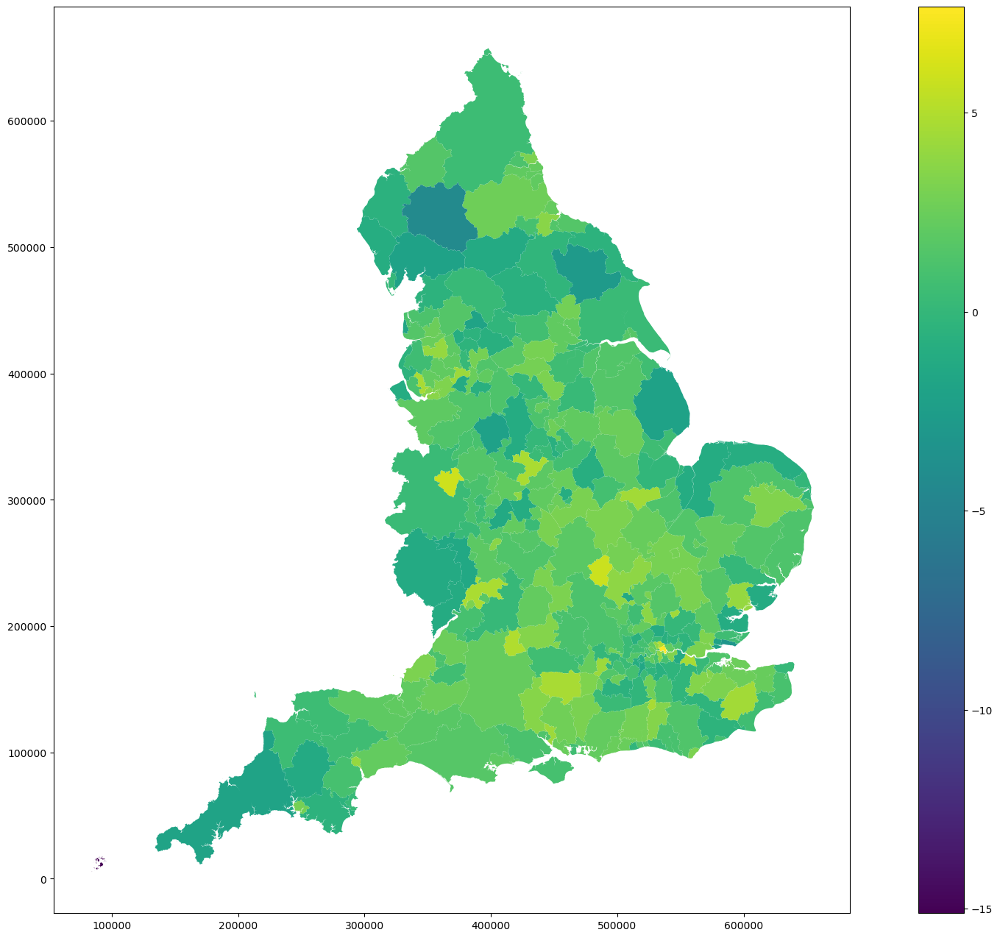

In [112]:
# Define plot size (maximise)
f,ax = plt.subplots(1, figsize=(24,16))

# Choose a variable 
merged_gdf2.plot(ax=ax, column ='epc_mi', legend=True)

# Show the map
plt.show()

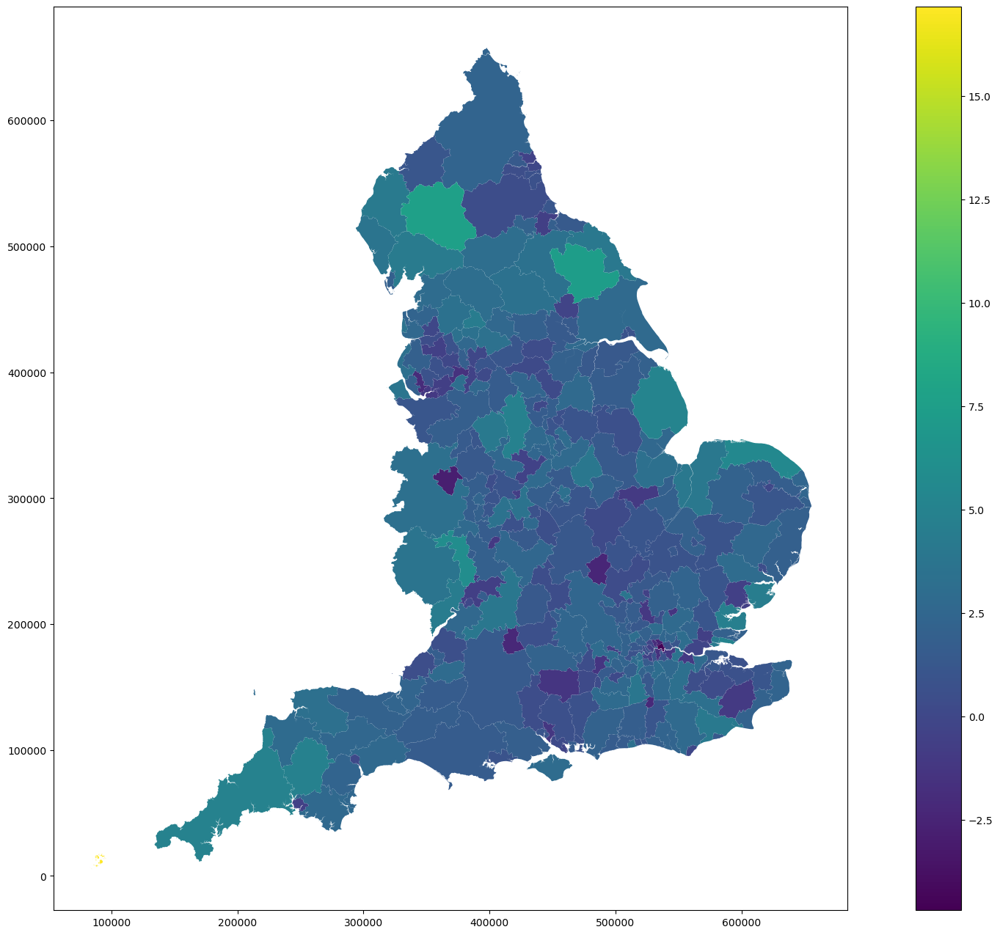

In [113]:
# The map appears to be complete even the Isles of Scilly is visible in the bottom left corner 
# An expected inverse related map can be tested by using the 'inverse' variable 'epc_mo'
# Plot the inverse map

# Define plot size
f,ax = plt.subplots(1, figsize=(24,16))

# Plot the countries, specifying to plot the population estimate column 
# Add legend (legend =True)
# vmin
merged_gdf2.plot(ax=ax, column ='epc_mo', legend=True)

# show the map
plt.show()

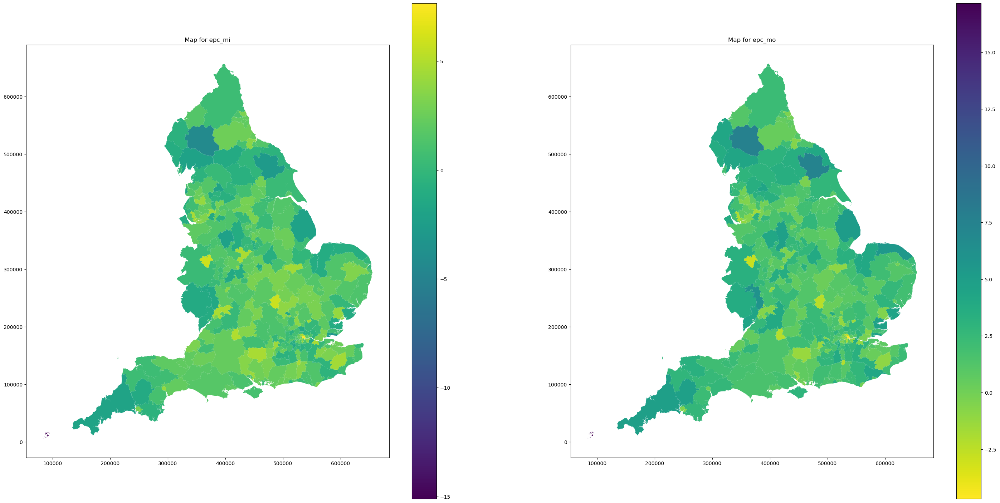

In [114]:
# To reverse the colour scale for the 'epc_mo' choropleth change cmap to 'viridis_r'.
# Print the two maps side by side [FN 17]

# Define plot size
fig, axes = plt.subplots(1, 2, figsize=(36, 18))

# Plot the first map
merged_gdf2.plot(ax=axes[0], column='epc_mi', legend=True)
axes[0].set_title('Map for epc_mi')

# Plot the second map
merged_gdf2.plot(ax=axes[1], column='epc_mo', cmap='viridis_r', legend=True)
axes[1].set_title('Map for epc_mo')

# Show the maps
plt.show()

Generally the map colours do appear to be inversely related but correlations,statistical attributes and heatmaps 
for the current columns and aggregated "mi-mo' columns will provide further evidence to determine whether the 
currently existing six mi amd mo columns should be deleted. Moving the 'distracting' geometry column will be a 
task for the final df. 

In [115]:
# Reminder of what current df looks like.

# Display df's last 5 rows
merged_gdf2.tail()

,LAD21CD,LAD21NM,geometry,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo
304,E09000029,Sutton,"POLYGON ((527681.106 167213.775, 527763.225 16...",-0.283,-0.075,-3.867,2.456,0.952,4.753
305,E09000030,Tower Hamlets,"POLYGON ((536737.742 184527.776, 536779.194 18...",7.657,1.783,-18.423,-4.688,-0.553,14.010
306,E09000031,Waltham Forest,"POLYGON ((537914.502 195745.798, 538021.498 19...",-0.707,-0.177,-6.164,2.444,1.439,4.429
307,E09000032,Wandsworth,"POLYGON ((530146.398 177732.466, 530121.321 17...",2.070,-0.750,-10.024,-0.342,1.750,8.708
308,E09000033,Westminster,"POLYGON ((526726.382 183730.554, 526773.270 18...",2.336,-0.851,-15.390,-0.553,1.480,12.051


In [116]:
# Review the statistics for the variables to consider relationships between them 

# Review the statistics
merged_gdf2.describe()

,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo
count,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000
mean,1.309023,0.692045,-0.313751,1.680168,0.582660,-3.313903
std,1.948310,1.066080,6.511748,1.871578,0.983049,7.583660
min,-15.115000,-3.917000,-28.995000,-4.688000,-2.400000,-27.579000
25%,0.206000,-0.054000,-4.738000,0.675000,-0.059000,-8.836000
50%,1.392000,0.672000,-0.393000,1.684000,0.668000,-2.467000
75%,2.449000,1.322000,4.297000,2.700000,1.201000,2.371000
max,7.657000,5.377000,28.108000,17.157000,5.247000,26.549000


In [117]:
# Reviewing the range statistics does not suggets any inaccurate variables such as additional decimal places 
# The mi amd mo for each variable have a very similar profile for mean, standard  deviation and ranges.  

# Review the correlations for the variables
merged_gdf2_numeric = merged_gdf2.select_dtypes(include=np.number)
merged_gdf2_numeric.corr()

,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo
epc_mi,1.000000,0.542524,-0.222539,-0.936730,-0.506511,0.343631
pepc_mi,0.542524,1.000000,-0.050819,-0.451698,-0.910830,0.089484
area_mi,-0.222539,-0.050819,1.000000,0.384341,0.161928,-0.912541
epc_mo,-0.936730,-0.451698,0.384341,1.000000,0.524729,-0.531101
pepc_mo,-0.506511,-0.910830,0.161928,0.524729,1.000000,-0.227783
area_mo,0.343631,0.089484,-0.912541,-0.531101,-0.227783,1.000000


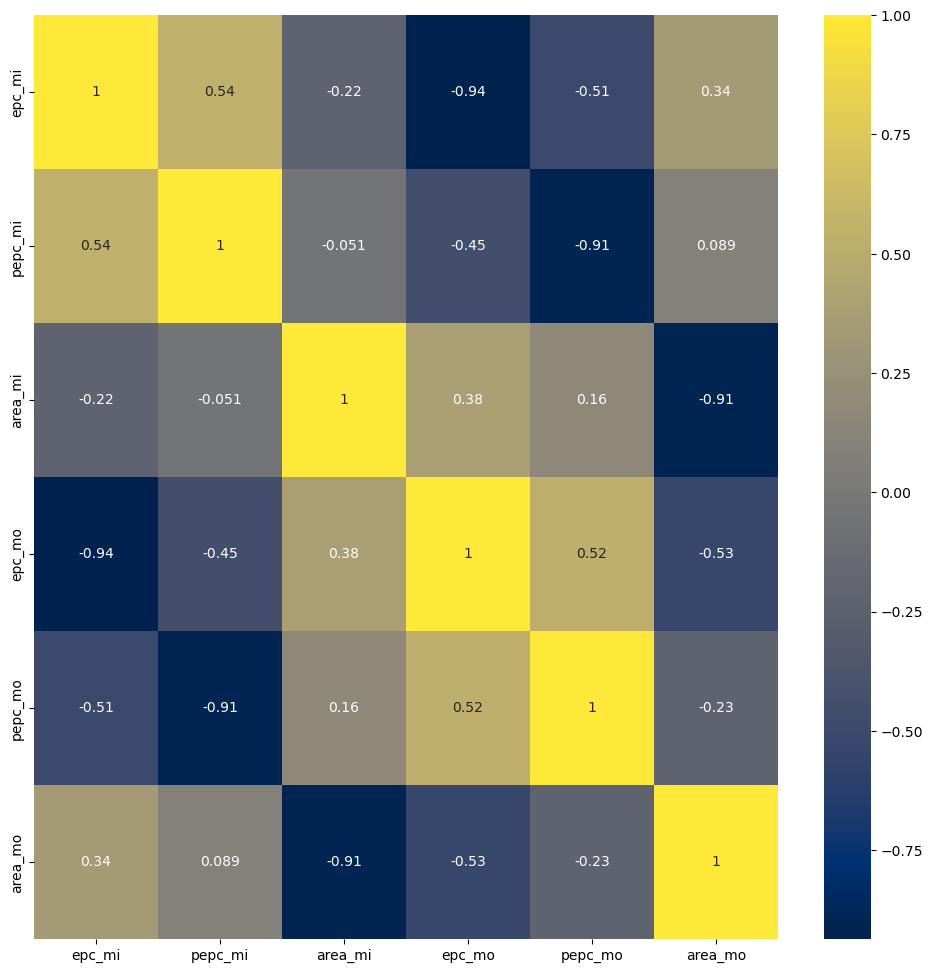

In [118]:
# There are high negative correlations for certain variables which can be easier discerned in a heatmap

# Set plot size 
plt.figure(figsize=(12,12))
 
# The colour mappimg can be made sympathic for those who are colour blind e.g.'viridis' or 'cividis' (FN 18)
sns.heatmap(merged_gdf2_numeric.corr(), annot=True, cmap='cividis');

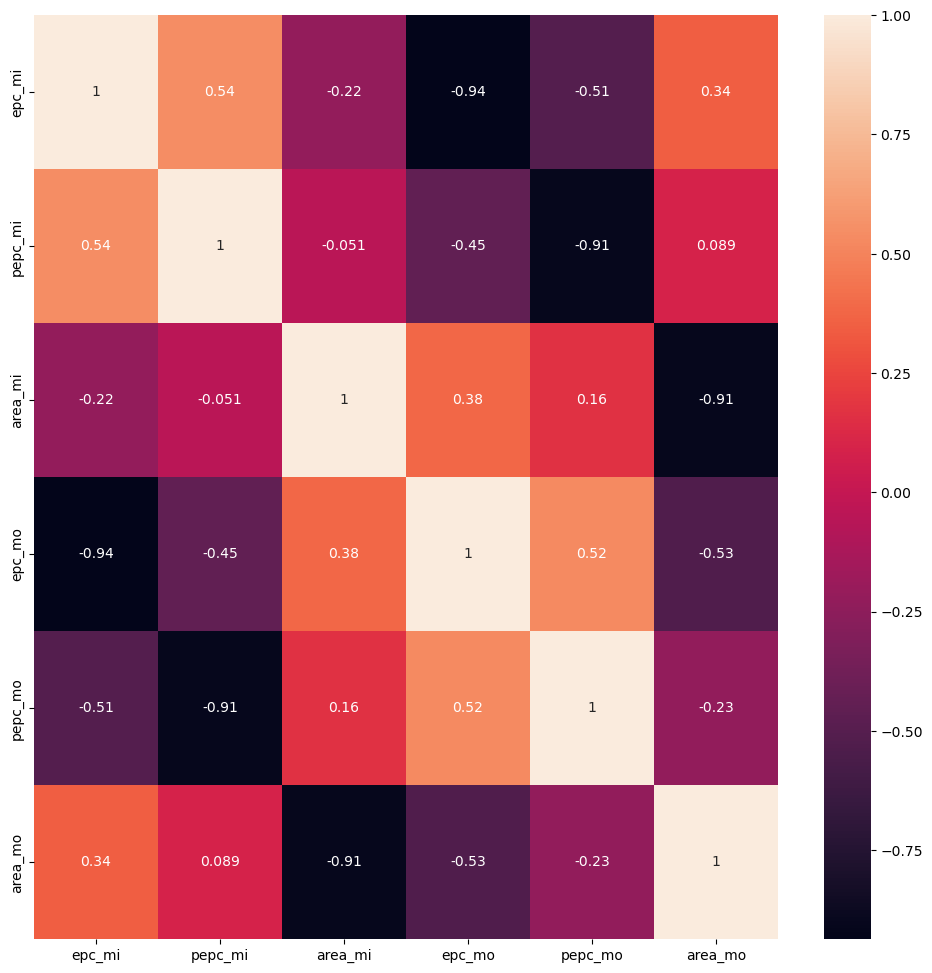

In [119]:
# Viridis is the default presentation so re-run heatmap with that colour scheme 

# Set plot size
plt.figure(figsize=(12,12))

# Plot a heatmap of the correlation table 
# The colour mappimg can be made sympathic for those who are colour blind, this time run as 'viridis'(default) 
sns.heatmap(merged_gdf2_numeric.corr(), annot=True,);

The six black squares (effectively three relationships) highlight very high negative correlations.
Test further by reviewing the 10 largest amd smallest EPC results for mi and mo.

In [120]:
# The test variable will be mean EPC change,firstly largest mo and smallest mi
print(merged_gdf2['epc_mi'].nlargest(n=10))
print(merged_gdf2['epc_mo'].nsmallest(n=10))

305    7.657
19     5.892
39     5.814
287    5.002
27     4.984
77     4.786
108    4.729
128    4.719
250    4.668
223    4.662
Name: epc_mi, dtype: float64
305   -4.688
19    -2.840
287   -2.596
39    -2.361
27    -2.291
223   -2.161
250   -2.033
294   -1.818
245   -1.598
303   -1.585
Name: epc_mo, dtype: float64


There is considerable overlap in the inverse relationships.

In [121]:
# Record the overlapping LADs for future comparison [FN 19]
column1 = 'LAD21NM'
column2 = 'epc_mi'
column3 = 'epc_mo'

# List of row numbers to print
row_numbers = [305, 19, 39, 287, 27, 250, 223]

# Print specified rows and columns
for row_number in row_numbers:
    value1 = merged_gdf2.at[row_number, column1]
    value2 = merged_gdf2.at[row_number, column2]
    value3 = merged_gdf2.at[row_number, column3]
    print(f"Row {row_number}: {value1}, {value2}, {value3}")

Row 305: Tower Hamlets, 7.657, -4.688
Row 19: Telford and Wrekin, 5.892, -2.84
Row 39: Milton Keynes, 5.814, -2.361
Row 287: Hackney, 5.002, -2.596
Row 27: Swindon, 4.984, -2.291
Row 250: Knowsley, 4.668, -2.033
Row 223: Crawley, 4.662, -2.161


In [122]:
# Record the non-overlapping rows for future comparisons 
column1 = 'LAD21NM'
column2 = 'epc_mi'
column3 = 'epc_mo'

# List of row numbers to print
row_numbers = [77, 108, 39, 128, 294, 245, 303]  

# Print specified rows and columns
for row_number in row_numbers:
    value1 = merged_gdf2.at[row_number, column1]
    value2 = merged_gdf2.at[row_number, column2]
    value3 = merged_gdf2.at[row_number, column3]
    print(f"Row {row_number}: {value1}, {value2}, {value3}")

Row 77: South Derbyshire, 4.786, -0.394
Row 108: Tewkesbury, 4.729, -0.617
Row 39: Milton Keynes, 5.814, -2.361
Row 128: Dartford, 4.719, -1.037
Row 294: Islington, 4.001, -1.818
Row 245: Salford, 4.293, -1.598
Row 303: Southwark, 3.683, -1.585


In [123]:
# For completeness test same variable in reverse

# Print out the mean EPC change,firstly smallest mi and largest mo 
print(merged_gdf2['epc_mi'].nsmallest(n=10))
print(merged_gdf2['epc_mo'].nlargest(n=10))

49    -15.115
68     -4.300
30     -3.176
175    -2.811
199    -2.130
158    -2.010
94     -1.980
69     -1.972
143    -1.915
48     -1.875
Name: epc_mi, dtype: float64
49     17.157
68      7.606
175     7.410
228     5.950
168     5.468
158     5.159
30      5.043
48      4.886
73      4.825
85      4.792
Name: epc_mo, dtype: float64


There is again considerable overlap in the inverse relationship.   


In [124]:
# Record the overlapping LADs for future comparison
column1 = 'LAD21NM'
column2 = 'epc_mi'
column3 = 'epc_mo'

# List of row numbers to print
row_numbers = [49, 68, 175, 158, 30, 48]

# Print specified rows and columns
for row_number in row_numbers:
    value1 = merged_gdf2.at[row_number, column1]
    value2 = merged_gdf2.at[row_number, column2]
    value3 = merged_gdf2.at[row_number, column3]
    print(f"Row {row_number}: {value1}, {value2}, {value3}")

Row 49: Isles of Scilly, -15.115, 17.157
Row 68: Eden, -4.3, 7.606
Row 175: Ryedale, -2.811, 7.41
Row 158: East Lindsey, -2.01, 5.159
Row 30: Southend-on-Sea, -3.176, 5.043
Row 48: Cornwall, -1.875, 4.886


In [125]:
# Record the non-overlapping rows for future comparisons 
column1 = 'LAD21NM'
column2 = 'epc_mi'
column3 = 'epc_mo'

# List of row numbers to print
row_numbers = [228, 168, 73, 85, 199, 94, 69, 143]  

# Print specified rows and columns
for row_number in row_numbers:
    value1 = merged_gdf2.at[row_number, column1]
    value2 = merged_gdf2.at[row_number, column2]
    value3 = merged_gdf2.at[row_number, column3]
    print(f"Row {row_number}: {value1}, {value2}, {value3}")

Row 228: Malvern Hills, -1.492, 5.95
Row 168: North Norfolk, -0.911, 5.468
Row 73: Derbyshire Dales, -1.137, 4.825
Row 85: West Devon, -1.248, 4.792
Row 199: Staffordshire Moorlands, -2.13, 4.117
Row 94: Castle Point, -1.98, 4.154
Row 69: South Lakeland, -1.972, 4.279
Row 143: Pendle, -1.915, 4.435


The strong inverse relationship demonstrated above between the mo amd mi columns may allow for a simplication 
by aggregation. Adjusted results will be generated by formula (mi-mo/2) to reflect inverse relationship and 
maintain similar scaling. 


In [126]:
# Start with merging mi and mo for mean EPC change
merged_gdf2['new_column'] = (merged_gdf2['epc_mi'] - merged_gdf2['epc_mo']) /2
merged_gdf2.rename(columns={'new_column': 'epc_mi-mo'}, inplace=True)
merged_gdf2.tail()

,LAD21CD,LAD21NM,geometry,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo,epc_mi-mo
304,E09000029,Sutton,"POLYGON ((527681.106 167213.775, 527763.225 16...",-0.283,-0.075,-3.867,2.456,0.952,4.753,-1.3695
305,E09000030,Tower Hamlets,"POLYGON ((536737.742 184527.776, 536779.194 18...",7.657,1.783,-18.423,-4.688,-0.553,14.010,6.1725
306,E09000031,Waltham Forest,"POLYGON ((537914.502 195745.798, 538021.498 19...",-0.707,-0.177,-6.164,2.444,1.439,4.429,-1.5755
307,E09000032,Wandsworth,"POLYGON ((530146.398 177732.466, 530121.321 17...",2.070,-0.750,-10.024,-0.342,1.750,8.708,1.2060
308,E09000033,Westminster,"POLYGON ((526726.382 183730.554, 526773.270 18...",2.336,-0.851,-15.390,-0.553,1.480,12.051,1.4445


In [127]:
# Next merging mi and mo for mean PEPC change
merged_gdf2['new_column'] = (merged_gdf2['pepc_mi'] - merged_gdf2['pepc_mo']) /2
merged_gdf2.rename(columns={'new_column': 'pepc_mi-mo'}, inplace=True)
merged_gdf2.tail()

,LAD21CD,LAD21NM,geometry,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo,epc_mi-mo,pepc_mi-mo
304,E09000029,Sutton,"POLYGON ((527681.106 167213.775, 527763.225 16...",-0.283,-0.075,-3.867,2.456,0.952,4.753,-1.3695,-0.5135
305,E09000030,Tower Hamlets,"POLYGON ((536737.742 184527.776, 536779.194 18...",7.657,1.783,-18.423,-4.688,-0.553,14.010,6.1725,1.1680
306,E09000031,Waltham Forest,"POLYGON ((537914.502 195745.798, 538021.498 19...",-0.707,-0.177,-6.164,2.444,1.439,4.429,-1.5755,-0.8080
307,E09000032,Wandsworth,"POLYGON ((530146.398 177732.466, 530121.321 17...",2.070,-0.750,-10.024,-0.342,1.750,8.708,1.2060,-1.2500
308,E09000033,Westminster,"POLYGON ((526726.382 183730.554, 526773.270 18...",2.336,-0.851,-15.390,-0.553,1.480,12.051,1.4445,-1.1655


In [128]:
# Finally merge mi and mo for mean area change
merged_gdf2['new_column'] = (merged_gdf2['area_mi'] - merged_gdf2['area_mo']) /2
merged_gdf2.rename(columns={'new_column': 'area_mi-mo'}, inplace=True)
merged_gdf2.tail()

,LAD21CD,LAD21NM,geometry,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo,epc_mi-mo,pepc_mi-mo,area_mi-mo
304,E09000029,Sutton,"POLYGON ((527681.106 167213.775, 527763.225 16...",-0.283,-0.075,-3.867,2.456,0.952,4.753,-1.3695,-0.5135,-4.3100
305,E09000030,Tower Hamlets,"POLYGON ((536737.742 184527.776, 536779.194 18...",7.657,1.783,-18.423,-4.688,-0.553,14.010,6.1725,1.1680,-16.2165
306,E09000031,Waltham Forest,"POLYGON ((537914.502 195745.798, 538021.498 19...",-0.707,-0.177,-6.164,2.444,1.439,4.429,-1.5755,-0.8080,-5.2965
307,E09000032,Wandsworth,"POLYGON ((530146.398 177732.466, 530121.321 17...",2.070,-0.750,-10.024,-0.342,1.750,8.708,1.2060,-1.2500,-9.3660
308,E09000033,Westminster,"POLYGON ((526726.382 183730.554, 526773.270 18...",2.336,-0.851,-15.390,-0.553,1.480,12.051,1.4445,-1.1655,-13.7205


In [129]:
# Having produced the new combined columns the statistics and correlations can be reviewed

# Review the statistics for all the variables 
merged_gdf2.describe()

,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo,epc_mi-mo,pepc_mi-mo,area_mi-mo
count,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000
mean,1.309023,0.692045,-0.313751,1.680168,0.582660,-3.313903,-0.185573,0.054693,1.500076
std,1.948310,1.066080,6.511748,1.871578,0.983049,7.583660,1.879503,1.001502,6.892797
min,-15.115000,-3.917000,-28.995000,-4.688000,-2.400000,-27.579000,-16.136000,-4.582000,-27.772000
25%,0.206000,-0.054000,-4.738000,0.675000,-0.059000,-8.836000,-1.215000,-0.644500,-3.574000
50%,1.392000,0.672000,-0.393000,1.684000,0.668000,-2.467000,-0.147000,0.015500,1.253000
75%,2.449000,1.322000,4.297000,2.700000,1.201000,2.371000,0.921000,0.643000,6.453500
max,7.657000,5.377000,28.108000,17.157000,5.247000,26.549000,6.172500,3.888500,27.843500


In [130]:
# Review the correlations for the variables
merged_gdf2_numeric = merged_gdf2.select_dtypes(include=np.number)
merged_gdf2_numeric.corr()

,epc_mi,pepc_mi,area_mi,epc_mo,pepc_mo,area_mo,epc_mi-mo,pepc_mi-mo,area_mi-mo
epc_mi,1.000000,0.542524,-0.222539,-0.936730,-0.506511,0.343631,0.984695,0.537342,-0.294155
pepc_mi,0.542524,1.000000,-0.050819,-0.451698,-0.910830,0.089484,0.506089,0.979264,-0.073231
area_mi,-0.222539,-0.050819,1.000000,0.384341,0.161928,-0.912541,-0.306703,-0.106520,0.974361
epc_mo,-0.936730,-0.451698,0.384341,1.000000,0.524729,-0.531101,-0.983403,-0.497942,0.473714
pepc_mo,-0.506511,-0.910830,0.161928,0.524729,1.000000,-0.227783,-0.523785,-0.975568,0.201795
area_mo,0.343631,0.089484,-0.912541,-0.531101,-0.227783,1.000000,0.442537,0.159420,-0.981162
epc_mi-mo,0.984695,0.506089,-0.306703,-0.983403,-0.523785,0.442537,1.000000,0.526428,-0.388320
pepc_mi-mo,0.537342,0.979264,-0.106520,-0.497942,-0.975568,0.159420,0.526428,1.000000,-0.138015
area_mi-mo,-0.294155,-0.073231,0.974361,0.473714,0.201795,-0.981162,-0.388320,-0.138015,1.000000


Many high positive and negative correlations but heat map and scatter diagram for all combination of 
variables may highlight correlation patterns. 

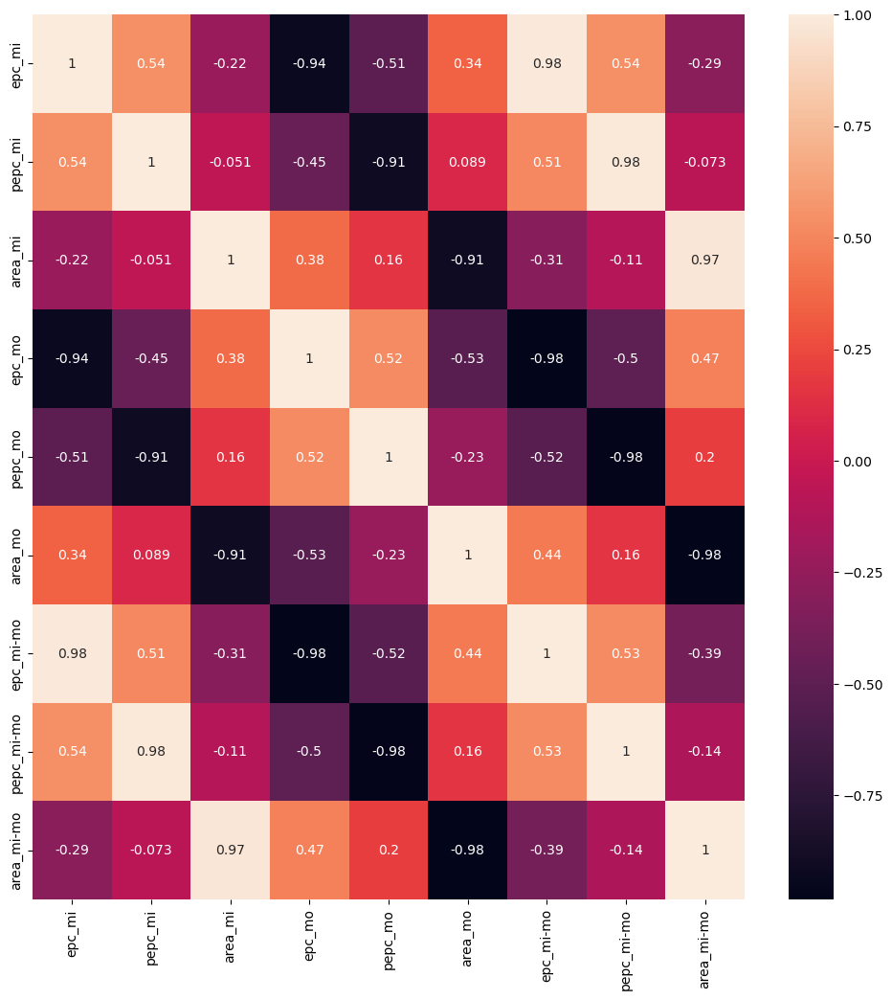

In [131]:
# Print heatmap [FN20]

# Set plot size
plt.figure(figsize=(12,12))

# Plot a heatmap of the correlation tabe 
# The colour mappimg can be made sympathic for those who are colour blind, this time run as 'viridis'(default) 
sns.heatmap(merged_gdf2_numeric.corr(), annot=True,);

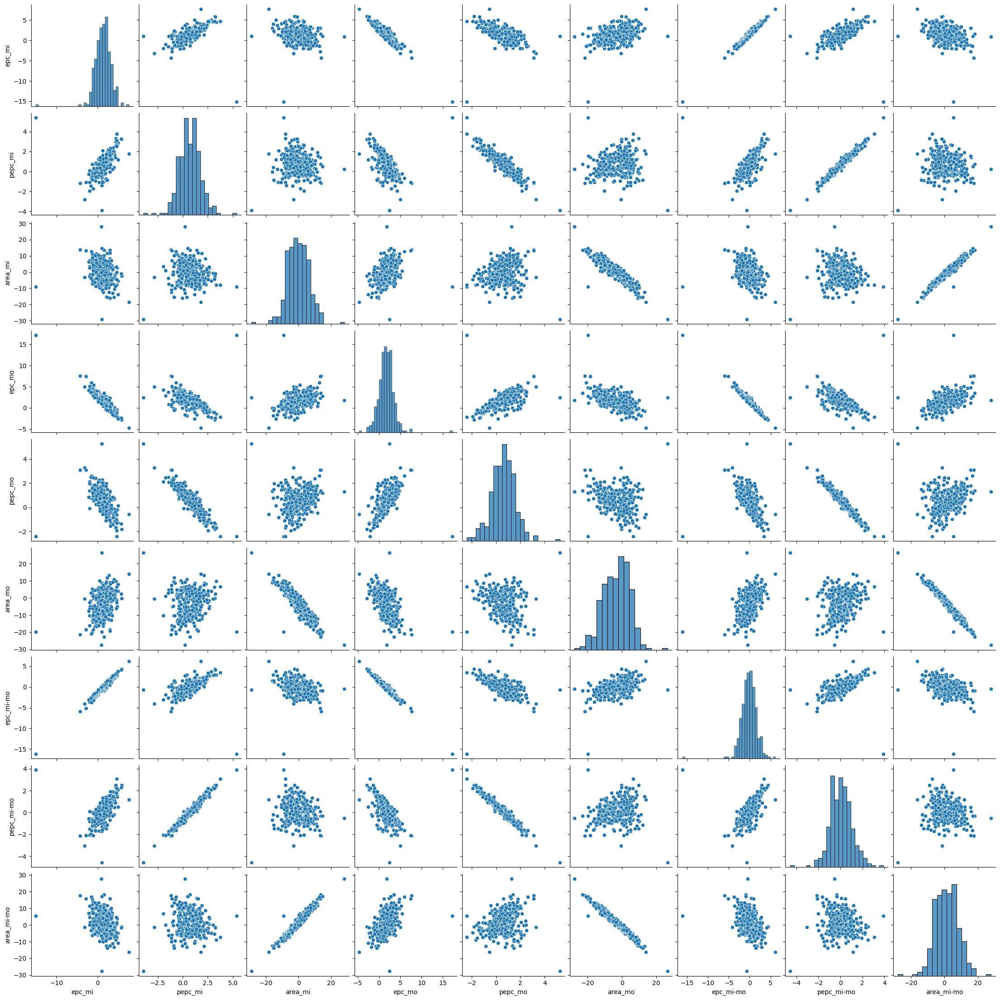

In [132]:
# An alternative way to compare all the variables is to plot each scatter diagram individually

# run all combination of variables  
sns.pairplot(merged_gdf2);

There is strong scatter diagram patterning and sufficent strength of correlations (either over 0.9 or under -0.9) 
for the three variables to consider removing the six mo and mi columns but run further check on a granular
level.

In [133]:
# Find the ten largest mean EPC changes for mi-mo column  
print(merged_gdf2['epc_mi-mo'].nlargest(n=10))

# Find the ten largest mean EPC changes for mi column  
print(merged_gdf2['epc_mi'].nlargest(n=10))

# Find the ten smallest mean EPC changes for mo column  
print(merged_gdf2['epc_mo'].nsmallest(n=10))

305    6.1725
19     4.3660
39     4.0875
287    3.7990
27     3.6375
223    3.4115
250    3.3505
109    2.9780
245    2.9455
294    2.9095
Name: epc_mi-mo, dtype: float64
305    7.657
19     5.892
39     5.814
287    5.002
27     4.984
77     4.786
108    4.729
128    4.719
250    4.668
223    4.662
Name: epc_mi, dtype: float64
305   -4.688
19    -2.840
287   -2.596
39    -2.361
27    -2.291
223   -2.161
250   -2.033
294   -1.818
245   -1.598
303   -1.585
Name: epc_mo, dtype: float64


The only mi-mo LAD not in either mi or mo is 109 (so run a check on this row ) 

In [134]:
selected_rows = merged_gdf2.iloc[[109]]
print(selected_rows)

       LAD21CD                LAD21NM  \
109  E07000084  Basingstoke and Deane   

                                              geometry  epc_mi  pepc_mi  \
109  POLYGON ((464131.899 164354.703, 464280.096 16...   4.646    2.501   

     area_mi  epc_mo  pepc_mo  area_mo  epc_mi-mo  pepc_mi-mo  area_mi-mo  
109   -0.075   -1.31    -1.05   -2.581      2.978      1.7755       1.253  


In [135]:
#Run the same test for mi-mo 10 smallest

# Find the ten largest mean EPC changes for mi-mo column  
print(merged_gdf2['epc_mi-mo'].nsmallest(n=10))

# Find the ten largest mean EPC changes for mi column  
print(merged_gdf2['epc_mi'].nsmallest(n=10))

# Find the ten smallest mean EPC changes for mo column  
print(merged_gdf2['epc_mo'].nlargest(n=10))

49    -16.1360
68     -5.9530
175    -5.1105
30     -4.1095
228    -3.7210
158    -3.5845
48     -3.3805
168    -3.1895
143    -3.1750
69     -3.1255
Name: epc_mi-mo, dtype: float64
49    -15.115
68     -4.300
30     -3.176
175    -2.811
199    -2.130
158    -2.010
94     -1.980
69     -1.972
143    -1.915
48     -1.875
Name: epc_mi, dtype: float64
49     17.157
68      7.606
175     7.410
228     5.950
168     5.468
158     5.159
30      5.043
48      4.886
73      4.825
85      4.792
Name: epc_mo, dtype: float64


There is no mi-mo LAD listed not in either the mi or mo list. 
This additional evidence therefore provides reliance that retaining just the mi-mo columns is not overly distorting

In [136]:
# Specify the column(s) to delete [FN 21]
columns_to_delete = ['epc_mo', 'pepc_mo', 'area_mo', 'epc_mi', 'pepc_mi', 'area_mi']

# Use the drop method to delete columns
merged_gdf2 = merged_gdf2.drop(columns = columns_to_delete)

# Print the modified df 
merged_gdf2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   LAD21CD     309 non-null    object  
 1   LAD21NM     309 non-null    object  
 2   geometry    309 non-null    geometry
 3   epc_mi-mo   309 non-null    float64 
 4   pepc_mi-mo  309 non-null    float64 
 5   area_mi-mo  309 non-null    float64 
dtypes: float64(3), geometry(1), object(2)
memory usage: 14.6+ KB


In [137]:
# Having reduced the columns to those required, 
# Geometry column can be relegated to the final column to help readability [FN 22]

# Move geometry column to last column (column 5)
geometry_column = merged_gdf2.pop('geometry')
merged_gdf2.insert(5, 'geometry', geometry_column)

# Check column ordering
merged_gdf2.columns

Index(['LAD21CD', 'LAD21NM', 'epc_mi-mo', 'pepc_mi-mo', 'area_mi-mo',
       'geometry'],
      dtype='object')

In [138]:
# Display revised df 

# Display df's first 5 rows
merged_gdf2.head()

,LAD21CD,LAD21NM,epc_mi-mo,pepc_mi-mo,area_mi-mo,geometry
0,E06000001,Hartlepool,0.5590,-0.0955,6.6655,"MULTIPOLYGON (((450153.600 525935.876, 450139...."
1,E06000002,Middlesbrough,-0.1840,0.6880,-4.3590,"MULTIPOLYGON (((446860.000 517200.300, 446854...."
2,E06000003,Redcar and Cleveland,0.0770,0.7230,-2.2815,"MULTIPOLYGON (((451747.397 520561.100, 451787...."
3,E06000004,Stockton-on-Tees,2.1050,0.6085,-0.8380,"MULTIPOLYGON (((447214.196 517857.904, 447186...."
4,E06000005,Darlington,-0.6165,-0.0915,-0.6920,"POLYGON ((423475.701 524731.597, 423497.204 52..."


In [139]:
# Display df's last 5 rows
merged_gdf2.tail()

,LAD21CD,LAD21NM,epc_mi-mo,pepc_mi-mo,area_mi-mo,geometry
304,E09000029,Sutton,-1.3695,-0.5135,-4.3100,"POLYGON ((527681.106 167213.775, 527763.225 16..."
305,E09000030,Tower Hamlets,6.1725,1.1680,-16.2165,"POLYGON ((536737.742 184527.776, 536779.194 18..."
306,E09000031,Waltham Forest,-1.5755,-0.8080,-5.2965,"POLYGON ((537914.502 195745.798, 538021.498 19..."
307,E09000032,Wandsworth,1.2060,-1.2500,-9.3660,"POLYGON ((530146.398 177732.466, 530121.321 17..."
308,E09000033,Westminster,1.4445,-1.1655,-13.7205,"POLYGON ((526726.382 183730.554, 526773.270 18..."


In [140]:
# Before introducing more variables, take stock of existing statistical information

# Review the statistics for all the variables 
merged_gdf2.describe()

,epc_mi-mo,pepc_mi-mo,area_mi-mo
count,309.000000,309.000000,309.000000
mean,-0.185573,0.054693,1.500076
std,1.879503,1.001502,6.892797
min,-16.136000,-4.582000,-27.772000
25%,-1.215000,-0.644500,-3.574000
50%,-0.147000,0.015500,1.253000
75%,0.921000,0.643000,6.453500
max,6.172500,3.888500,27.843500


In [141]:
# Review correlation of remaining variabes
merged_gdf2_numeric = merged_gdf2.select_dtypes(include=np.number)
merged_gdf2_numeric.corr()

,epc_mi-mo,pepc_mi-mo,area_mi-mo
epc_mi-mo,1.000000,0.526428,-0.388320
pepc_mi-mo,0.526428,1.000000,-0.138015
area_mi-mo,-0.388320,-0.138015,1.000000


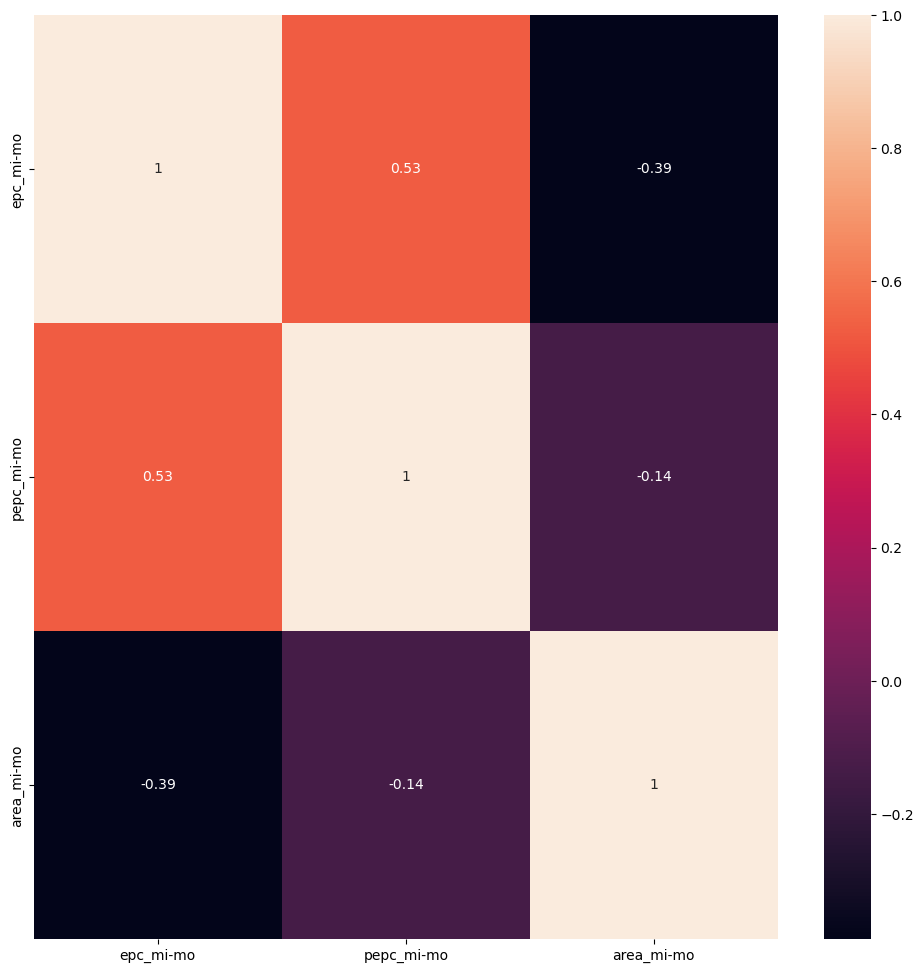

In [142]:
# The correlation can be easier to discern in a heatmap

# Plot size to fill avaialble space
plt.figure(figsize=(12,12))

# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
# the colour mapping by default is 'viridis' so sympathetic for the colour blind [FN 23]
sns.heatmap(merged_gdf2_numeric.corr(), annot=True,);

Whilst the main variable under analysis is the change in mean EPC ,the other variables are retained 
The remaining important variable (hypothetical the dependent varaible) can now be added to the df. 
The dataframe is related to Fuel Poverty FP and is taken from the Government statistics for English LADs
for 2021 [FN 24].LAD reorganisations between the data collection dates for EPC and FP necessitates some 
simplyfing adjustments  

In [143]:
# Path to the next required CSV file [FN 25]
file_path = '/Users/user/Documents/GEOG5995-main/fuel_poor.csv'

# Read in the CSV file and name DataFrame(df)
fuel_poor = pd.read_csv(file_path)

# Display df's first 5 rows
fuel_poor.head()

,Area Codes,Area names,Unnamed: 2,Unnamed: 3,Nu of households,Nu in fuel poverty,Fuel poor (%)
0,E92000001,ENGLAND,NaN,NaN,"24,070,861","3,162,752",13.1
1,E12000001,NORTH EAST,NaN,NaN,"1,202,496","168,751",14.0
2,E06000047,NaN,County Durham,NaN,"239,995","35,210",14.7
3,E06000005,NaN,Darlington,NaN,"50,028","7,255",14.5
4,E06000001,NaN,Hartlepool,NaN,"41,885","5,993",14.3


In [144]:
# Display df's last 5 rows
fuel_poor.tail()

,Area Codes,Area names,Unnamed: 2,Unnamed: 3,Nu of households,Nu in fuel poverty,Fuel poor (%)
330,E07000079,NaN,NaN,Cotswold,"42,111","5,303",12.6
331,E07000080,NaN,NaN,Forest of Dean,"38,537","5,491",14.2
332,E07000081,NaN,NaN,Gloucester,"57,445","6,023",10.5
333,E07000082,NaN,NaN,Stroud,"54,209","6,196",11.4
334,E07000083,NaN,NaN,Tewkesbury,"42,457","3,628",8.5


In [145]:
# review the columns of the df
fuel_poor.columns

Index(['Area Codes ', 'Area names ', 'Unnamed: 2', 'Unnamed: 3',
       'Nu of households', 'Nu in fuel poverty', 'Fuel poor (%)'],
      dtype='object')

Description of columns[FN 26]:

Area Codes :  This is the equivalent of the 'laua21' column in the EPC df but is more extensive 

Area names : Highest level of aggragation of LADs 

Unnamed: 2 : Includes LADs but also aggregation of LADs into counties 

Unnamed: 3 : Disaggregation of counties into LADs 

Nu of households : Number of households in the area 

Nu in fuel poverty : Number of households that are classified as in FP 

Fuel poor (%) : Percentage of households classified as FP in that area. 

In [146]:
# review the shape of the df  
fuel_poor.shape

(335, 7)

In [147]:
# review the  of the df 
fuel_poor.index

RangeIndex(start=0, stop=335, step=1)

In [148]:
# information confirms 335 rows (0-334) and 7 columns

# check no duplicated rows [FN 27]
is_duplicate = rmepc.duplicated()
fuel_poor['IsDuplicate'] = is_duplicate
print(fuel_poor)

    Area Codes  Area names      Unnamed: 2      Unnamed: 3 Nu of households  \
0     E92000001     ENGLAND            NaN             NaN       24,070,861   
1     E12000001  NORTH EAST            NaN             NaN        1,202,496   
2     E06000047         NaN  County Durham             NaN          239,995   
3     E06000005         NaN     Darlington             NaN           50,028   
4     E06000001         NaN     Hartlepool             NaN           41,885   
..          ...         ...            ...             ...              ...   
330   E07000079         NaN            NaN        Cotswold           42,111   
331   E07000080         NaN            NaN  Forest of Dean           38,537   
332   E07000081         NaN            NaN      Gloucester           57,445   
333   E07000082         NaN            NaN          Stroud           54,209   
334   E07000083         NaN            NaN      Tewkesbury           42,457   

    Nu in fuel poverty  Fuel poor (%) IsDuplicate  

In [149]:
# The df isn't printed out in full (just head and tail)

# The whole list is checked for duplications [FN 28]
is_duplicate = fuel_poor.duplicated()
false_count = (is_duplicate == False).sum()
print(false_count)

335


In [150]:
# Information confirms 335 rows and no duplications

# Display df's info -shape, columns, non-null columns and Dtypes 
fuel_poor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 335 entries, 0 to 334
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Area Codes          335 non-null    object 
 1   Area names          10 non-null     object 
 2   Unnamed: 2          92 non-null     object 
 3   Unnamed: 3          233 non-null    object 
 4   Nu of households    335 non-null    object 
 5   Nu in fuel poverty  335 non-null    object 
 6   Fuel poor (%)       335 non-null    float64
 7   IsDuplicate         309 non-null    object 
dtypes: float64(1), object(7)
memory usage: 21.1+ KB


'IsDuplicate' is not as expected a bool will be deleted later
'Nu of households' and 'Nu in fuel Poverty' are not as required an interger nor decimal(float64)


In [151]:
# First change the dtype for 'Nu of households'[FN 29]

# If the data type is not already a string, coerce it to string
fuel_poor['Nu of households'] = fuel_poor['Nu of households'].astype(str)

# Replace commas and convert the column to numeric
fuel_poor['Nu of households'] = pd.to_numeric(fuel_poor['Nu of households'].str.replace(',', ''), errors='coerce')

# Convert NaN to 0 (or any other value you prefer)
fuel_poor['Nu of households'] = fuel_poor['Nu of households'].fillna(0)

# Convert the column to integers
fuel_poor['Nu of households'] = fuel_poor['Nu of households'].astype(int)

# Now you can perform operations on the 'Nu of households' column as integers
total_households = fuel_poor['Nu of households'].sum()

# Check the data types of the 'Nu of households' column
print(fuel_poor['Nu of households'].dtype)

print(f'Total Number of Households: {total_households}')

int64
Total Number of Households: 89221993


In [152]:
# Now convert 'Nu in fuel poverty'[FN 30]

# If the data type is not already a string, coerce it to string
fuel_poor['Nu in fuel poverty'] = fuel_poor['Nu in fuel poverty'].astype(str)

# Replace commas and convert the column to numeric
fuel_poor['Nu in fuel poverty'] = pd.to_numeric(fuel_poor['Nu in fuel poverty'].str.replace(',', ''), errors='coerce')

# Convert NaN to 0 (or any other value you prefer)
fuel_poor['Nu in fuel poverty'] = fuel_poor['Nu in fuel poverty'].fillna(0)

# Convert the column to integers
fuel_poor['Nu in fuel poverty'] = fuel_poor['Nu in fuel poverty'].astype(int)

# Now you can perform operations on the 'Nu of households' column as integers
total_poor = fuel_poor['Nu in fuel poverty'].sum()

# Check the data types of the 'Nu of households' column
print(fuel_poor['Nu in fuel poverty'].dtype)

print(f'Total Poor: {total_poor}')

int64
Total Poor: 11732750


In [153]:
# Display df's info -shape, columns, non-null columns and datatypes(Dtype) 
fuel_poor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 335 entries, 0 to 334
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Area Codes          335 non-null    object 
 1   Area names          10 non-null     object 
 2   Unnamed: 2          92 non-null     object 
 3   Unnamed: 3          233 non-null    object 
 4   Nu of households    335 non-null    int64  
 5   Nu in fuel poverty  335 non-null    int64  
 6   Fuel poor (%)       335 non-null    float64
 7   IsDuplicate         309 non-null    object 
dtypes: float64(1), int64(2), object(5)
memory usage: 21.1+ KB


In [154]:
# Before conforming FP df to EPC df useful information may be contained in the aggregations, so review 10 largest
fuel_poor['Nu of households'].nlargest(n=10)

0      24070861
234     3885656
198     3613195
15      3219948
147     2657627
305     2537861
112     2485596
54      2393859
214     2125164
72      2074623
Name: Nu of households, dtype: int64

In [155]:
# Review these rows  

# List rows and print
selected_rows = fuel_poor.iloc[[0, 234, 198, 15, 147, 305, 112, 54, 214, 72]]
print(selected_rows)

    Area Codes                Area names     Unnamed: 2 Unnamed: 3  \
0     E92000001                   ENGLAND           NaN        NaN   
234   E12000008                SOUTH EAST           NaN        NaN   
198   E12000007                    LONDON           NaN        NaN   
15    E12000002               NORTH WEST            NaN        NaN   
147   E12000006                      EAST           NaN        NaN   
305   E12000009                SOUTH WEST           NaN        NaN   
112   E12000005             WEST MIDLANDS           NaN        NaN   
54    E12000003  YORKSHIRE AND THE HUMBER           NaN        NaN   
214   E13000002                       NaN  Outer London        NaN   
72    E12000004             EAST MIDLANDS           NaN        NaN   

     Nu of households  Nu in fuel poverty  Fuel poor (%) IsDuplicate  
0            24070861             3162752           13.1       False  
234           3885656              327063            8.4       False  
198           36

Row 0 (England) and 198 (London) will be useful as a check later. LADs codes begin with E0 (nation,regions and
counties do not)[FN 31] 

In [156]:
# To retain only the lower level regions ie.LADs, retain E0 codes only [FN 32]
fuel_poorE0 = fuel_poor[fuel_poor['Area Codes '].str.startswith('E0')]

# Print the modified df
print(fuel_poorE0)

    Area Codes  Area names       Unnamed: 2      Unnamed: 3  Nu of households  \
2     E06000047         NaN   County Durham             NaN            239995   
3     E06000005         NaN      Darlington             NaN             50028   
4     E06000001         NaN      Hartlepool             NaN             41885   
5     E06000002         NaN   Middlesbrough             NaN             61626   
6     E06000057         NaN  Northumberland             NaN            150253   
..          ...         ...             ...             ...               ...   
330   E07000079         NaN             NaN        Cotswold             42111   
331   E07000080         NaN             NaN  Forest of Dean             38537   
332   E07000081         NaN             NaN      Gloucester             57445   
333   E07000082         NaN             NaN          Stroud             54209   
334   E07000083         NaN             NaN      Tewkesbury             42457   

     Nu in fuel poverty  Fu

In [157]:
# Check the modified df for dtypes and non-null counts 
fuel_poorE0.info()

<class 'pandas.core.frame.DataFrame'>
Index: 296 entries, 2 to 334
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Area Codes          296 non-null    object 
 1   Area names          0 non-null      object 
 2   Unnamed: 2          63 non-null     object 
 3   Unnamed: 3          233 non-null    object 
 4   Nu of households    296 non-null    int64  
 5   Nu in fuel poverty  296 non-null    int64  
 6   Fuel poor (%)       296 non-null    float64
 7   IsDuplicate         272 non-null    object 
dtypes: float64(1), int64(2), object(5)
memory usage: 20.8+ KB


In [158]:
# IsDuplicate is marked for deletion (so discrepancies are ignored) and Unnamed 2 and 3 add to 296 "objetcs"

# Cross check the modified df for missing values
fuel_poorE0.isna().sum()

Area Codes              0
Area names            296
Unnamed: 2            233
Unnamed: 3             63
Nu of households        0
Nu in fuel poverty      0
Fuel poor (%)           0
IsDuplicate            24
dtype: int64

In [159]:
# Check the shape
fuel_poorE0.shape

(296, 8)

In [160]:
# Check the full amounts for households in England has been retained 
print(fuel_poor.iloc[0])

print(fuel_poorE0['Nu of households'].sum())

print(fuel_poorE0['Nu in fuel poverty'].sum())

Area Codes            E92000001
Area names              ENGLAND
Unnamed: 2                  NaN
Unnamed: 3                  NaN
Nu of households       24070861
Nu in fuel poverty      3162752
Fuel poor (%)              13.1
IsDuplicate               False
Name: 0, dtype: object
24070861
3162752


In [161]:
# The sum for E0 in both interger columns is the same as original fuel poor df result for England 

# Check the first five rows
fuel_poorE0.head()

,Area Codes,Area names,Unnamed: 2,Unnamed: 3,Nu of households,Nu in fuel poverty,Fuel poor (%),IsDuplicate
2,E06000047,NaN,County Durham,NaN,239995,35210,14.7,False
3,E06000005,NaN,Darlington,NaN,50028,7255,14.5,False
4,E06000001,NaN,Hartlepool,NaN,41885,5993,14.3,False
5,E06000002,NaN,Middlesbrough,NaN,61626,10244,16.6,False
6,E06000057,NaN,Northumberland,NaN,150253,20676,13.8,False


In [162]:
# Check the last five rows
fuel_poorE0.tail()

,Area Codes,Area names,Unnamed: 2,Unnamed: 3,Nu of households,Nu in fuel poverty,Fuel poor (%),IsDuplicate
330,E07000079,NaN,NaN,Cotswold,42111,5303,12.6,NaN
331,E07000080,NaN,NaN,Forest of Dean,38537,5491,14.2,NaN
332,E07000081,NaN,NaN,Gloucester,57445,6023,10.5,NaN
333,E07000082,NaN,NaN,Stroud,54209,6196,11.4,NaN
334,E07000083,NaN,NaN,Tewkesbury,42457,3628,8.5,NaN


In [163]:
# Reset index for missing rows [FN 33]
fuel_poorE0.reset_index(drop=True, inplace=True)

# Check the ten LADs with most households to confirm no obvious LAD exceptions   
print(fuel_poorE0['Nu of households'].nlargest(n=10))

114    433435
60     350738
51     281927
272    259453
277    259265
0      239995
56     238442
207    224846
281    223094
22     219107
Name: Nu of households, dtype: int64


In [164]:
# List rows and then print
selected_rows = fuel_poorE0.iloc[[114, 60, 51, 272, 277, 0, 56, 207, 281, 22]]
print(selected_rows)

    Area Codes  Area names        Unnamed: 2  Unnamed: 3  Nu of households  \
114   E08000025         NaN              NaN  Birmingham            433435   
60    E08000035         NaN              NaN      Leeds             350738   
51    E06000065         NaN  North Yorkshire         NaN            281927   
272   E06000052         NaN         Cornwall         NaN            259453   
277   E06000066         NaN        Somerset          NaN            259265   
0     E06000047         NaN    County Durham         NaN            239995   
56    E08000019         NaN              NaN   Sheffield            238442   
207   E06000060         NaN  Buckinghamshire         NaN            224846   
281   E06000054         NaN        Wiltshire         NaN            223094   
22    E08000003         NaN              NaN  Manchester            219107   

     Nu in fuel poverty  Fuel poor (%) IsDuplicate  
114              100512           23.2       False  
60                55274           1

No obvious problems with Area Codes and LADs.
Delete 'redundant' columns.

In [165]:
# Final review 
fuel_poorE0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296 entries, 0 to 295
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Area Codes          296 non-null    object 
 1   Area names          0 non-null      object 
 2   Unnamed: 2          63 non-null     object 
 3   Unnamed: 3          233 non-null    object 
 4   Nu of households    296 non-null    int64  
 5   Nu in fuel poverty  296 non-null    int64  
 6   Fuel poor (%)       296 non-null    float64
 7   IsDuplicate         272 non-null    object 
dtypes: float64(1), int64(2), object(5)
memory usage: 18.6+ KB


In [166]:
# IsDuplicate non-null count is puzzling but is amongst columns that are not required and so can be removed 

# Specify the columns to delete
columns_to_delete = ['Area names ', 'IsDuplicate']

# Delete columns
fuel_poorE0 = fuel_poorE0.drop(columns=columns_to_delete)

# Print the new df
fuel_poorE0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 296 entries, 0 to 295
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Area Codes          296 non-null    object 
 1   Unnamed: 2          63 non-null     object 
 2   Unnamed: 3          233 non-null    object 
 3   Nu of households    296 non-null    int64  
 4   Nu in fuel poverty  296 non-null    int64  
 5   Fuel poor (%)       296 non-null    float64
dtypes: float64(1), int64(2), object(3)
memory usage: 14.0+ KB


In [167]:
# Review revised df first five rows
fuel_poorE0.head()

,Area Codes,Unnamed: 2,Unnamed: 3,Nu of households,Nu in fuel poverty,Fuel poor (%)
0,E06000047,County Durham,NaN,239995,35210,14.7
1,E06000005,Darlington,NaN,50028,7255,14.5
2,E06000001,Hartlepool,NaN,41885,5993,14.3
3,E06000002,Middlesbrough,NaN,61626,10244,16.6
4,E06000057,Northumberland,NaN,150253,20676,13.8


In [168]:
# Review revised df last five rows
fuel_poorE0.tail()

,Area Codes,Unnamed: 2,Unnamed: 3,Nu of households,Nu in fuel poverty,Fuel poor (%)
291,E07000079,NaN,Cotswold,42111,5303,12.6
292,E07000080,NaN,Forest of Dean,38537,5491,14.2
293,E07000081,NaN,Gloucester,57445,6023,10.5
294,E07000082,NaN,Stroud,54209,6196,11.4
295,E07000083,NaN,Tewkesbury,42457,3628,8.5


In [169]:
# Review revised df shape
fuel_poorE0.shape    

(296, 6)

In [170]:
# Sample df for 10 largest FP percentages
print(fuel_poorE0['Fuel poor (%)'].nlargest(n=10))

114    23.2
99     22.9
120    21.8
115    20.8
117    20.6
13     20.2
48     19.9
35     19.8
119    19.7
30     19.6
Name: Fuel poor (%), dtype: float64


In [171]:
# Print the rows for these largest 10
selected_rows = fuel_poorE0.iloc[[ 114, 99, 120, 115, 117, 13, 48, 35, 119, 30 ]]
print(selected_rows)

    Area Codes                    Unnamed: 2     Unnamed: 3  Nu of households  \
114   E08000025                          NaN     Birmingham            433435   
99    E06000021               Stoke-on-Trent            NaN            113041   
120   E08000031                          NaN  Wolverhampton            107600   
115   E08000026                          NaN       Coventry            137313   
117   E08000028                          NaN      Sandwell             133202   
13    E06000009                    Blackpool            NaN             66217   
48    E06000010  Kingston upon Hull, City of            NaN            118603   
35    E07000122                          NaN         Pendle             38885   
119   E08000030                          NaN        Walsall            114794   
30    E07000117                          NaN        Burnley             40699   

     Nu in fuel poverty  Fuel poor (%)  
114              100512           23.2  
99                25897   

In [172]:
# Sample df for 10 smallest FP percentages
print(fuel_poorE0['Fuel poor (%)'].nsmallest(n=10))

205    5.2
217    5.3
173    5.4
228    5.7
225    5.9
258    5.9
226    6.0
210    6.3
223    6.3
265    6.6
Name: Fuel poor (%), dtype: float64


In [173]:
# To check the new df logic the smallest mean_epc_changes for mi-mo should be similar to those for mo (see above)     review the rows

# List rows and then print
selected_rows = fuel_poorE0.iloc[[205, 217, 173, 228, 258, 226, 210, 223, 265,]]
print(selected_rows)

    Area Codes         Unnamed: 2             Unnamed: 3  Nu of households  \
205   E06000036  Bracknell Forest                    NaN             51360   
217   E06000041         Wokingham                    NaN             70605   
173   E09000001               NaN         City of London              5157   
228   E07000089               NaN                   Hart             40782   
258   E07000214               NaN           Surrey Heath             36740   
226   E07000087               NaN                Fareham             49602   
210   E06000042     Milton Keynes                    NaN            115439   
223   E07000084               NaN  Basingstoke and Deane             78246   
265   E07000226               NaN                Crawley             46474   

     Nu in fuel poverty  Fuel poor (%)  
205                2669            5.2  
217                3726            5.3  
173                 279            5.4  
228                2332            5.7  
258           

The final FP df ('fuel_poorE0') appears in order for final merger with the final EPC and shp file ('merged_gdf2')
can be undertaken. By merging both 'left' and 'right' missing information/data can be identified and 
resolved/estimated.

In [174]:
# Reminder of column names for both dfs
print("Columns in df1:", fuel_poorE0.columns)
print("Columns in df2:", merged_gdf2.columns)

Columns in df1: Index(['Area Codes ', 'Unnamed: 2', 'Unnamed: 3', 'Nu of households',
       'Nu in fuel poverty', 'Fuel poor (%)'],
      dtype='object')
Columns in df2: Index(['LAD21CD', 'LAD21NM', 'epc_mi-mo', 'pepc_mi-mo', 'area_mi-mo',
       'geometry'],
      dtype='object')


In [175]:
# Rename the column in the CSV data to match the column name in the shapefile
merged_gdf2 = merged_gdf2.rename(columns={'LAD21CD': 'Area Codes '})

# Merge the data using the common identifier
triple_gdf = merged_gdf2.merge(fuel_poorE0, on='Area Codes ', how='left')

# Print first 5 rows
triple_gdf.head()

,Area Codes,LAD21NM,epc_mi-mo,pepc_mi-mo,area_mi-mo,geometry,Unnamed: 2,Unnamed: 3,Nu of households,Nu in fuel poverty,Fuel poor (%)
0,E06000001,Hartlepool,0.5590,-0.0955,6.6655,"MULTIPOLYGON (((450153.600 525935.876, 450139....",Hartlepool,NaN,41885.0,5993.0,14.3
1,E06000002,Middlesbrough,-0.1840,0.6880,-4.3590,"MULTIPOLYGON (((446860.000 517200.300, 446854....",Middlesbrough,NaN,61626.0,10244.0,16.6
2,E06000003,Redcar and Cleveland,0.0770,0.7230,-2.2815,"MULTIPOLYGON (((451747.397 520561.100, 451787....",Redcar and Cleveland,NaN,63059.0,9300.0,14.7
3,E06000004,Stockton-on-Tees,2.1050,0.6085,-0.8380,"MULTIPOLYGON (((447214.196 517857.904, 447186....",Stockton-on-Tees,NaN,85685.0,10424.0,12.2
4,E06000005,Darlington,-0.6165,-0.0915,-0.6920,"POLYGON ((423475.701 524731.597, 423497.204 52...",Darlington,NaN,50028.0,7255.0,14.5


In [176]:
triple_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Area Codes          309 non-null    object  
 1   LAD21NM             309 non-null    object  
 2   epc_mi-mo           309 non-null    float64 
 3   pepc_mi-mo          309 non-null    float64 
 4   area_mi-mo          309 non-null    float64 
 5   geometry            309 non-null    geometry
 6   Unnamed: 2          59 non-null     object  
 7   Unnamed: 3          233 non-null    object  
 8   Nu of households    292 non-null    float64 
 9   Nu in fuel poverty  292 non-null    float64 
 10  Fuel poor (%)       292 non-null    float64 
dtypes: float64(6), geometry(1), object(4)
memory usage: 26.7+ KB


In [177]:
# Explore discrepancies first with the 17(309-292) FP missing lines [FN 34]  

# Use the isna() method to identify rows where 'Fuel poor (%)' is NaN
rows_with_missing_fuel_poor = triple_gdf[triple_gdf['Fuel poor (%)'].isna()]

# Print the rows
print(rows_with_missing_fuel_poor)

    Area Codes                     LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  \
64    E07000026                  Allerdale    -2.3710     -0.6750      6.9055   
65    E07000027          Barrow-in-Furness    -0.9375     -1.0255     -5.7915   
66    E07000028                   Carlisle     0.1865     -0.4800      0.6835   
67    E07000029                   Copeland    -2.3615     -0.5435      6.9545   
68    E07000030                       Eden    -5.9530     -2.1325     17.6975   
69    E07000031             South Lakeland    -3.1255     -2.0395      6.7995   
171   E07000163                     Craven    -1.4765      0.0735      8.7705   
172   E07000164                  Hambleton    -1.8605     -0.1930     11.8860   
173   E07000165                  Harrogate    -2.0405     -1.6140     13.3335   
174   E07000166              Richmondshire    -2.2290     -0.7785      9.7500   
175   E07000167                    Ryedale    -5.1105     -2.0895     15.8645   
176   E07000168             

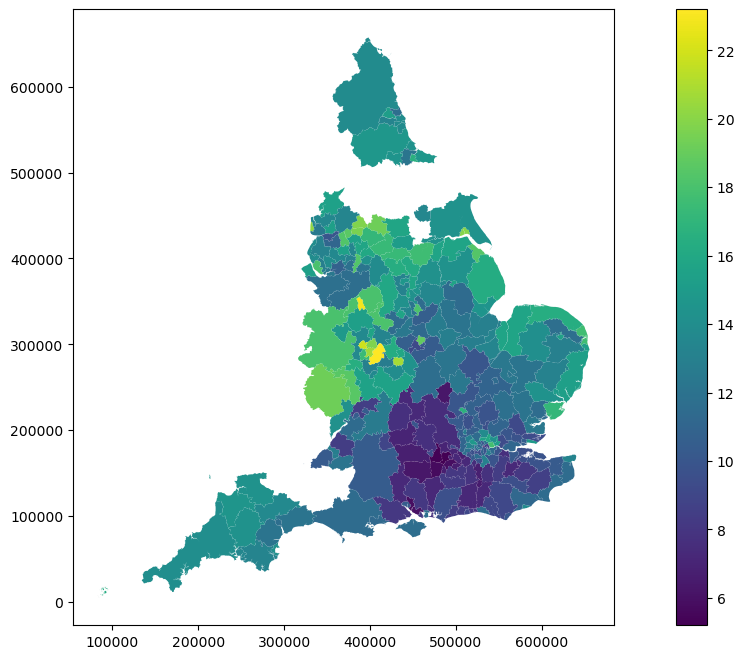

In [178]:
# The lack of FP data can also be revealed through mapping a FP variable to the geometry element(LADs map) [FN 35]

# Define plot size
f,ax = plt.subplots(1, figsize=(16,8))

# Plot the LADs, 
triple_gdf.plot(ax=ax, column ='Fuel poor (%)', legend=True)

# show the map
plt.show()

In [179]:
# The blank spaces reflect he missing LADs, "mirror" merging reveals the "lost" additional information   

# Merge the data using the common identifier
tripleR_gdf = merged_gdf2.merge(fuel_poorE0, on='Area Codes ', how='right')

# Show info
tripleR_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 296 entries, 0 to 295
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Area Codes          296 non-null    object  
 1   LAD21NM             292 non-null    object  
 2   epc_mi-mo           292 non-null    float64 
 3   pepc_mi-mo          292 non-null    float64 
 4   area_mi-mo          292 non-null    float64 
 5   geometry            292 non-null    geometry
 6   Unnamed: 2          63 non-null     object  
 7   Unnamed: 3          233 non-null    object  
 8   Nu of households    296 non-null    int64   
 9   Nu in fuel poverty  296 non-null    int64   
 10  Fuel poor (%)       296 non-null    float64 
dtypes: float64(4), geometry(1), int64(2), object(4)
memory usage: 25.6+ KB


In [180]:
# This time there are 4(296-292) additional LADs in the FP df which can then be identified 

# Use the isna() method to identify rows where 'Fuel poor (%)' is NaN
rows_with_missing_LAD21NM = tripleR_gdf[tripleR_gdf['LAD21NM'].isna()]

# Print the rows
print(rows_with_missing_LAD21NM)

    Area Codes  LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo geometry  \
16    E06000063     NaN        NaN         NaN         NaN     None   
19    E06000064     NaN        NaN         NaN         NaN     None   
51    E06000065     NaN        NaN         NaN         NaN     None   
277   E06000066     NaN        NaN         NaN         NaN     None   

                  Unnamed: 2 Unnamed: 3  Nu of households  Nu in fuel poverty  \
16                Cumberland        NaN            128063               18711   
19   Westmorland and Furness        NaN            105747               15648   
51           North Yorkshire        NaN            281927               43653   
277                Somerset         NaN            259265               31883   

     Fuel poor (%)  
16            14.6  
19            14.8  
51            15.5  
277           12.3  


In [181]:
# To check there is also a common name for each LAD (other than the 17 and 4 identified above)
# Match the 309 LAD21NM to the Unnamed "2' and '3' columns [FN 36]

# Count matchs for Unnamed '2' 
count_same_name = triple_gdf[triple_gdf['LAD21NM'].eq(triple_gdf['Unnamed: 2'])].shape[0]

# Print the count
print(count_same_name)

#Count matchs for Unnamed '3'  
count_same_name = triple_gdf[triple_gdf['LAD21NM'].eq(triple_gdf['Unnamed: 3'])].shape[0]

# Print the count
print(count_same_name)

57
218


In [182]:
# The total matchs 275 (57+218) are 17 greater than the 17 identified above, so list mismatchs[FN 37]

# List rows where LAD21NM doesn't match Unnamed 2 or 3 
rows_no_match = triple_gdf[~triple_gdf['LAD21NM'].isin(triple_gdf['Unnamed: 3']) & ~triple_gdf['LAD21NM'].isin(triple_gdf['Unnamed: 2'])]

# Print the rows
print(rows_no_match)

    Area Codes                        LAD21NM  epc_mi-mo  pepc_mi-mo  \
14    E06000015                         Derby    -1.0425     -0.5145   
16    E06000017                       Rutland    -0.5240     -0.5950   
64    E07000026                     Allerdale    -2.3710     -0.6750   
65    E07000027             Barrow-in-Furness    -0.9375     -1.0255   
66    E07000028                      Carlisle     0.1865     -0.4800   
67    E07000029                      Copeland    -2.3615     -0.5435   
68    E07000030                          Eden    -5.9530     -2.1325   
69    E07000031                South Lakeland    -3.1255     -2.0395   
167   E07000146  King's Lynn and West Norfolk    -2.5765     -0.8020   
171   E07000163                        Craven    -1.4765      0.0735   
172   E07000164                     Hambleton    -1.8605     -0.1930   
173   E07000165                     Harrogate    -2.0405     -1.6140   
174   E07000166                 Richmondshire    -2.2290     -0.

In [183]:
# To explore these more easily just the linked 'name' columns will be printed 

# List columns to print
columns_to_print = ['LAD21NM', 'Unnamed: 2', 'Unnamed: 3']

# Run non-matching rows again 
rows_no_match = triple_gdf[~triple_gdf['LAD21NM'].isin(triple_gdf['Unnamed: 3']) & ~triple_gdf['LAD21NM'].isin(triple_gdf['Unnamed: 2'])]

# Print the rows with limited columns
print(rows_no_match[columns_to_print])

                          LAD21NM Unnamed: 2                    Unnamed: 3
14                          Derby     Derby                            NaN
16                        Rutland   Rutland                            NaN
64                      Allerdale        NaN                           NaN
65              Barrow-in-Furness        NaN                           NaN
66                       Carlisle        NaN                           NaN
67                       Copeland        NaN                           NaN
68                           Eden        NaN                           NaN
69                 South Lakeland        NaN                           NaN
167  King's Lynn and West Norfolk        NaN  King’s Lynn and West Norfolk
171                        Craven        NaN                           NaN
172                     Hambleton        NaN                           NaN
173                     Harrogate        NaN                           NaN
174                 Richm

The "additional name mismatches" appear to be spacing differences. 
The 17 areas without fuel poverty information were incorporated post 2021 into 4 larger regions[FN 37]

Cumberland                     64,66,67  
Westmorland and Furness        65,68,69  
North Yorkshire                171.172,173,174,175,176,177  
Somerset                       190,191,192,239   

FP info for each region will be allocated in equal measure to each sub-region
The Fuel Poor (%) is the same as the larger region. 

In [184]:
# From information above check the 4 recently Aggregated LADs contain the missing households and households in poverty 

# Add the 4 LADs Nu of Households 
+128063 + 105747+ 281927+ 259265

775002

In [185]:
# Confirm that this is the difference between full Households df and triple_gdf amount

# Calculate the difference for Nu of households between the two dfs 
24070861-23295859 

775002

In [186]:
# Confirmed that the difference for Nu of Households is in 4 Aggregated LADs
# Check that the same applies to Nu in Fuel Poverty

# Add the 4 LADs Nu of in Fuel Poverty 
+18711 + 15648+ 43653+ 31883

109895

In [187]:
# Confirm that this is the difference between full Nu in Fuel Poverty df and triple_gdf amount

# Calculate the difference for Nu of households between the two dfs 
+3162752-3052857

109895

In [188]:
# Carry out disaggregation for each FP variable, start with Nu of households [FN 38]   

# Define the numbers
number1 = 128063
number2 = 105747
number3 = 281927
number4 = 259265

# Perform the mathematical operations
result1 =round(number1 / 3)
result2 = round(number2 / 3)
result3 = round(number3 / 7)
result4 = round(number4 / 4)

# Print the results
print("Result 1:", result1)
print("Result 2:", result2)
print("Result 3:", result3)
print("Result 4:", result4)

Result 1: 42688
Result 2: 35249
Result 3: 40275
Result 4: 64816


In [189]:
# The 'missing' Nu in Fuel Poverty for disaggregation is calculated for each LAD 

# Define the numbers
number1 = 18711
number2 =  15648
number3 =  43653
number4 =  31883

# Perform the mathematical operations
result1 =round(number1 / 3)
result2 = round(number2 / 3)
result3 = round(number3 / 7)
result4 = round(number4 / 4)

# Print the results
print("Result 1:", result1)
print("Result 2:", result2)
print("Result 3:", result3)
print("Result 4:", result4)

Result 1: 6237
Result 2: 5216
Result 3: 6236
Result 4: 7971


In [190]:
# Disaggreagate Cumberland [FN 39]

# Update rows
rows_to_update = [64, 66, 67]  
column_values_to_replace = {'Nu of households': 42688, 'Nu in fuel poverty': 6237, 'Fuel poor (%)': 14.6}

# Iterate over rows and columns to update the values
for row_index in rows_to_update:
    for column_name, value_to_replace in column_values_to_replace.items():
        # Replace the existing value with the new value
        triple_gdf.loc[row_index, column_name] = value_to_replace

# Print out the updated rows
updated_rows = triple_gdf.loc[rows_to_update]
print(updated_rows)

   Area Codes     LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  \
64   E07000026  Allerdale    -2.3710     -0.6750      6.9055   
66   E07000028   Carlisle     0.1865     -0.4800      0.6835   
67   E07000029   Copeland    -2.3615     -0.5435      6.9545   

                                             geometry Unnamed: 2 Unnamed: 3  \
64  MULTIPOLYGON (((317566.102 554649.903, 317599....        NaN        NaN   
66  MULTIPOLYGON (((328405.579 559580.291, 328389....        NaN        NaN   
67  MULTIPOLYGON (((318154.751 480659.017, 318141....        NaN        NaN   

    Nu of households  Nu in fuel poverty  Fuel poor (%)  
64           42688.0              6237.0           14.6  
66           42688.0              6237.0           14.6  
67           42688.0              6237.0           14.6  


In [191]:
# Disaggregate Westmorland and Furness 

# Update rows
rows_to_update = [65, 68, 69] 
column_values_to_replace = {'Nu of households': 35249, 'Nu in fuel poverty': 5216, 'Fuel poor (%)': 14.8}

# Iterate over rows and columns to update the values
for row_index in rows_to_update:
    for column_name, value_to_replace in column_values_to_replace.items():
        # Replace the existing value with the new value
        triple_gdf.loc[row_index, column_name] = value_to_replace

# Print out the updated rows
updated_rows = triple_gdf.loc[rows_to_update]
print(updated_rows)

   Area Codes             LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  \
65   E07000027  Barrow-in-Furness    -0.9375     -1.0255     -5.7915   
68   E07000030               Eden    -5.9530     -2.1325     17.6975   
69   E07000031     South Lakeland    -3.1255     -2.0395      6.7995   

                                             geometry Unnamed: 2 Unnamed: 3  \
65  MULTIPOLYGON (((321524.003 463828.200, 321485....        NaN        NaN   
68  POLYGON ((374520.502 550000.104, 374872.302 54...        NaN        NaN   
69  MULTIPOLYGON (((332160.000 475856.697, 332161....        NaN        NaN   

    Nu of households  Nu in fuel poverty  Fuel poor (%)  
65           35249.0              5216.0           14.8  
68           35249.0              5216.0           14.8  
69           35249.0              5216.0           14.8  


In [192]:
# Disaggregate North Yorkshire  

# Update rows
rows_to_update = [171, 172, 173, 174, 175, 176, 177]  # Replace with your actual row indices
column_values_to_replace = {'Nu of households': 40275, 'Nu in fuel poverty': 6236, 'Fuel poor (%)': 15.5}

# Iterate over rows and columns to update the values
for row_index in rows_to_update:
    for column_name, value_to_replace in column_values_to_replace.items():
        # Replace the existing value with the new value
        triple_gdf.loc[row_index, column_name] = value_to_replace

# Print out the updated rows
updated_rows = triple_gdf.loc[rows_to_update]
print(updated_rows)

    Area Codes         LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  \
171   E07000163         Craven    -1.4765      0.0735      8.7705   
172   E07000164      Hambleton    -1.8605     -0.1930     11.8860   
173   E07000165      Harrogate    -2.0405     -1.6140     13.3335   
174   E07000166  Richmondshire    -2.2290     -0.7785      9.7500   
175   E07000167        Ryedale    -5.1105     -2.0895     15.8645   
176   E07000168    Scarborough    -2.2910     -1.7005      2.3680   
177   E07000169          Selby     0.3730      0.1610      5.7035   

                                              geometry Unnamed: 2 Unnamed: 3  \
171  POLYGON ((380073.097 483863.805, 380217.501 48...        NaN        NaN   
172  POLYGON ((450591.398 513126.398, 450661.704 51...        NaN        NaN   
173  POLYGON ((420672.298 484928.200, 420979.797 48...        NaN        NaN   
174  POLYGON ((420570.900 515400.898, 420659.699 51...        NaN        NaN   
175  POLYGON ((464412.800 501751.305, 465814.99

In [193]:
# Disaggregate Somerset 

# Update rows
rows_to_update = [190, 191, 192, 239] 
column_values_to_replace = {'Nu of households': 64816, 'Nu in fuel poverty': 7971, 'Fuel poor (%)': 12.3 }

# Iterate over rows and columns to update the values
for row_index in rows_to_update:
    for column_name, value_to_replace in column_values_to_replace.items():
        # Replace the existing value with the new value
        triple_gdf.loc[row_index, column_name] = value_to_replace

# Print out the updated rows
updated_rows = triple_gdf.loc[rows_to_update]
print(updated_rows)

    Area Codes                     LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  \
190   E07000187                     Mendip     0.5070      0.5550      3.8865   
191   E07000188                  Sedgemoor    -0.1580      0.0255      5.8285   
192   E07000189             South Somerset    -0.0235     -0.0495      3.6415   
239   E07000246  Somerset West and Taunton    -0.0485     -0.0025      2.7865   

                                              geometry Unnamed: 2 Unnamed: 3  \
190  POLYGON ((347500.802 158466.699, 347459.898 15...        NaN        NaN   
191  MULTIPOLYGON (((334793.703 129134.295, 334712....        NaN        NaN   
192  MULTIPOLYGON (((337535.499 129069.404, 337532....        NaN        NaN   
239  MULTIPOLYGON (((337556.912 128675.652, 337621....        NaN        NaN   

     Nu of households  Nu in fuel poverty  Fuel poor (%)  
190           64816.0              7971.0           12.3  
191           64816.0              7971.0           12.3  
192           64

In [194]:
# Check the disggregated information
triple_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Area Codes          309 non-null    object  
 1   LAD21NM             309 non-null    object  
 2   epc_mi-mo           309 non-null    float64 
 3   pepc_mi-mo          309 non-null    float64 
 4   area_mi-mo          309 non-null    float64 
 5   geometry            309 non-null    geometry
 6   Unnamed: 2          59 non-null     object  
 7   Unnamed: 3          233 non-null    object  
 8   Nu of households    309 non-null    float64 
 9   Nu in fuel poverty  309 non-null    float64 
 10  Fuel poor (%)       309 non-null    float64 
dtypes: float64(6), geometry(1), object(4)
memory usage: 26.7+ KB


In [195]:
# Columns 8 and 9 are now float64(decimals) not integers so these can be amended shortly 

# First check that full amount of FP household numbers for England has been retained 
print(fuel_poor.iloc[0])
print(triple_gdf['Nu of households'].sum())
print(triple_gdf['Nu in fuel poverty'].sum())

Area Codes            E92000001
Area names              ENGLAND
Unnamed: 2                  NaN
Unnamed: 3                  NaN
Nu of households       24070861
Nu in fuel poverty      3162752
Fuel poor (%)              13.1
IsDuplicate               False
Name: 0, dtype: object
24070859.0
3162752.0


The amounts match (other than a rounding discrepancy of 2 in 'Nu of households')
The Unnamed columns are matched for 292(233+59) rows and the further 17 (totalling 309) are "new"(reorganisations) 
The Unnamed columns can now be deleted and Number columns changed to integers.

In [196]:
# Change household number columns to integers [40]
triple_gdf['Nu of households'] = triple_gdf['Nu of households'].astype(int)
triple_gdf['Nu in fuel poverty']= triple_gdf['Nu in fuel poverty'].astype(int)

# Specify the column(s) to delete
columns_to_delete = ['Unnamed: 3', 'Unnamed: 2']

# Use the drop method to delete columns
triple_gdf = triple_gdf.drop(columns = columns_to_delete)

# Print the modified df
triple_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Area Codes          309 non-null    object  
 1   LAD21NM             309 non-null    object  
 2   epc_mi-mo           309 non-null    float64 
 3   pepc_mi-mo          309 non-null    float64 
 4   area_mi-mo          309 non-null    float64 
 5   geometry            309 non-null    geometry
 6   Nu of households    309 non-null    int64   
 7   Nu in fuel poverty  309 non-null    int64   
 8   Fuel poor (%)       309 non-null    float64 
dtypes: float64(4), geometry(1), int64(2), object(2)
memory usage: 21.9+ KB


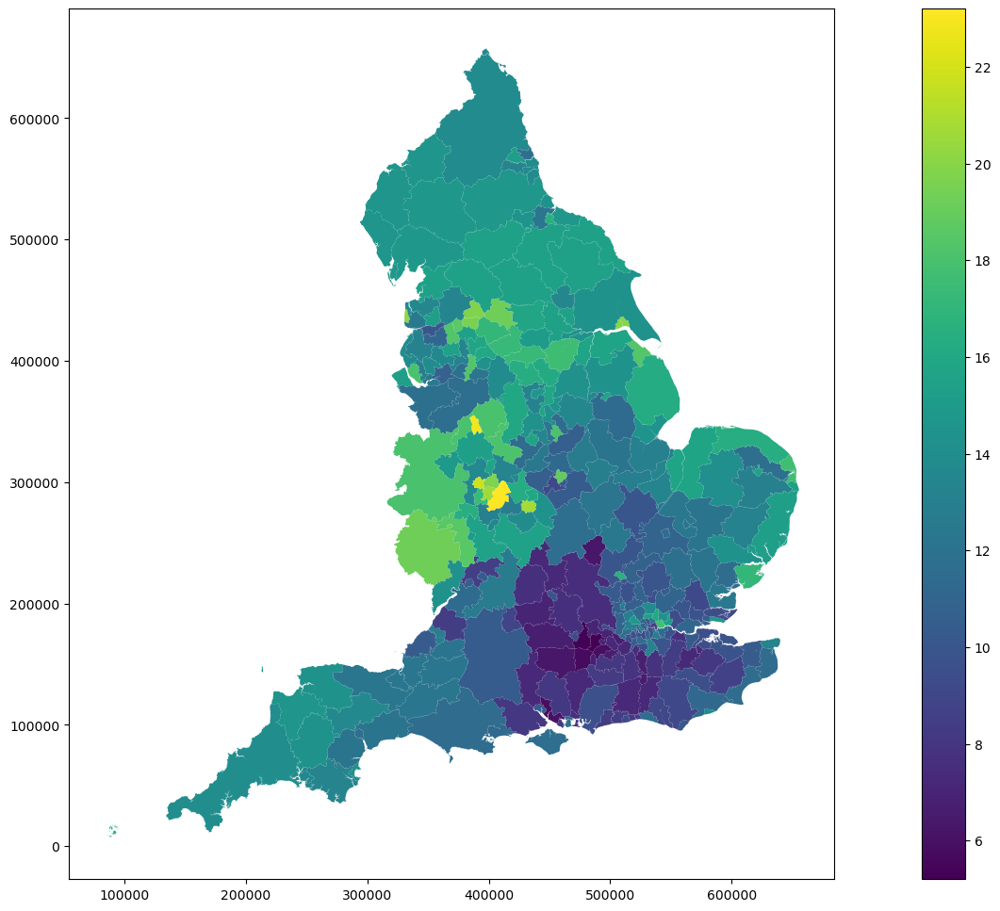

In [197]:
# Check completeness by displaying map 

# Set plot size
f,ax = plt.subplots(1, figsize=(24,12))

# Map with choosen variable as an example
triple_gdf.plot(ax=ax, column ='Fuel poor (%)', legend=True)

# Show the map
plt.show()

In [198]:
# Examine statistics 
triple_gdf.describe()

,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%)
count,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000
mean,-0.185573,0.054693,1.500076,77899.220065,10235.443366,12.588026
std,1.879503,1.001502,6.892797,50940.774614,9137.931480,3.477276
min,-16.136000,-4.582000,-27.772000,984.000000,160.000000,5.200000
25%,-1.215000,-0.644500,-3.574000,44729.000000,5216.000000,10.100000
50%,-0.147000,0.015500,1.253000,61626.000000,7364.000000,12.400000
75%,0.921000,0.643000,6.453500,98321.000000,11802.000000,14.900000
max,6.172500,3.888500,27.843500,433435.000000,100512.000000,23.200000


The statistics do not use weighted statistic this results in some differences such as the LADs mean FP % (12.588026%)
differs from England : 13.1% (see above). A column will be added that calculates each LADs % fuel poverty difference
from the national (England) average. 

In [199]:
# Add a new column for 'FP_(%)_var' showing difference from 13.1% 

# Calculate 309 LAD's Fuel poverty % difference from national average 
triple_gdf['FP_(%)_var'] = (triple_gdf['Fuel poor (%)'] - 13.1).round(1) 

# review new df for both for completeness and dDtypes 
triple_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Area Codes          309 non-null    object  
 1   LAD21NM             309 non-null    object  
 2   epc_mi-mo           309 non-null    float64 
 3   pepc_mi-mo          309 non-null    float64 
 4   area_mi-mo          309 non-null    float64 
 5   geometry            309 non-null    geometry
 6   Nu of households    309 non-null    int64   
 7   Nu in fuel poverty  309 non-null    int64   
 8   Fuel poor (%)       309 non-null    float64 
 9   FP_(%)_var          309 non-null    float64 
dtypes: float64(5), geometry(1), int64(2), object(2)
memory usage: 24.3+ KB


In [200]:
# Having now completed the df columns, geometry can be relegated to the final column to help readability

# Move geometry column to last column (column 9)
geometry_column = triple_gdf.pop('geometry')
triple_gdf.insert(9,'geometry', geometry_column)

# Check column ordering
triple_gdf.columns

Index(['Area Codes ', 'LAD21NM', 'epc_mi-mo', 'pepc_mi-mo', 'area_mi-mo',
       'Nu of households', 'Nu in fuel poverty', 'Fuel poor (%)', 'FP_(%)_var',
       'geometry'],
      dtype='object')

In [201]:
# Show first 5 rows
triple_gdf.head()

,Area Codes,LAD21NM,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%),FP_(%)_var,geometry
0,E06000001,Hartlepool,0.5590,-0.0955,6.6655,41885,5993,14.3,1.2,"MULTIPOLYGON (((450153.600 525935.876, 450139...."
1,E06000002,Middlesbrough,-0.1840,0.6880,-4.3590,61626,10244,16.6,3.5,"MULTIPOLYGON (((446860.000 517200.300, 446854...."
2,E06000003,Redcar and Cleveland,0.0770,0.7230,-2.2815,63059,9300,14.7,1.6,"MULTIPOLYGON (((451747.397 520561.100, 451787...."
3,E06000004,Stockton-on-Tees,2.1050,0.6085,-0.8380,85685,10424,12.2,-0.9,"MULTIPOLYGON (((447214.196 517857.904, 447186...."
4,E06000005,Darlington,-0.6165,-0.0915,-0.6920,50028,7255,14.5,1.4,"POLYGON ((423475.701 524731.597, 423497.204 52..."


In [202]:
# Show last 5 rows
triple_gdf.tail()

,Area Codes,LAD21NM,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%),FP_(%)_var,geometry
304,E09000029,Sutton,-1.3695,-0.5135,-4.3100,86885,8441,9.7,-3.4,"POLYGON ((527681.106 167213.775, 527763.225 16..."
305,E09000030,Tower Hamlets,6.1725,1.1680,-16.2165,127095,11105,8.7,-4.4,"POLYGON ((536737.742 184527.776, 536779.194 18..."
306,E09000031,Waltham Forest,-1.5755,-0.8080,-5.2965,108471,17330,16.0,2.9,"POLYGON ((537914.502 195745.798, 538021.498 19..."
307,E09000032,Wandsworth,1.2060,-1.2500,-9.3660,144833,13521,9.3,-3.8,"POLYGON ((530146.398 177732.466, 530121.321 17..."
308,E09000033,Westminster,1.4445,-1.1655,-13.7205,100365,10900,10.9,-2.2,"POLYGON ((526726.382 183730.554, 526773.270 18..."


In [203]:
# Show statistics
triple_gdf.describe()

,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%),FP_(%)_var
count,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000
mean,-0.185573,0.054693,1.500076,77899.220065,10235.443366,12.588026,-0.511974
std,1.879503,1.001502,6.892797,50940.774614,9137.931480,3.477276,3.477276
min,-16.136000,-4.582000,-27.772000,984.000000,160.000000,5.200000,-7.900000
25%,-1.215000,-0.644500,-3.574000,44729.000000,5216.000000,10.100000,-3.000000
50%,-0.147000,0.015500,1.253000,61626.000000,7364.000000,12.400000,-0.700000
75%,0.921000,0.643000,6.453500,98321.000000,11802.000000,14.900000,1.800000
max,6.172500,3.888500,27.843500,433435.000000,100512.000000,23.200000,10.100000


Looking at the ranges for the household results it is noticeable that the minimum numbers are relatively small in 
comparison to either the mean or median results. These outliers can be removed to consider whether they are distortive
for the potential later visualisations , in which case they could be 'removed'(through merging rather than just by exclusion  ) 

In [204]:
# Explore smallest outliers 
print(triple_gdf['Nu of households'].nsmallest(n=10))
print(triple_gdf['Nu in fuel poverty'].nsmallest(n=10))

49       984
276     5157
16     17005
154    22994
156    23066
85     25675
145    27312
99     28197
215    28229
220    28267
Name: Nu of households, dtype: int64
49      160
276     279
211    2175
16     2193
220    2320
114    2332
156    2360
205    2400
209    2551
33     2669
Name: Nu in fuel poverty, dtype: int64


In [205]:
# Show rows where Nu of households less than 20,000 
selected_rows = triple_gdf.iloc[[49, 276, 16 ]]
print(selected_rows)

    Area Codes           LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  \
49    E06000053  Isles of Scilly    -16.136      3.8885      5.3845   
276   E09000001   City of London     -0.694     -4.5820    -27.7720   
16    E06000017          Rutland     -0.524     -0.5950     11.5470   

     Nu of households  Nu in fuel poverty  Fuel poor (%)  FP_(%)_var  \
49                984                 160           16.3         3.2   
276              5157                 279            5.4        -7.7   
16              17005                2193           12.9        -0.2   

                                              geometry  
49   MULTIPOLYGON (((83999.700 5358.600, 83889.790 ...  
276  MULTIPOLYGON (((531664.810 180549.344, 531628....  
16   POLYGON ((493992.196 318917.100, 494224.599 31...  


The focus of the Project is EPC and FP data and from the earlier EPC data, the Isles of Scilly (IoS) was already identified as 
an outlier for the epc_mi-mo variable (-16.1 is the lowest result and 10.14 less than the second lowest result).
To remove IoS from the results it will be incorporated into its nearest geographical LAD i.e Cornwall.

In [206]:
# Explore Cornwall row 
row_Cornwall = triple_gdf.loc[triple_gdf['LAD21NM'] == 'Cornwall']
print(row_Cornwall)

   Area Codes    LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  Nu of households  \
48   E06000052  Cornwall    -3.3805      -1.546       1.733            259453   

    Nu in fuel poverty  Fuel poor (%)  FP_(%)_var  \
48               36274           14.0         0.9   

                                             geometry  
48  MULTIPOLYGON (((168753.616 13018.581, 168789.2...  


In [207]:
# Cornwall is row 48 and IoS 49 (supporting geographical proximity),retain Cornwall but combine geometry [FN 41]

# Assuming your GeoDataFrame is named triple_gdf
row_48_index = 48
row_49_index = 49

# Get the geometries for rows 48 and 49
geometry_48 = triple_gdf.loc[row_48_index, 'geometry']
geometry_49 = triple_gdf.loc[row_49_index, 'geometry']

# Combine the geometries
combined_geometry = geometry_48.union(geometry_49)

# Update the geometry for row 48 in-place
triple_gdf.at[row_48_index, 'geometry'] = combined_geometry

# Optionally, you can drop row 49 if needed
triple_gdf = triple_gdf.drop(row_49_index).reset_index(drop=True)

# Print the resulting GeoDataFrame
triple_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 308 entries, 0 to 307
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Area Codes          308 non-null    object  
 1   LAD21NM             308 non-null    object  
 2   epc_mi-mo           308 non-null    float64 
 3   pepc_mi-mo          308 non-null    float64 
 4   area_mi-mo          308 non-null    float64 
 5   Nu of households    308 non-null    int64   
 6   Nu in fuel poverty  308 non-null    int64   
 7   Fuel poor (%)       308 non-null    float64 
 8   FP_(%)_var          308 non-null    float64 
 9   geometry            308 non-null    geometry
dtypes: float64(5), geometry(1), int64(2), object(2)
memory usage: 24.2+ KB


In [208]:
print(triple_gdf.loc[48])

Area Codes                                                    E06000052
LAD21NM                                                        Cornwall
epc_mi-mo                                                       -3.3805
pepc_mi-mo                                                       -1.546
area_mi-mo                                                        1.733
Nu of households                                                 259453
Nu in fuel poverty                                                36274
Fuel poor (%)                                                      14.0
FP_(%)_var                                                          0.9
geometry              MULTIPOLYGON (((168753.6155000003 13018.581000...
Name: 48, dtype: object


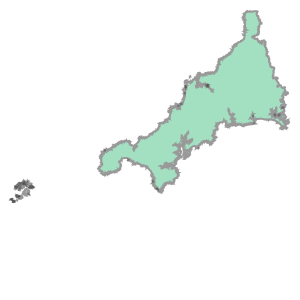

In [209]:
# Access and display the geometry of index 0
triple_gdf.loc[48, 'geometry']

The geometry/map for row 48 (Cornwall) now includes IofS, so whilst the EPC data cannot be sensibly combined 
(insufficient information to average and data points are likely to be predonimantly be Cornwall ones) it 
is possible to combine household numbers and re-run fuel poverty average which can then replace the Cornwall only 
results.

In [210]:
# Aggregate household info into row 48  

# Update values for row 48
triple_gdf.at[48, 'Nu of households'] = 259453.0+984
triple_gdf.at[48, 'Nu in fuel poverty'] = 36274.0+160
triple_gdf.at[48, 'Fuel poor (%)'] =round(100*(36274.0+160)/(259453.0+984) ,1)       
triple_gdf.at[48, 'FP_(%)_var'] = round(100*(36274.0+160)/(259453.0+984) - 13.1,1) 

# Print the updated row
print(triple_gdf.loc[48])

Area Codes                                                    E06000052
LAD21NM                                                        Cornwall
epc_mi-mo                                                       -3.3805
pepc_mi-mo                                                       -1.546
area_mi-mo                                                        1.733
Nu of households                                                 260437
Nu in fuel poverty                                                36434
Fuel poor (%)                                                      14.0
FP_(%)_var                                                          0.9
geometry              MULTIPOLYGON (((168753.6155000003 13018.581000...
Name: 48, dtype: object


In [211]:
# There is no impact on FP % but household numbers have increased and revised df can be checked to England totals 
print(fuel_poor.iloc[0])
print(triple_gdf['Nu of households'].sum())
print(triple_gdf['Nu in fuel poverty'].sum())

Area Codes            E92000001
Area names              ENGLAND
Unnamed: 2                  NaN
Unnamed: 3                  NaN
Nu of households       24070861
Nu in fuel poverty      3162752
Fuel poor (%)              13.1
IsDuplicate               False
Name: 0, dtype: object
24070859
3162752


In [212]:
# Other than the rounding difference of 2 the full household numbers have been preserved.

# Show statistics for final df 
triple_gdf.describe()

,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%),FP_(%)_var
count,308.000000,308.000000,308.000000,308.000000,308.000000,308.000000,308.000000
mean,-0.133786,0.042245,1.487464,78152.139610,10268.675325,12.575974,-0.524026
std,1.647007,0.978898,6.900442,50845.331938,9136.149891,3.476464,3.476464
min,-5.953000,-4.582000,-27.772000,5157.000000,279.000000,5.200000,-7.900000
25%,-1.213125,-0.645625,-3.587875,44771.000000,5216.000000,10.075000,-3.025000
50%,-0.125000,0.015250,1.250500,61672.000000,7400.500000,12.400000,-0.700000
75%,0.925625,0.640750,6.506500,98333.000000,11812.750000,14.825000,1.725000
max,6.172500,3.068000,27.843500,433435.000000,100512.000000,23.200000,10.100000


In [213]:
# Show numerical correlations for final df 
triple_gdf_numeric = triple_gdf.select_dtypes(include=np.number)
triple_gdf_numeric.corr()

,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%),FP_(%)_var
epc_mi-mo,1.000000,0.740562,-0.426272,0.049019,-0.079548,-0.363235,-0.363235
pepc_mi-mo,0.740562,1.000000,-0.148710,-0.057915,-0.109548,-0.219004,-0.219004
area_mi-mo,-0.426272,-0.148710,1.000000,-0.241094,-0.222713,-0.053068,-0.053068
Nu of households,0.049019,-0.057915,-0.241094,1.000000,0.920412,0.249539,0.249539
Nu in fuel poverty,-0.079548,-0.109548,-0.222713,0.920412,1.000000,0.518039,0.518039
Fuel poor (%),-0.363235,-0.219004,-0.053068,0.249539,0.518039,1.000000,1.000000
FP_(%)_var,-0.363235,-0.219004,-0.053068,0.249539,0.518039,1.000000,1.000000


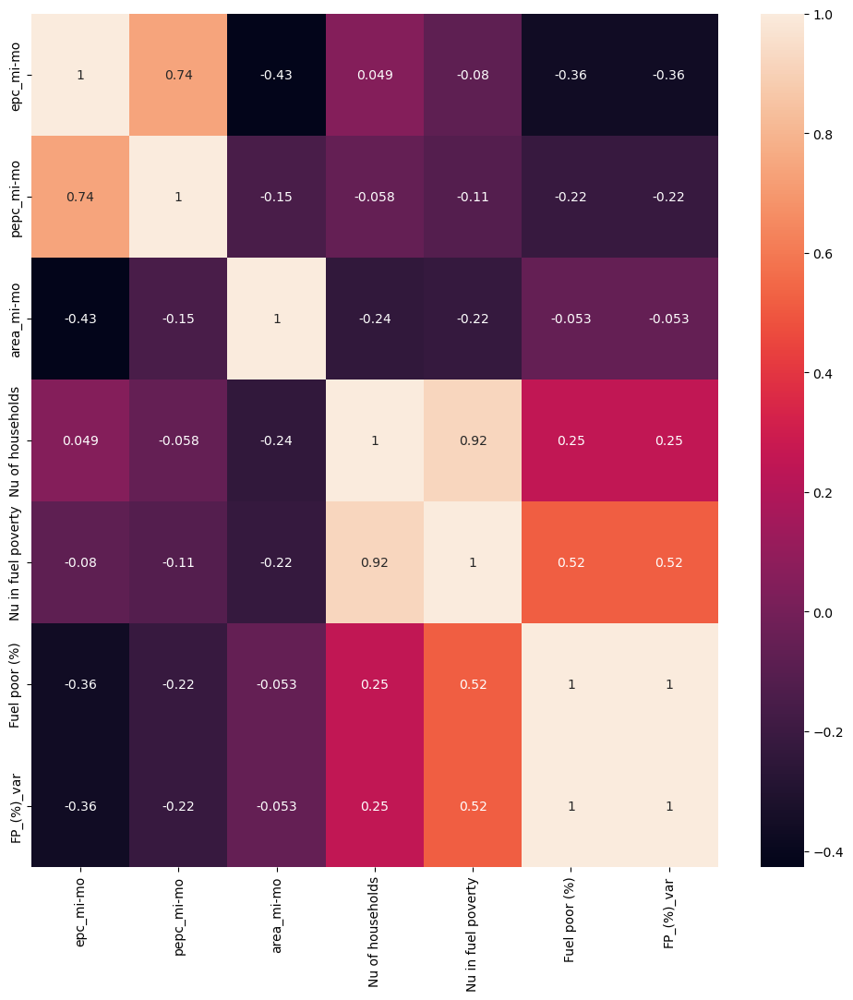

In [214]:
# Show corraltion heatmap for final df 

# Set max figure size 
plt.figure(figsize=(12,12))

# The colour mapping remains sympathic for colour blind with default 'viridis'
# Show heatmap
sns.heatmap(triple_gdf_numeric.corr(), annot=True,);

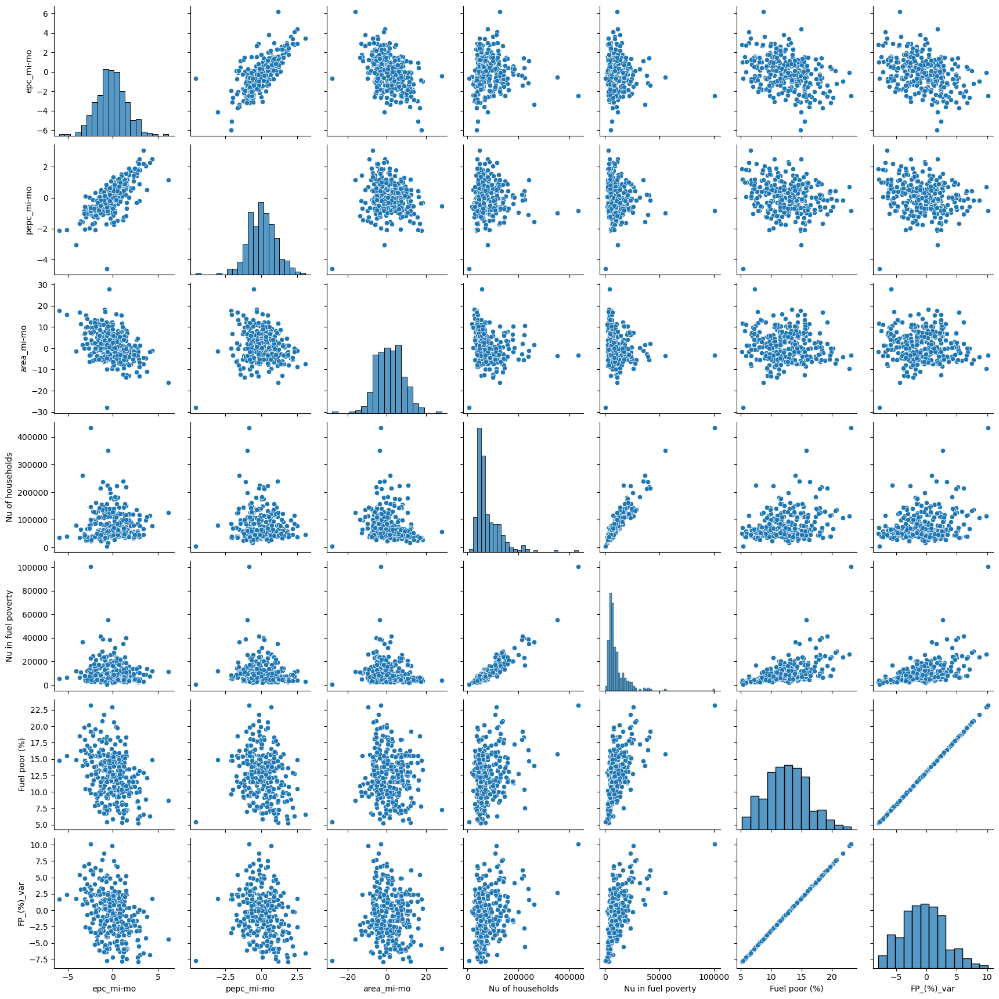

In [215]:
# An alternative way to compare all the varaibles is to plot each scatter diagram individually

# run all combination of variables  
sns.pairplot(triple_gdf);

The hypothesis variables were LADs households EPC positioning (independent) and households FP levels (dependent) 
and the details of that relationship will be explored further through an "Ordinary Least Square" (OLS) regression analysis, 
noting the negative correlation result of -0.36 displays as expected an inverse relationship which requires 
caution when running a OLS model. 

The correlation relationship between certain other variables from the data above provide a mixture of 
useful/confirmatory information and irrelevant ones. In the former category the following points can be made

1. EPCs and PEPCs appear strongly positively correlated (+0.74). Suggesting that residences with the highest EPC scores 
will also score highly on PEPCs scores, which suggest "unfairly" that energy efficient homes are the ones most
cost efficient to make even more energy efficient. Although seemingly at first counter-intuitive the second 
relationship may partially explain this (as PEPC is is negatively correlated with floor space (-0.15)

2. There is a relative strong inverse realtionship between EPC postion and floor space area (-0.43) which is not
suprising as it suggests small homes are more energy efficient than large ones. Although the data does not reveal 
types of housing one could speculate that English flats are smaller than many English houses and energy efficiency 
benefits arise from both factors (smaller floor space and less "external" (outside) wall area). Indeed the top EPC
ranking of Tower Hamlets and bottom ranking of IoS may be related to the proportion of flats in each LAD.   
                                         
Returning to the main hypothesis a discussion of the OLS model will follow running the model  


In [216]:
# Run pro-forma OLS model [FN 42]
import statsmodels.api as sm
# Define X and y

# Hypothesis' independent variable
X = triple_gdf['epc_mi-mo'] 

# Hypothesis' dependent variable
y =triple_gdf['Fuel poor (%)'] 

# Fit the model
model = sm.OLS(y, X).fit()
predictions = model.predict(X) 

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:          Fuel poor (%)   R-squared (uncentered):                   0.030
Model:                            OLS   Adj. R-squared (uncentered):              0.027
Method:                 Least Squares   F-statistic:                              9.641
Date:                Thu, 14 Dec 2023   Prob (F-statistic):                     0.00208
Time:                        14:24:51   Log-Likelihood:                         -1223.4
No. Observations:                 308   AIC:                                      2449.
Df Residuals:                     307   BIC:                                      2452.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
epc_mi-mo     -1.3798      0.444     -3.105      0.002      -2.254      -0.505
==============================================================================
Omnibus:                        1.162   Durbin-Watson:                   0.073
Prob(Omnibus):                  0.559   Jarque-Bera (JB):                1.259
Skew:                           0.136   Prob(JB):                        0.533
Kurtosis:                       2.844   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

One mathmatical test for the link between correlation coefficient(CC) and R-squared(Rs) is that CCxCC=Rs [FN 43] 
In this case the CC is -0.363235 (or rounded to -0.36 in the heatmap ) so Rs = -0.363235 x -0.363235 = 0.13193967


In [217]:
# Invert 'FP %'' to test OLS model i.e hypothesis higher EPC causes low FP % [FN 43]  

# Define X and y

# Hypothesis' independent variable
X = triple_gdf['epc_mi-mo'] 

# Hypothesis' dependent variable
y =1-triple_gdf['Fuel poor (%)'] 


# Fit the model
model = sm.OLS(y, sm.add_constant(X)).fit()
predictions = model.predict(sm.add_constant(X))  

# Print out the statistics
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          Fuel poor (%)   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     46.51
Date:                Thu, 14 Dec 2023   Prob (F-statistic):           4.87e-11
Time:                        14:24:53   Log-Likelihood:                -798.51
No. Observations:                 308   AIC:                             1601.
Df Residuals:                     306   BIC:                             1608.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -11.4734      0.185    -61.861      0.000     -11.838     -11.108
epc_mi-mo      0.7667      0.112      6.820      0.000       0.545       0.988
==============================================================================
Omnibus:                        2.029   Durbin-Watson:                   0.833
Prob(Omnibus):                  0.363   Jarque-Bera (JB):                2.039
Skew:                          -0.196   Prob(JB):                        0.361
Kurtosis:                       2.923   Cond. No.                         1.66
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [218]:
# Test 'FP_ (%)_var' to test similar OLS model i.e hypothesis higher EPC causes low than national average FP %   

# Define X and y

# Hypothesis' independent variable
X = triple_gdf['epc_mi-mo'] 

# Hypothesis' dependent variable
y =1-triple_gdf['FP_(%)_var'] 

# Fit the model
model = sm.OLS(y, sm.add_constant(X)).fit()
predictions = model.predict(sm.add_constant(X))  

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             FP_(%)_var   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     46.51
Date:                Thu, 14 Dec 2023   Prob (F-statistic):           4.87e-11
Time:                        14:24:54   Log-Likelihood:                -798.51
No. Observations:                 308   AIC:                             1601.
Df Residuals:                     306   BIC:                             1608.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6266      0.185      8.770      0.000       1.262       1.992
epc_mi-mo      0.7667      0.112      6.820      0.000       0.545       0.988
==============================================================================
Omnibus:                        2.029   Durbin-Watson:                   0.833
Prob(Omnibus):                  0.363   Jarque-Bera (JB):                2.039
Skew:                          -0.196   Prob(JB):                        0.361
Kurtosis:                       2.923   Cond. No.                         1.66
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Model evaluation [FN 44]

R 2  - 0.132 or 13.2% is the percentage of change in the FP(%) or FP(%) variance explainable by the model hypotheis.
The result is close to 0% (zero explanatory value) than 100% (total expalnatory value). The low value does not 
suggest a strong fit with the model.

Prob(F-statistic) is very low 4.87e-11(i.e.0.0000000000487) this is much lower than the benchmark value of 0.05
which suggest the results are unlikely to be due purely to chance and therefore there is likely to be some 
relationship between the variables.

Coef(Coeficient) for epc-mi-mo suggests that every one unit change in it will reduce the FP percentage by 0.7667%, 
however the confidence intervals ([0.025   0.975]) has a range of 0.545 - 0.988 representing quite a large range
the range around the predicted value (reflecting a weak fit) but both are positive so not indicative of no 
model relationship. 

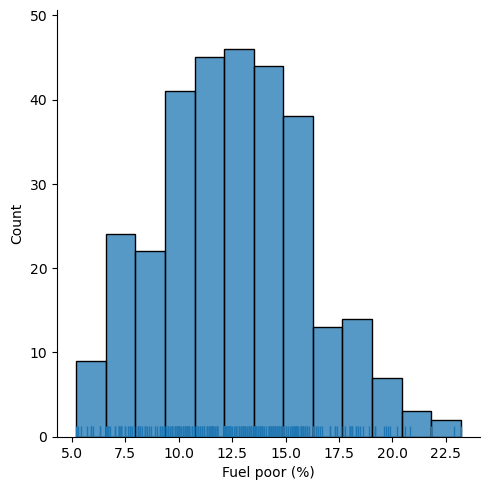

In [219]:
# Review various alternatives for non-spatial visualisation 

# First simple histogram of FP % [FN 45]
sns.displot(triple_gdf['Fuel poor (%)'].dropna(), rug=True)

array([[<Axes: title={'center': 'epc_mi-mo'}>,
        <Axes: title={'center': 'pepc_mi-mo'}>,
        <Axes: title={'center': 'area_mi-mo'}>],
       [<Axes: title={'center': 'Nu of households'}>,
        <Axes: title={'center': 'Nu in fuel poverty'}>,
        <Axes: title={'center': 'Fuel poor (%)'}>],
       [<Axes: title={'center': 'FP_(%)_var'}>, <Axes: >, <Axes: >]],
      dtype=object)

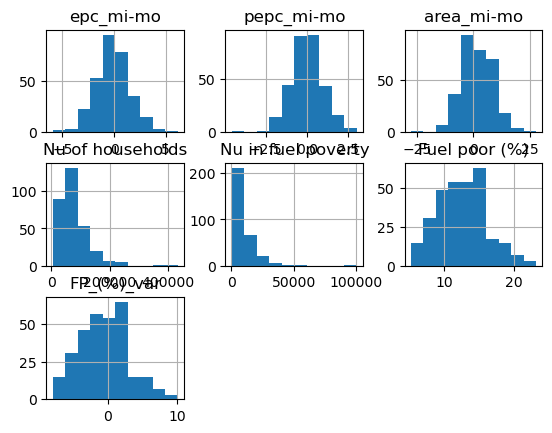

In [220]:
# Review in summary form all histograms for final df
triple_gdf.hist()

A very skewed histogram is the one for number of households in FP, where a few LADs have a large numbers of FP households

<Axes: >

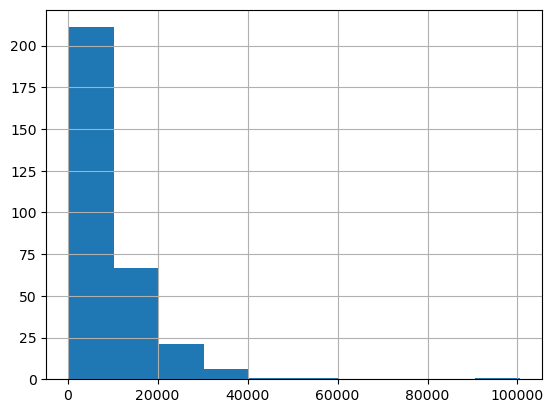

In [221]:
# Show that histogram on its own
triple_gdf['Nu in fuel poverty'].hist()

The histogram above (indistinctly) highlights the few outlier LADs but contains little other information and does 
not reflect large range of LAD household numbers ( which percentage do). 

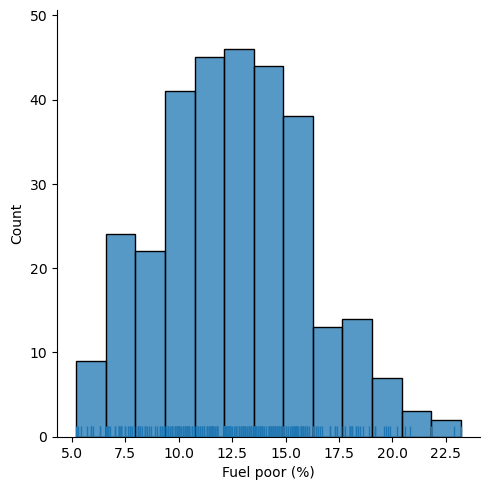

In [222]:
# Show distribution of FP % 
sns.displot(triple_gdf['Fuel poor (%)'].dropna(), rug=True)

Review combinations of scatter diagrams with histograms and marker and colour variations 

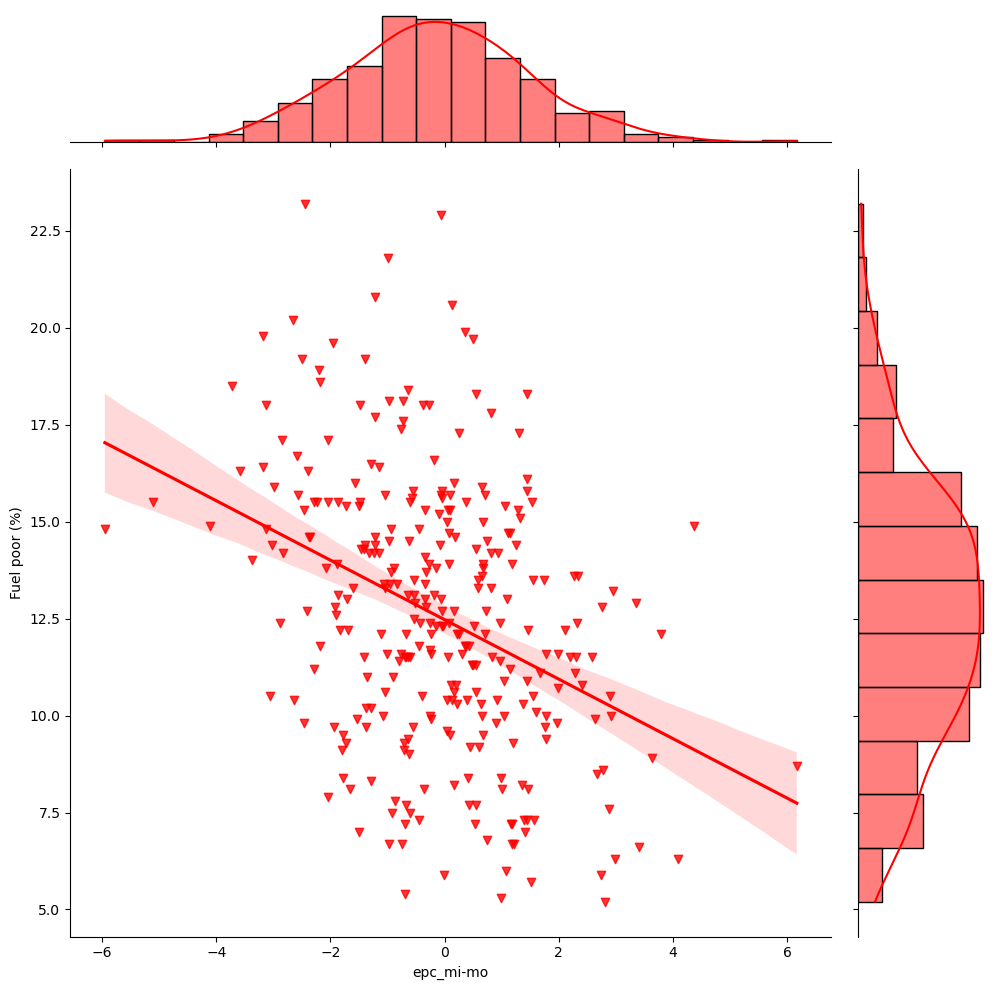

In [223]:
# Review visualisation that also includes regression line
sns.jointplot(x='epc_mi-mo',y='Fuel poor (%)', color='red', kind ='reg',data=triple_gdf,
             height=10, marker='v');

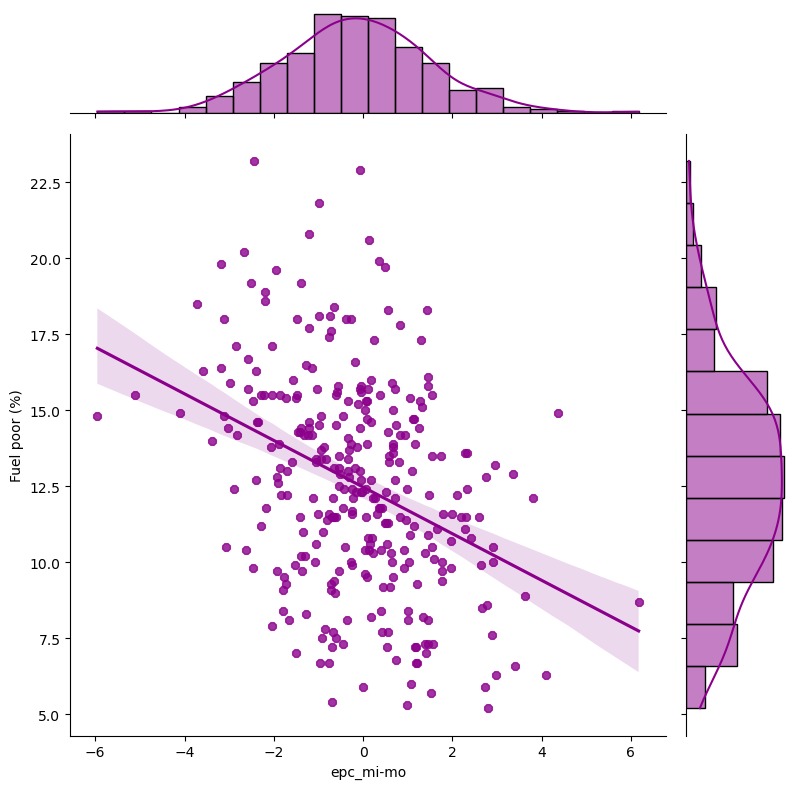

In [224]:
# Vary colour,size and marker 
sns.jointplot(x='epc_mi-mo',y='Fuel poor (%)', kind ='reg', color='darkmagenta', data=triple_gdf, height=8, marker='8');

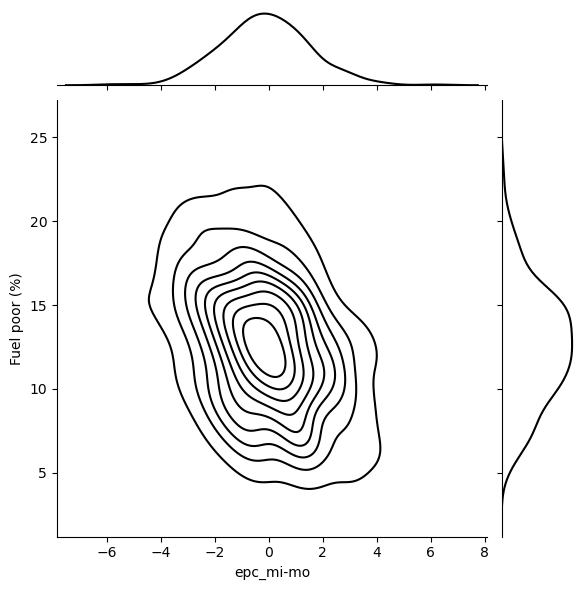

In [225]:
# Vary "kind" of diagram 
sns.jointplot(x='epc_mi-mo',y='Fuel poor (%)', kind ='kde', color='black' ,data=triple_gdf);

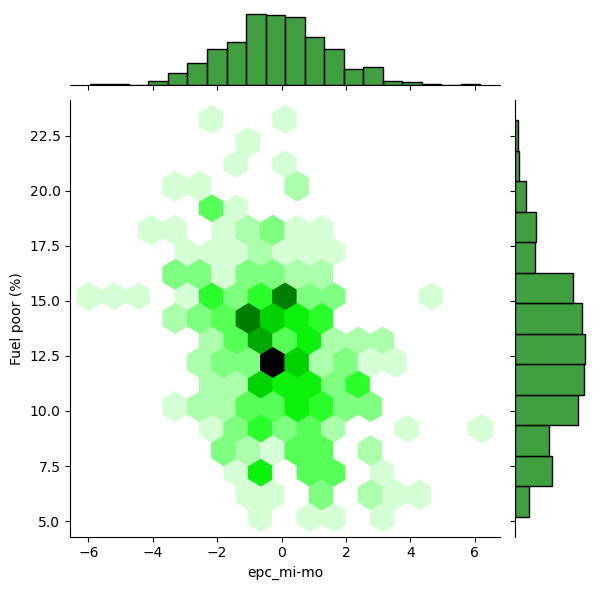

In [226]:
# Review 'hex' as it provides information on clustering   
sns.jointplot(x='epc_mi-mo',y='Fuel poor (%)', kind ='hex', color='green' ,data=triple_gdf);

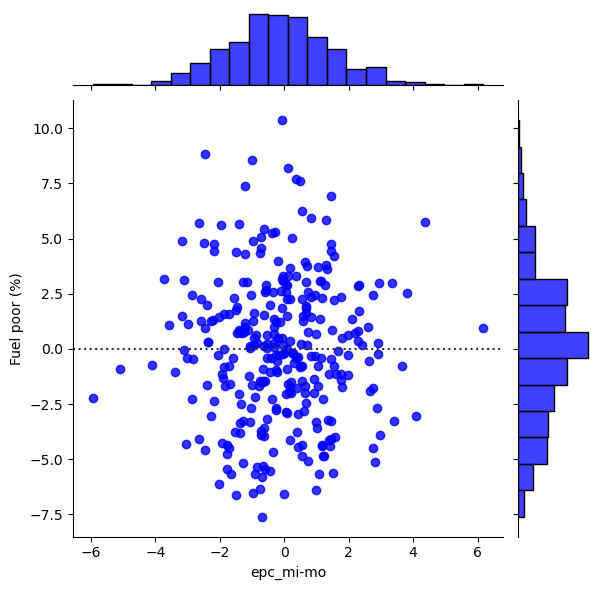

In [227]:
# Review 'resid' diagram as it provides information on model fit  
sns.jointplot(x='epc_mi-mo',y='Fuel poor (%)', kind ='resid', color='blue' ,data=triple_gdf);

The residuals model provides further evidence that the hypothesis model is a poor fit (many datapoints are distant 
from prediction line). 
Combine best elements of examples above to produce final non- spatial visualisation (detailed explanation at end).      

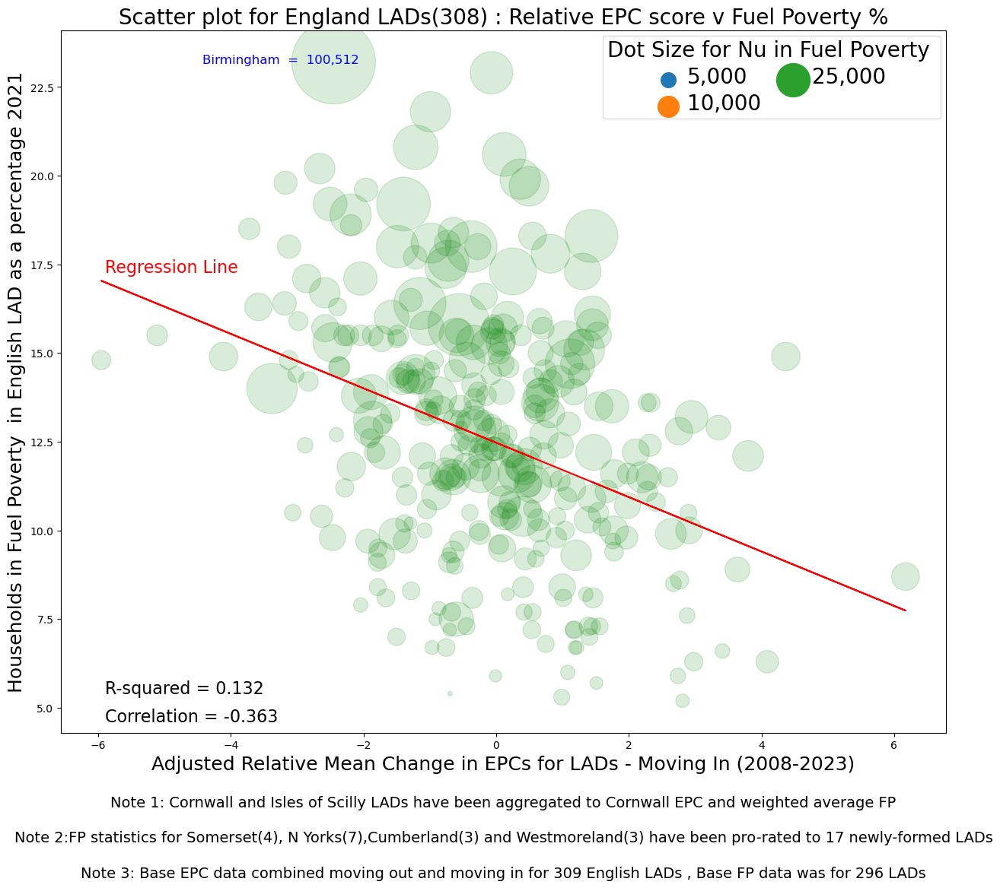

In [228]:
# Create final non-spatial visualisation for review [FN 46,47,48]

# Create the dotsize
dotsize = triple_gdf['Nu in fuel poverty']/16

# Create the scatter plot with high transparency
ax = triple_gdf.plot.scatter(x='epc_mi-mo', y='Fuel poor (%)', s=dotsize, c='green', alpha=0.15,figsize=(15, 12))

# Fit a linear regression model
x = triple_gdf[['epc_mi-mo']]
y = triple_gdf['Fuel poor (%)']

regression_model = LinearRegression()
regression_model.fit(x, y)

# Predict the values using the linear regression model
y_pred = regression_model.predict(x)

# Plot the regression line
ax.plot(x, y_pred, color='red', label='Regression Line')

# Add a legend for the regression line
legend_handles, legend_labels = ax.get_legend_handles_labels()
legend_handles.append(mlines.Line2D([], [], color='red', label='Regression Line'))
ax.legend(handles=legend_handles, labels=legend_labels)

# Add three notes under the graph
ax.text(0.5, -0.1, 'Note 1: Cornwall and Isles of Scilly LADs have been aggregated to Cornwall EPC and weighted average FP', transform=ax.transAxes, ha='center', va='center', fontsize=14)
ax.text(0.5, -0.15, 'Note 2:FP statistics for Somerset(4), N Yorks(7),Cumberland(3) and Westmoreland(3) have been pro-rated to 17 newly-formed LADs', transform=ax.transAxes, ha='center', va='center', fontsize=14)
ax.text(0.5, -0.2, 'Note 3: Base EPC data combined moving out and moving in for 309 English LADs , Base FP data was for 296 LADs', transform=ax.transAxes, ha='center', va='center', fontsize=14)

# Customize the plot
plt.xlabel('Adjusted Relative Mean Change in EPCs for LADs - Moving In (2008-2023)', fontsize=18)
plt.ylabel('Households in Fuel Poverty  in English LAD as a percentage 2021', fontsize=18)
plt.title(' Scatter plot for England LADs(308) : Relative EPC score v Fuel Poverty % ', fontsize=20)

# Create a legend for dot size
legend_labels = ['5,000', '10,000', '25,000']  # Customize these labels as needed
legend_handles = []

# Create a fake scatter plot with different dot sizes for the legend
for size in [200., 400., 1000.]:  # Corresponding to the legend labels
    handle = ax.scatter([], [], s=size, label=f'Dot Size: {size * 0.02 * 100}% - {size * 0.02 * 100 + 5}%')
    legend_handles.append(handle)

# Create a single legend for dot size
legend = ax.legend(handles=legend_handles, labels=legend_labels, title='Dot Size for Nu in Fuel Poverty ',ncol=2)

# Set the font size for legend title
legend.get_title().set_fontsize(20)

# Add a legend for dot size and custom legend lines
handles, labels = ax.get_legend_handles_labels()

# Check if legend is not None before setting properties
if legend:
    # Set the font size for legend text
    for text in legend.get_texts():
        text.set_fontsize(20)

    # Adjust the size of the legend box
    
    legend.get_frame().set_alpha(0.7)  # Set the transparency

# Add R-squared value in the bottom left corner
ax.text(0.05, 0.05, f'R-squared = 0.132', transform=ax.transAxes, ha='left', va='bottom', fontsize=16)

# Add R-squared value in the bottom left corner
ax.text(0.05, 0.01, f'Correlation = -0.363', transform=ax.transAxes, ha='left', va='bottom', fontsize=16)

# Add R-squared value in the bottom left corner
ax.text(0.05, 0.65, f'Regression Line', transform=ax.transAxes, ha='left', va='bottom', color='red', fontsize=16)

# Add R-squared value in the bottom left corner
ax.text(0.16, 0.95, f'Birmingham  =  100,512', transform=ax.transAxes, ha='left', va='bottom', color='blue', fontsize=12)

# Show the plot
plt.show()

Spatial visualisation will reflect the Project hypothesis onto maps. 
The variable for FP will be "FP % var" and therefore a diverging colour trend will be choosen (i.e emphasises + and - results)


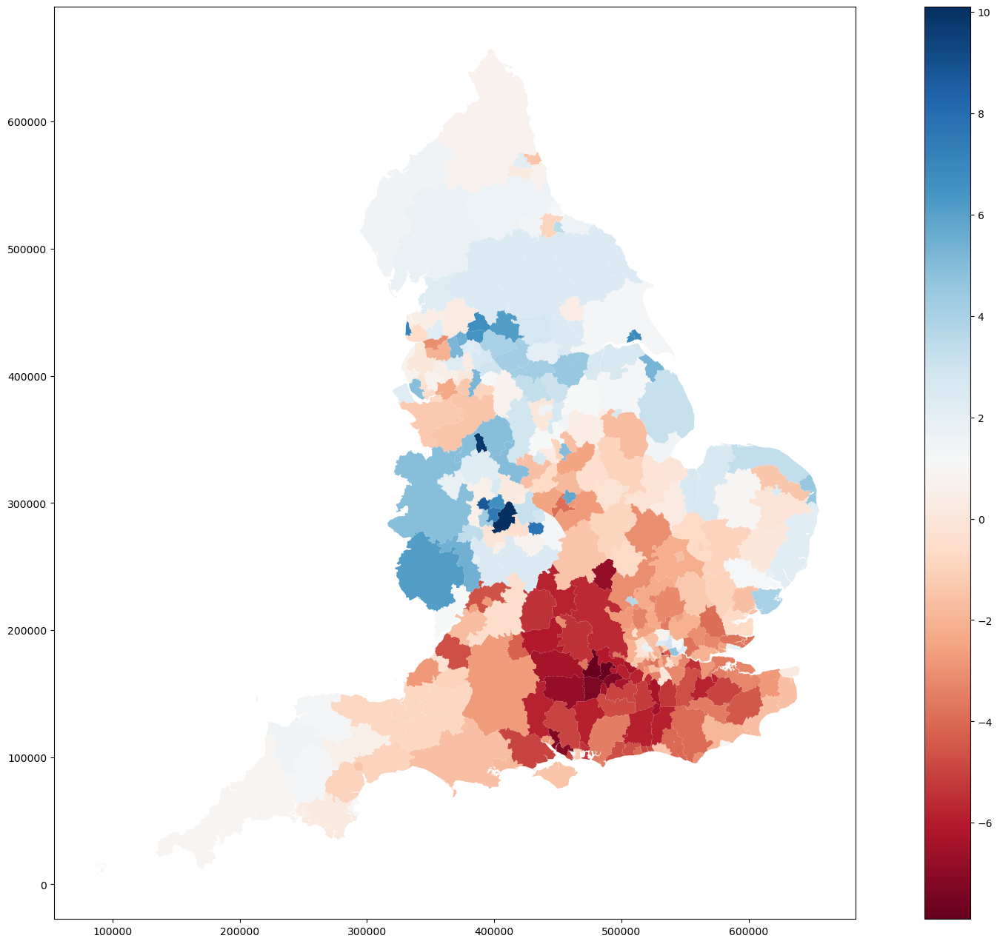

In [229]:
# Show FP map with diverging colour code

# Define plot size
f,ax = plt.subplots(1, figsize=(24,16))

# Use FP variable
triple_gdf.plot(ax=ax, column ='FP_(%)_var', cmap='RdBu', legend=True)

# show the map
plt.show()

There is a large number of LADs in the London area and therefore more detailed London region maps 
will be appended.Fortunately there is a specifoc coding for the London region E09. 

In [230]:
# Create London only data and geometry
London_gdf = triple_gdf[triple_gdf['Area Codes '].str.startswith('E09')]

# Print the new DataFrame
print(London_gdf)

    Area Codes                  LAD21NM  epc_mi-mo  pepc_mi-mo  area_mi-mo  \
275   E09000001          City of London    -0.6940     -4.5820    -27.7720   
276   E09000002    Barking and Dagenham     0.0660      1.3285     -7.3010   
277   E09000003                  Barnet    -0.6485     -0.7900      1.5495   
278   E09000004                  Bexley    -2.4685     -0.6560     -2.7570   
279   E09000005                   Brent    -0.4400     -0.6445      0.5790   
280   E09000006                 Bromley    -1.5305     -0.7200      6.0030   
281   E09000007                  Camden     1.1400     -1.4575    -12.3485   
282   E09000008                 Croydon    -1.8635     -0.6950     -0.3950   
283   E09000009                  Ealing    -0.3345     -0.1955     -2.7070   
284   E09000010                 Enfield    -2.0705     -0.6980     -1.6060   
285   E09000011               Greenwich     2.2015      0.6440     -5.3110   
286   E09000012                 Hackney     3.7990      0.5090  

In [231]:
# From earlier data check household numbers agree

# First check that full amount of FP household numbers for England has been retained 
print(fuel_poor.iloc[198])
print(London_gdf['Nu of households'].sum())
print(London_gdf['Nu in fuel poverty'].sum())

Area Codes            E12000007
Area names               LONDON
Unnamed: 2                  NaN
Unnamed: 3                  NaN
Nu of households        3613195
Nu in fuel poverty       431366
Fuel poor (%)              11.9
IsDuplicate               False
Name: 198, dtype: object
3613195
431366


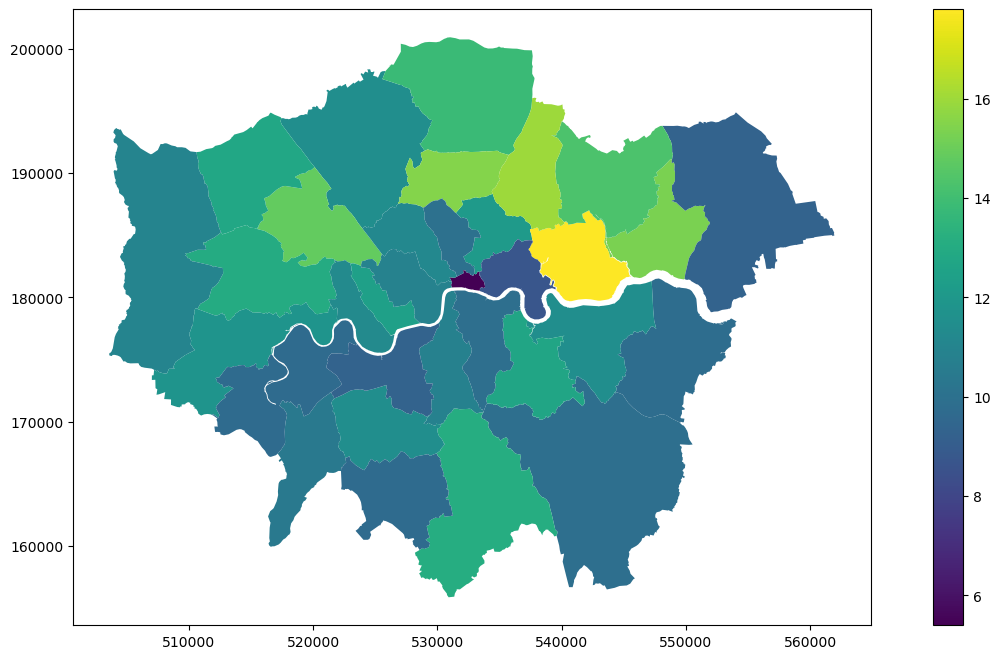

In [232]:
# The full number of households agree between original data and sum of London df

# Further checl full London df by running choropleth with suitable variable 

# Define plot size
f,ax = plt.subplots(1, figsize=(16,8))

# Add the variable for map 
London_gdf.plot(ax=ax, column ='Fuel poor (%)', legend=True)

# show the map
plt.show()

In [233]:
# Run statistics to compare with larger df
London_gdf.describe()

,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%),FP_(%)_var
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,-0.043015,-0.711545,-5.732712,109490.757576,13071.696970,11.733333,-1.366667
std,1.947429,1.093154,6.429557,30347.405719,4434.988314,2.473063,2.473063
min,-2.633500,-4.582000,-27.772000,5157.000000,279.000000,5.400000,-7.700000
25%,-1.530500,-1.165500,-9.366000,94565.000000,9980.000000,9.900000,-3.200000
50%,-0.440000,-0.698000,-5.140500,109526.000000,12789.000000,11.500000,-1.600000
75%,0.820500,-0.195500,-1.581000,127557.000000,16442.000000,13.000000,-0.100000
max,6.172500,1.328500,6.003000,161376.000000,21780.000000,17.800000,4.700000


In [234]:
# Show correlations
London_gdf_numeric = London_gdf.select_dtypes(include=np.number)
London_gdf_numeric.corr()

,epc_mi-mo,pepc_mi-mo,area_mi-mo,Nu of households,Nu in fuel poverty,Fuel poor (%),FP_(%)_var
epc_mi-mo,1.000000,0.423682,-0.583736,0.156241,-0.013169,-0.151904,-0.151904
pepc_mi-mo,0.423682,1.000000,0.273170,0.512404,0.508572,0.450384,0.450384
area_mi-mo,-0.583736,0.273170,1.000000,0.484617,0.538259,0.470616,0.470616
Nu of households,0.156241,0.512404,0.484617,1.000000,0.821517,0.297682,0.297682
Nu in fuel poverty,-0.013169,0.508572,0.538259,0.821517,1.000000,0.748797,0.748797
Fuel poor (%),-0.151904,0.450384,0.470616,0.297682,0.748797,1.000000,1.000000
FP_(%)_var,-0.151904,0.450384,0.470616,0.297682,0.748797,1.000000,1.000000


Whilst the statistics for London are not too dissimilar to England as a whole.
The correlation for EPC to FP percentages are stil inverse (-0.151904) but even 
less correlated, again underlining the wekness of the model fit/hypothesis.  




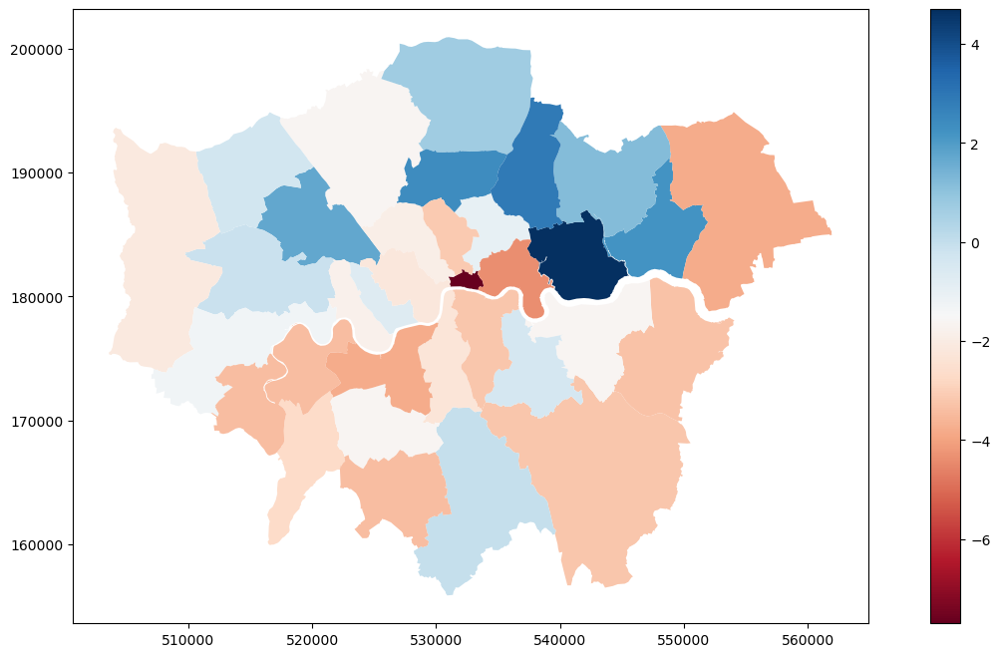

In [235]:
# Produce London map with same varaible and colour map as for England 

# Define plot size
f,ax = plt.subplots(1, figsize=(16,8))

# Add choosen variable
London_gdf.plot(ax=ax, column ='FP_(%)_var', cmap='RdBu', legend=True)

# show the map
plt.show()

As the Project is comparing two variables a second map is required , but to reflect the inverse relationship the 
colour code will be reversed. In this case the maps can be side by side with the 'indepenent variable' first. 

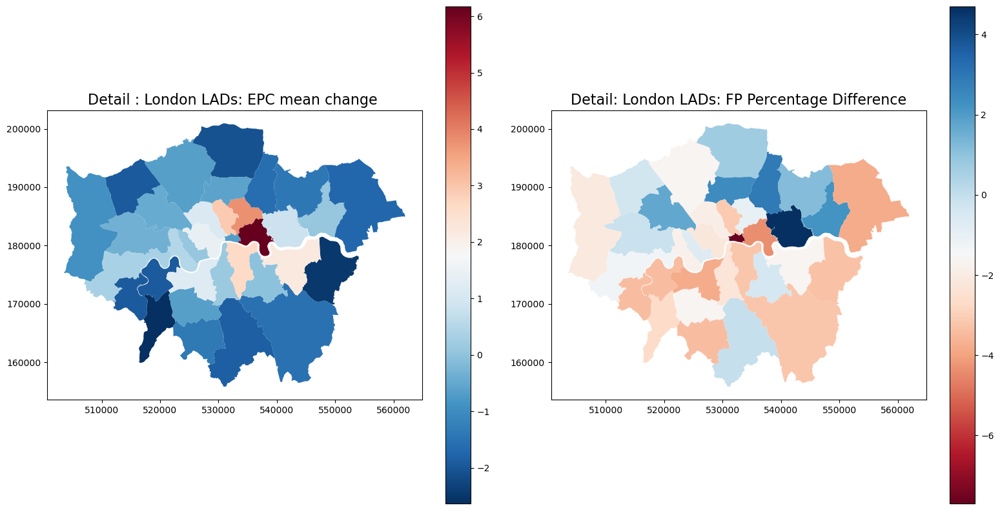

In [236]:
# Place choropleth maps side by side start with EPC [FN 49]  

# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot the first map on the left subplot
London_gdf.plot(ax=axes[0], column='epc_mi-mo', cmap='RdBu_r', legend=True)
axes[0].set_title('Detail : London LADs: EPC mean change ', fontsize=16)

# Remove axis
ax.set_axis_off()

# Plot the second map on the right subplot
London_gdf.plot(ax=axes[1], column='FP_(%)_var', cmap='RdBu', legend=True)
axes[1].set_title('Detail: London LADs: FP Percentage Difference', fontsize=16)

# Remove axis
ax.set_axis_off()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

Now run same choropleth maps for England in same order but due to size top then bottom.

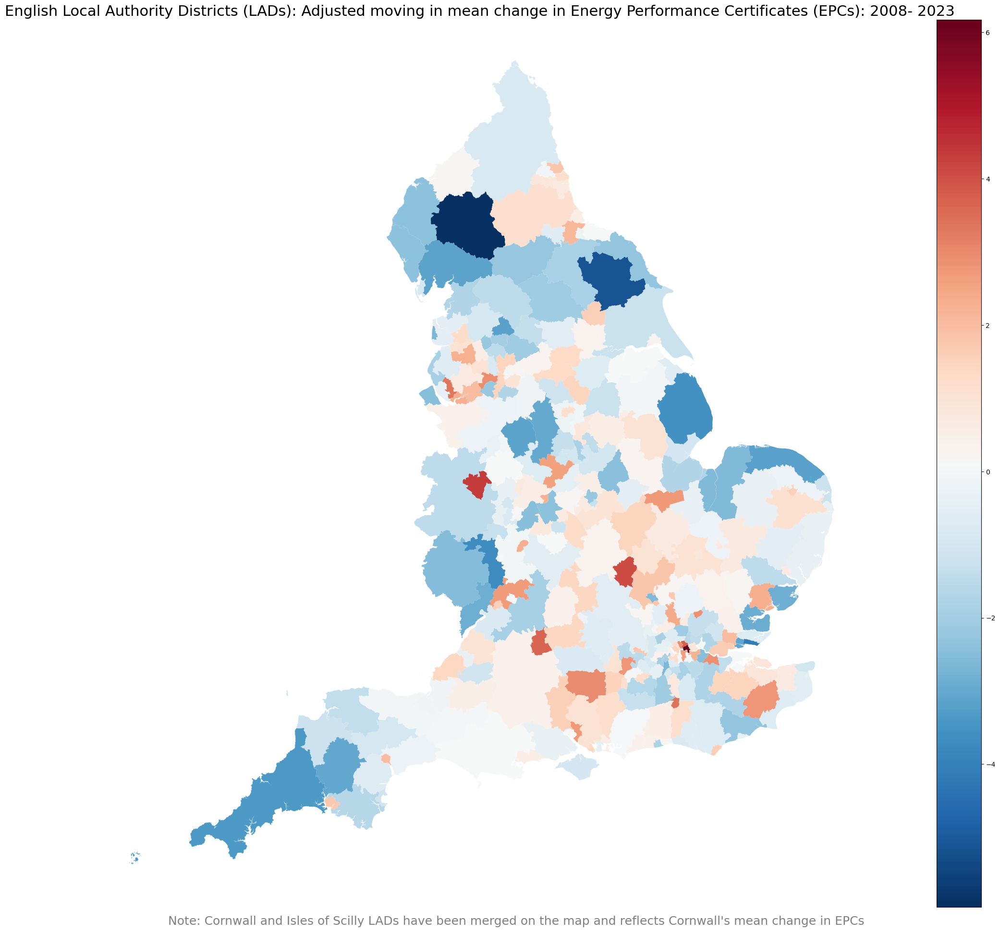

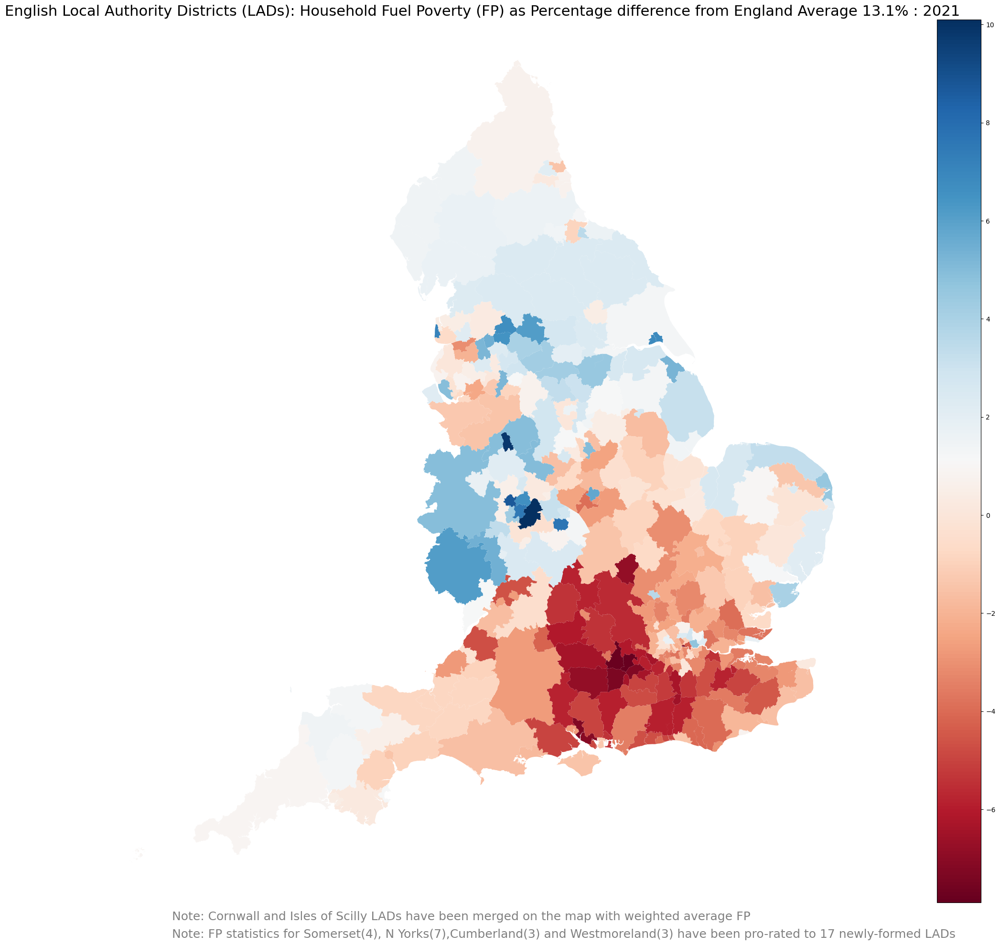

In [237]:
# Show final visualisations for England

# Define plot size
f,ax = plt.subplots(1, figsize=(36,24))

# Provide a title
plt.title('English Local Authority Districts (LADs): Adjusted moving in mean change in Energy Performance Certificates (EPCs): 2008- 2023', fontsize=22)

# Remove axis
ax.set_axis_off()

# Add a note below the map
note_text = "Note: Cornwall and Isles of Scilly LADs have been merged on the map and reflects Cornwall's mean change in EPCs"
plt.text(0.1, -0.02, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add varaible 
triple_gdf.plot(ax=ax, column ='epc_mi-mo', cmap='RdBu_r', legend=True)

# show the map
plt.show()

#Define plot size
f,ax = plt.subplots(1, figsize=(36,24))

# Provide a title
plt.title('English Local Authority Districts (LADs): Household Fuel Poverty (FP) as Percentage difference from England Average 13.1% : 2021', fontsize=22)

# Remove axis
ax.set_axis_off()

# Add a note below the map
note_text = "Note: Cornwall and Isles of Scilly LADs have been merged on the map with weighted average FP"
plt.text(0.1, -0.02, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add a note below the map
note_text = "Note: FP statistics for Somerset(4), N Yorks(7),Cumberland(3) and Westmoreland(3) have been pro-rated to 17 newly-formed LADs"
plt.text(0.1, -0.04, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add variable
triple_gdf.plot(ax=ax, column ='FP_(%)_var', cmap='RdBu', legend=True)

# show the map
plt.show()

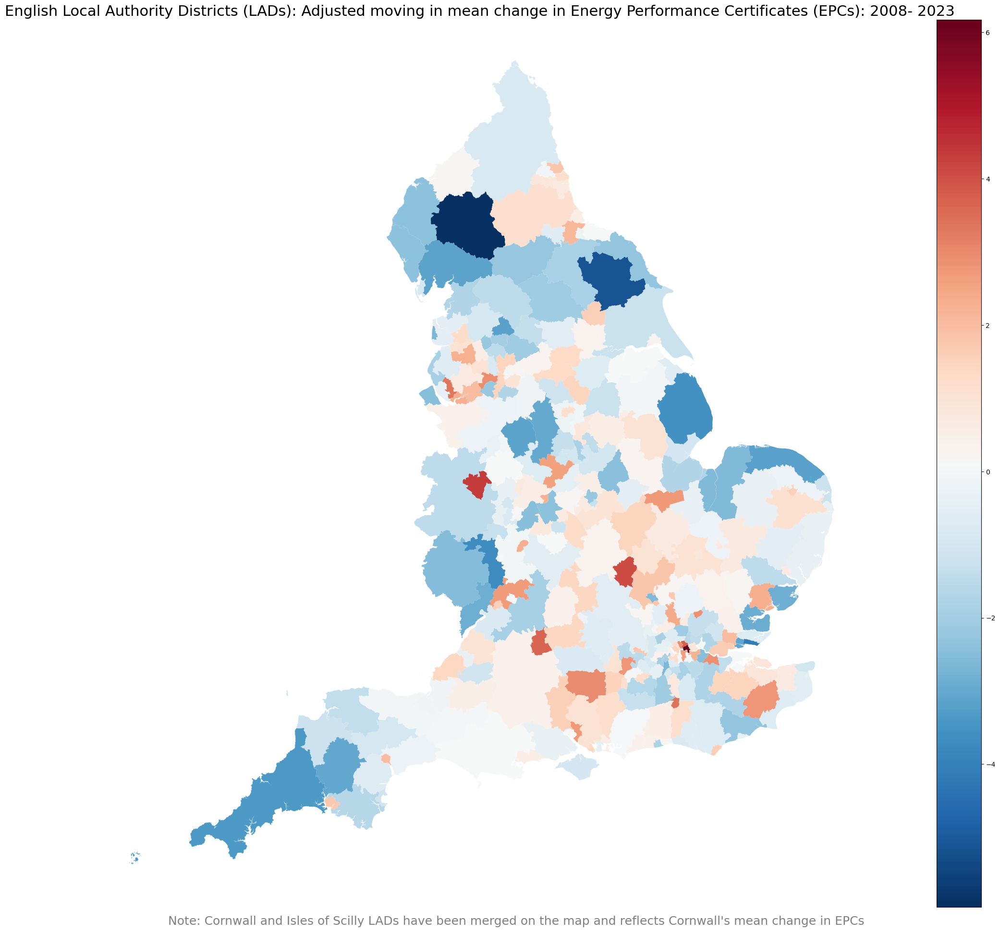

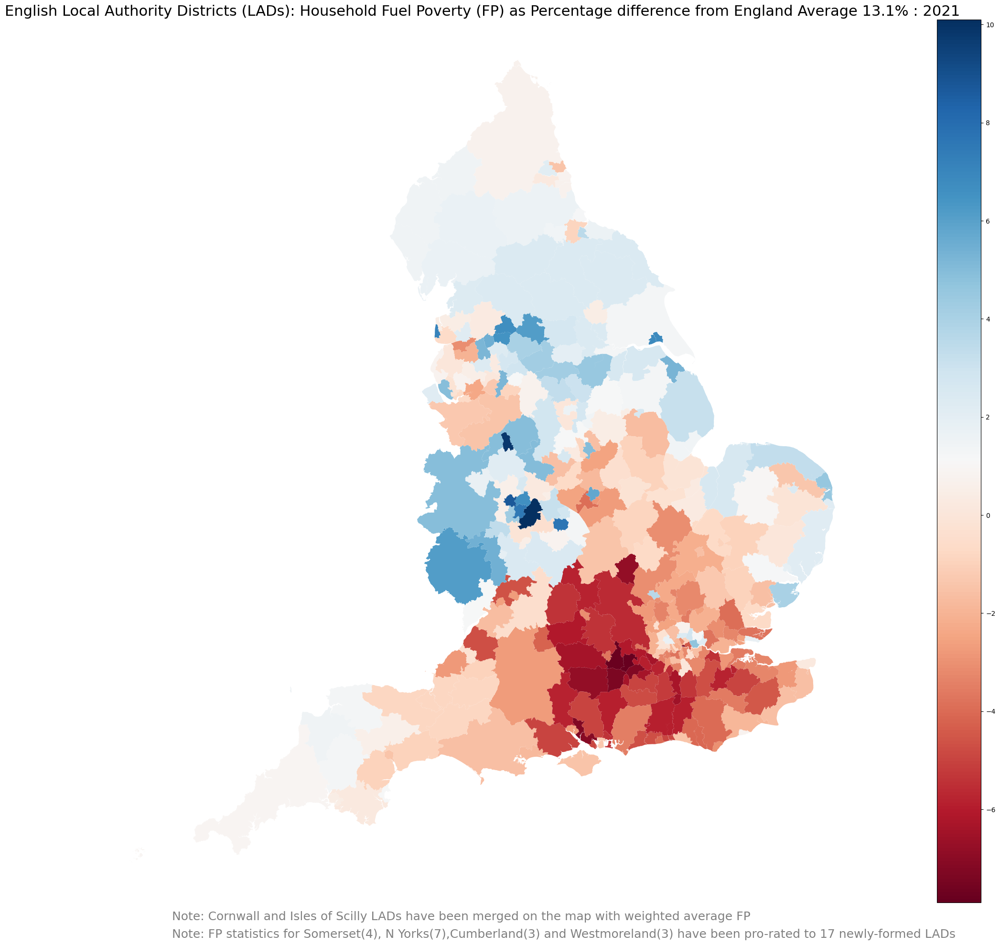

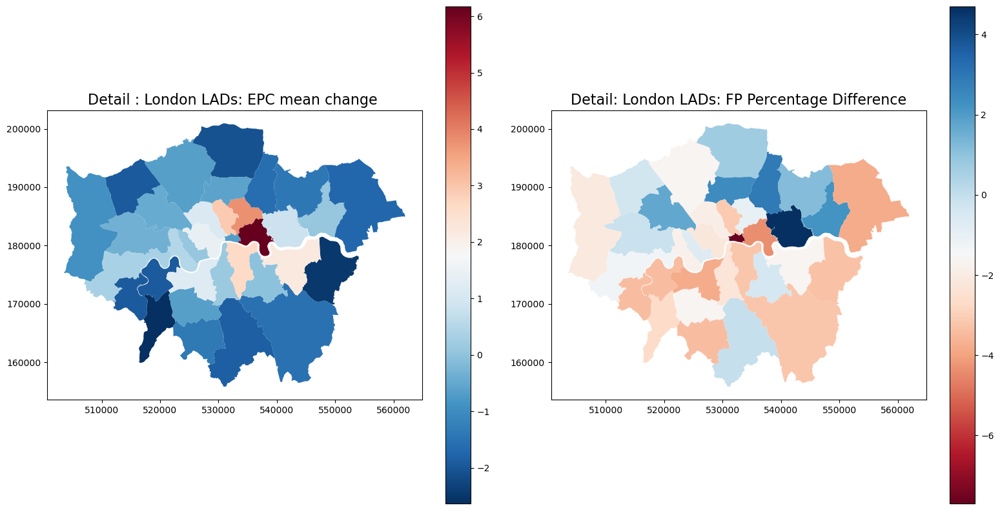

In [238]:
# Final combined visualisation

# Define plot size
f,ax = plt.subplots(1, figsize=(36,24))

# Provide a title
plt.title('English Local Authority Districts (LADs): Adjusted moving in mean change in Energy Performance Certificates (EPCs): 2008- 2023', fontsize=22)

# Remove axis
ax.set_axis_off()

# Add a note below the map
note_text = "Note: Cornwall and Isles of Scilly LADs have been merged on the map and reflects Cornwall's mean change in EPCs"
plt.text(0.1, -0.02, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add varaible 
triple_gdf.plot(ax=ax, column ='epc_mi-mo', cmap='RdBu_r', legend=True)

# show the map
plt.show()

#Define plot size
f,ax = plt.subplots(1, figsize=(36,24))

# Provide a title
plt.title('English Local Authority Districts (LADs): Household Fuel Poverty (FP) as Percentage difference from England Average 13.1% : 2021', fontsize=22)

# Remove axis
ax.set_axis_off()

# Add a note below the map
note_text = "Note: Cornwall and Isles of Scilly LADs have been merged on the map with weighted average FP"
plt.text(0.1, -0.02, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add a note below the map
note_text = "Note: FP statistics for Somerset(4), N Yorks(7),Cumberland(3) and Westmoreland(3) have been pro-rated to 17 newly-formed LADs"
plt.text(0.1, -0.04, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add variable
triple_gdf.plot(ax=ax, column ='FP_(%)_var', cmap='RdBu', legend=True)

# show the map
plt.show()

# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot the first map on the left subplot
London_gdf.plot(ax=axes[0], column='epc_mi-mo', cmap='RdBu_r', legend=True)
axes[0].set_title('Detail : London LADs: EPC mean change ', fontsize=16)

# Remove axis
ax.set_axis_off()

# Plot the second map on the right subplot
London_gdf.plot(ax=axes[1], column='FP_(%)_var', cmap='RdBu', legend=True)
axes[1].set_title('Detail: London LADs: FP Percentage Difference', fontsize=16)

# Remove axis
ax.set_axis_off()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

Visualisation Choices 

Intended Audience

The initial hypothesis is that lower energy efficiency in a LAD is one of the contributing factors that leads to a 
higher level of fuel poverty(FP). If such a causal link is credible then policymakers at a national or local level
(e.g. West Midlands) might aim to reduce FP by targetting support to improve the energy efficiency of lowly rated 
EPC LADs ('the public good'). Academics may also find the information useful in multivariate analysis of FP (e.g. 
adding in regional factors such as income/wealth inequalities and housing stock differences). 

                                                                                                       
Non Spatial.


1.Removing the outlier Isles of Scilly(IoS) which had a very low number of households (so would be a very small dot)
but also an EPC score over 10 points greater than the next largest score (and almost equivalent to the remaining range 
of just over 12) would have resulted in "squashed" representation for the other 308 LADs into a tight width band 
of approximately half the length of the diagram. Adding the IoS household numbers to neighbouring Cornwall preserved 
the totality of English households but without further information the reasonable assumption (given household
numbers) was that for EPC data Cornwall's results would have signifcantly more data points and so closer reflect 
the actual results for the combined 'artificial' LAD.  

2.The two variable dfs were not congrous for the English LAD populations and therefore rather than ignore the data 
for the non-overlapping LADs a pro-rata allocation of the FP data was made to the previous existing constituent 
LADs. 

3.The inclusion of statistics (i.e R-squared, correlation and regression line) is appropriate for the intended 
audience of academics and policymakers. A regression line displays the inverse relationship but the other stats 
reveal the "weak" relationship.

4.Dot size for LAD's FP household numbers based on matching second highest EPC (Stoke-on-Trent) with 25,897 to 25k
dot size and formula for ratio to other legend dot sizes. The choice of dot size was itself determined by trial and error
error within the confines of the diagram size. These provides further information and gives an indication of number of 
FP households within an LAD . Birmingham with the most FP households and highest percentage of FP households
is named in the diagram and its FP household number disclosed to emphasise this.

5.Transparecncy of dots reduces merging where clustering occurs. Green transparency was deemed to work well 
and contrast with a red regression line having tested other colour options.

6.Diagram size takes advantage of full page width.

7.Axis and title labels, legends and foot notes were added to provide as much information as possible within the 
scatter diagram's full 'page' size and with font sizes to emphasise importance.   

Spatial (1 and 2 above partially impact the spatial visualisation)

1.Since the mean LAD EPC changes centred around zero,calcualting the variance to the mean would have added very little.
Hoewever comparisons between the two variables are made easier by converting LAD's FP % to the their variance 
from the national (i.e English) average (i.e + or - from 0).


2.London LADs are so densely packed that additional maps for London LADs as addendum provides clarity.
Whilst side-by-side represenation works best when comparing variables doing so for the larger England map 
would have lost LAD detail (a difficult trade-off). Removing axis on English maps but retaining axis for
London maps fitted with description as 'Detail'.It also appeared logical to show the map for the independent 
variable 'first' either ar the top or to the left.   


3.Colour - Red-to-Blue(RdBu) is divergent "colorblind safe" [FN 50]. The even more 'print friendly.. photocopy
safe"[FN 51] PuOr doesn't resonate so readily with energy effieciency eg warmth. Using blue to represent high 
fuel poverty was irresistable and not counterintuitive. The inverse relationship is easier to recognise by reversing the colour code for 
the EPC maps.  

4.Title label and foot notes were added to provide as much information as possible given the choropleths 
individual dimensions.   



NON-SPATIAL VISUALISATION

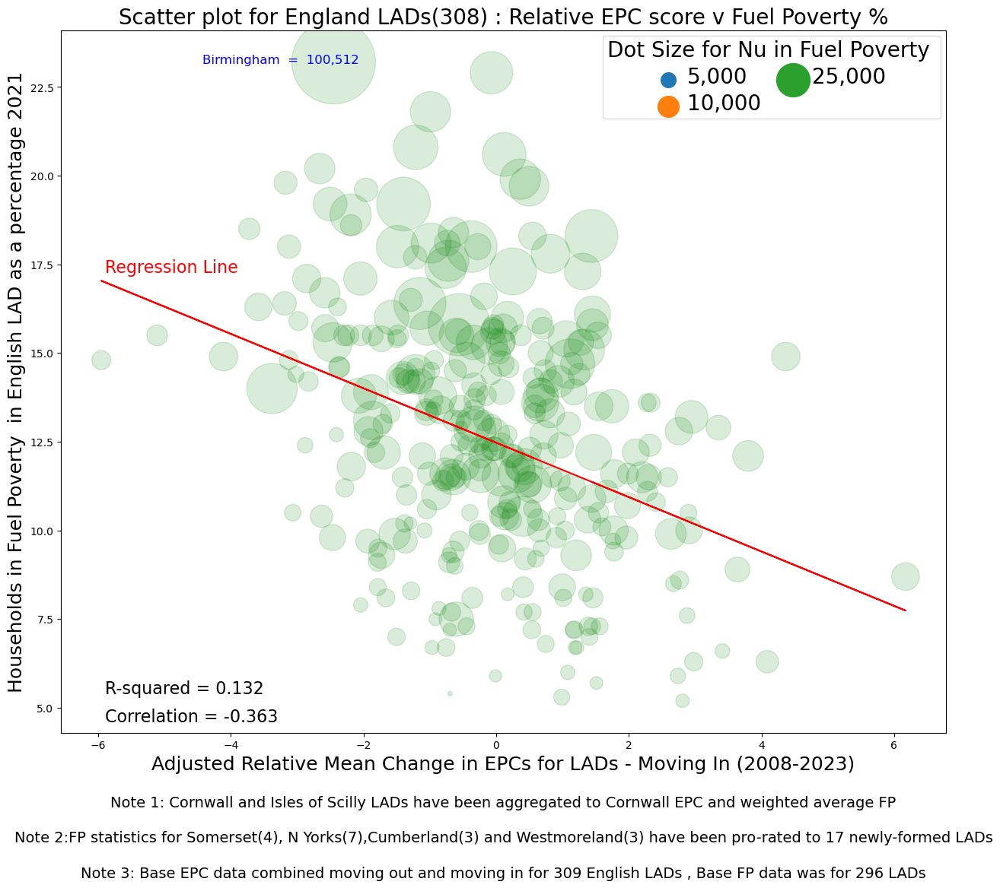

In [239]:
# Create the dotsize
dotsize = triple_gdf['Nu in fuel poverty']/16

# Create the scatter plot with high transparency
ax = triple_gdf.plot.scatter(x='epc_mi-mo', y='Fuel poor (%)', s=dotsize, c='green', alpha=0.15,figsize=(15, 12))

# Fit a linear regression model
x = triple_gdf[['epc_mi-mo']]
y = triple_gdf['Fuel poor (%)']

regression_model = LinearRegression()
regression_model.fit(x, y)

# Predict the values using the linear regression model
y_pred = regression_model.predict(x)

# Plot the regression line
ax.plot(x, y_pred, color='red', label='Regression Line')

# Add a legend for the regression line
legend_handles, legend_labels = ax.get_legend_handles_labels()
legend_handles.append(mlines.Line2D([], [], color='red', label='Regression Line'))
ax.legend(handles=legend_handles, labels=legend_labels)

# Add three notes under the graph
ax.text(0.5, -0.1, 'Note 1: Cornwall and Isles of Scilly LADs have been aggregated to Cornwall EPC and weighted average FP', transform=ax.transAxes, ha='center', va='center', fontsize=14)
ax.text(0.5, -0.15, 'Note 2:FP statistics for Somerset(4), N Yorks(7),Cumberland(3) and Westmoreland(3) have been pro-rated to 17 newly-formed LADs', transform=ax.transAxes, ha='center', va='center', fontsize=14)
ax.text(0.5, -0.2, 'Note 3: Base EPC data combined moving out and moving in for 309 English LADs , Base FP data was for 296 LADs', transform=ax.transAxes, ha='center', va='center', fontsize=14)

# Customize the plot
plt.xlabel('Adjusted Relative Mean Change in EPCs for LADs - Moving In (2008-2023)', fontsize=18)
plt.ylabel('Households in Fuel Poverty  in English LAD as a percentage 2021', fontsize=18)
plt.title(' Scatter plot for England LADs(308) : Relative EPC score v Fuel Poverty % ', fontsize=20)

# Create a legend for dot size
legend_labels = ['5,000', '10,000', '25,000']  # Customize these labels as needed
legend_handles = []

# Create a fake scatter plot with different dot sizes for the legend
for size in [200., 400., 1000.]:  # Corresponding to the legend labels
    handle = ax.scatter([], [], s=size, label=f'Dot Size: {size * 0.02 * 100}% - {size * 0.02 * 100 + 5}%')
    legend_handles.append(handle)

# Create a single legend for dot size
legend = ax.legend(handles=legend_handles, labels=legend_labels, title='Dot Size for Nu in Fuel Poverty ',ncol=2)

# Set the font size for legend title
legend.get_title().set_fontsize(20)

# Add a legend for dot size and custom legend lines
handles, labels = ax.get_legend_handles_labels()

# Check if legend is not None before setting properties
if legend:
    # Set the font size for legend text
    for text in legend.get_texts():
        text.set_fontsize(20)

    # Adjust the size of the legend box
    
    legend.get_frame().set_alpha(0.7)  # Set the transparency

# Add R-squared value in the bottom left corner
ax.text(0.05, 0.05, f'R-squared = 0.132', transform=ax.transAxes, ha='left', va='bottom', fontsize=16)

# Add R-squared value in the bottom left corner
ax.text(0.05, 0.01, f'Correlation = -0.363', transform=ax.transAxes, ha='left', va='bottom', fontsize=16)

# Add R-squared value in the bottom left corner
ax.text(0.05, 0.65, f'Regression Line', transform=ax.transAxes, ha='left', va='bottom', color='red', fontsize=16)

# Add R-squared value in the bottom left corner
ax.text(0.16, 0.95, f'Birmingham  =  100,512', transform=ax.transAxes, ha='left', va='bottom', color='blue', fontsize=12)

# Show the plot
plt.show()

SPATIAL VISUALISATION

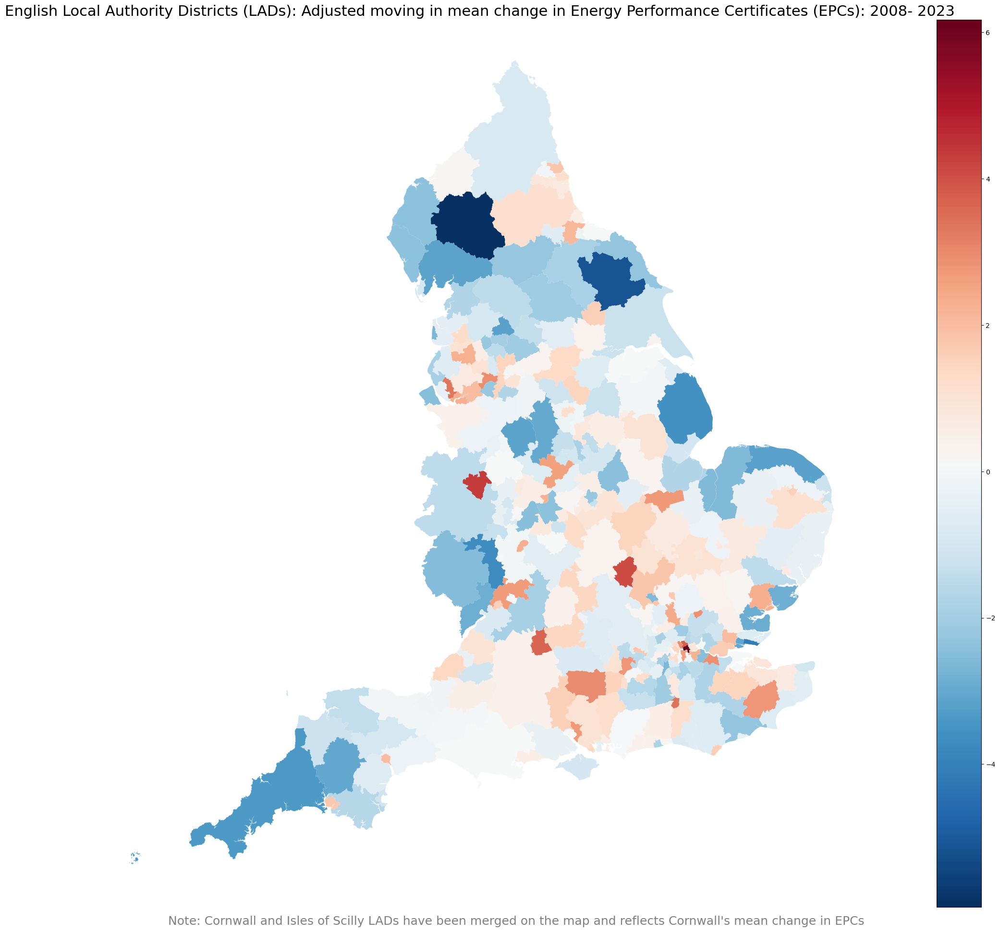

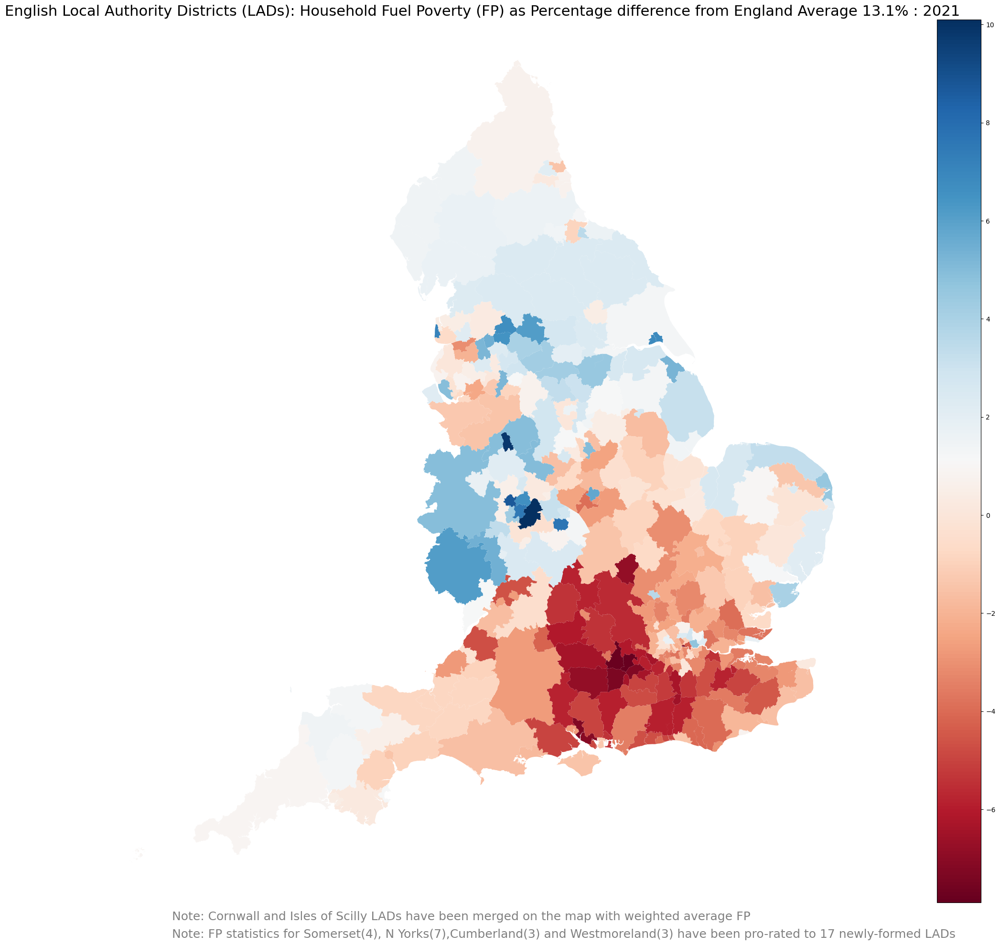

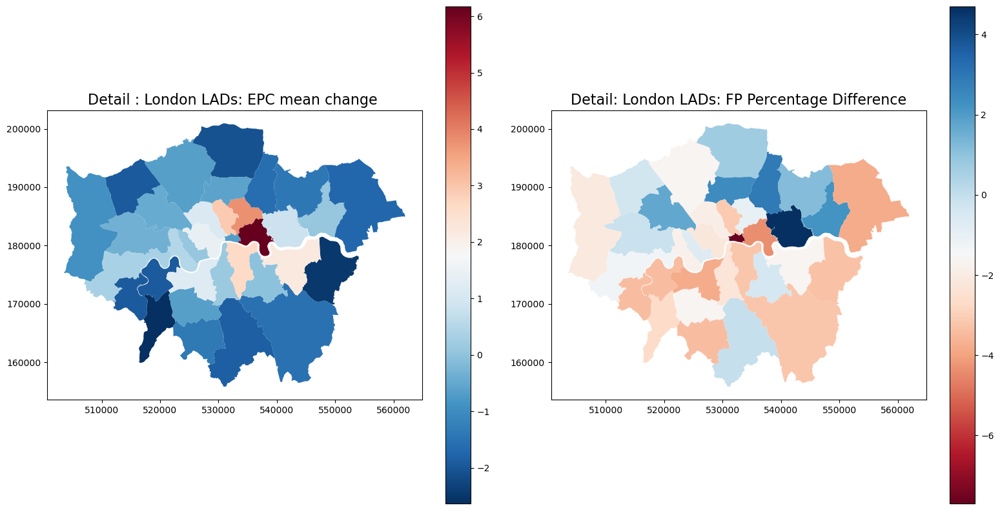

In [240]:
# Define plot size
f,ax = plt.subplots(1, figsize=(36,24))

# Provide a title
plt.title('English Local Authority Districts (LADs): Adjusted moving in mean change in Energy Performance Certificates (EPCs): 2008- 2023', fontsize=22)

# Remove axis
ax.set_axis_off()

# Add a note below the map
note_text = "Note: Cornwall and Isles of Scilly LADs have been merged on the map and reflects Cornwall's mean change in EPCs"
plt.text(0.1, -0.02, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add varaible 
triple_gdf.plot(ax=ax, column ='epc_mi-mo', cmap='RdBu_r', legend=True)

# show the map
plt.show()

#Define plot size
f,ax = plt.subplots(1, figsize=(36,24))

# Provide a title
plt.title('English Local Authority Districts (LADs): Household Fuel Poverty (FP) as Percentage difference from England Average 13.1% : 2021', fontsize=22)

# Remove axis
ax.set_axis_off()

# Add a note below the map
note_text = "Note: Cornwall and Isles of Scilly LADs have been merged on the map with weighted average FP"
plt.text(0.1, -0.02, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add a note below the map
note_text = "Note: FP statistics for Somerset(4), N Yorks(7),Cumberland(3) and Westmoreland(3) have been pro-rated to 17 newly-formed LADs"
plt.text(0.1, -0.04, note_text, transform=ax.transAxes, fontsize=18, color='gray')

# Add variable
triple_gdf.plot(ax=ax, column ='FP_(%)_var', cmap='RdBu', legend=True)

# show the map
plt.show()

# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot the first map on the left subplot
London_gdf.plot(ax=axes[0], column='epc_mi-mo', cmap='RdBu_r', legend=True)
axes[0].set_title('Detail : London LADs: EPC mean change ', fontsize=16)

# Remove axis
ax.set_axis_off()

# Plot the second map on the right subplot
London_gdf.plot(ax=axes[1], column='FP_(%)_var', cmap='RdBu', legend=True)
axes[1].set_title('Detail: London LADs: FP Percentage Difference', fontsize=16)

# Remove axis
ax.set_axis_off()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

References

[1] GEOG5995M course materials

[2] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt:How do I add a regression line with label 
 
[3] CDRC Residential Mobility and Energy Performance Certificate (RMEPC) Index (LAD Geography) 
https://data.cdrc.ac.uk/system/files/RMEPC_LA_0.pdf (Accessed 2 December 2023)

[4] GEOG5995M course materials

[5] https://data.cdrc.ac.uk/dataset/cdrc-residential-mobility-and-energy-performance-
certificate-rmepc-index-lad-geography (Accessed 2 December 2023)

[6] CDRC Residential Mobility and Energy Performance Certificate (RMEPC) Index (LAD Geography) 
https://data.cdrc.ac.uk/system/files/RMEPC_LA_0.pdf (Accessed 2 December 2023)

[7] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How do I retain only rows with column name starting E0 
    
[8] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to check no duplicate row 
    
[9] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to count no duplicate rows

[10] https://data.cdrc.ac.uk/dataset/cdrc-residential-mobility-and-energy-performance
-certificate-rmepc-index-lad-geography (Accessed 2 December 2023)

[11] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: Prompt: How do I retain only rows with column name starting E0 

[12] https://geoportal.statistics.gov.uk/datasets/ons::local-authority-districts-december-2021-boundaries-gb-bfc
/about (Accessed 2 December 2023)

[13] https://geoportal.statistics.gov.uk/datasets/ons::local-authority-districts-december-2021-boundaries-gb-bfc
/about : LAD_Dec_2021_GB_BFC_2022_-2823256321483906905.csv (Accessed 2 December 2023)

[14]  https://geoportal.statistics.gov.uk/datasets/ons::local-authority-districts-december-2021-boundaries-gb-bfc
/about : LAD_DEC_2021_GB_BGC.shx(Accessed 2 December 2023)

[15] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How do I merge shp and csv file to retain geometry 

[16] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to rename column

[17] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt:How to show two maps side by side

[18] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: What colour maps are colourblind friendly

[19]ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to select columns for certain rows for print

[20] GEOG5995M course materials

[21] GEOG5995M course materials

[22] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to move column position

[23] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: What colour maps are colourblind friendly

[24] https://www.gov.uk/government/statistics/sub-regional-fuel-poverty-data-2023-2021-data
(Accessed 2 December 2023)

[25] https://www.gov.uk/government/statistics/sub-regional-fuel-poverty-data-2023-2021-data
Sub-regional fuel poverty, 2021 data (Excel) : 
Table 2 : Fuel Poor Households by Administartive Area 2021
(Accessed 2 December 2023)

[26] https://www.gov.uk/government/statistics/sub-regional-fuel-poverty-data-2023-2021-data
(Accessed 2 December 2023)

[27] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to check no duplicate row 

[28] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to count no duplicate row
    
[29] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to convert object to integer

[30] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to convert object to integer

[3i] https://www.gov.uk/government/statistics/sub-regional-fuel-poverty-data-2023-2021-data
Sub-regional fuel poverty, 2021 data (Excel) : 
Table 2 : Fuel Poor Households by Administartive Area 2021
(Accessed 2 December 2023)

[32] https://www.gov.uk/government/statistics/sub-regional-fuel-poverty-data-2023-2021-data
Sub-regional fuel poverty, 2021 data (Excel) : 
Table 2 : Fuel Poor Households by Administartive Area 2021
(Accessed 2 December 2023)

[33] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to reset index

[34] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to print mising info from merging

[35] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to map geometry

[36] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: Count for name matchs

[37] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: List where no match in names

[38] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt How to disaggregate into subsets
        
[39] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to update amounts in rows

[40] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt How to change datatype

[41] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to combine geometries 

[42] GEOG5995M course materials

[43] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to run OLS model for inverse relationship

[44] GEOG5995M course materials

[45] GEOG5995M course materials

[46] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to create dot size to represent a variable

[47] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: Legend lines are too close together 

[48] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to add text inside a scatter diagram 
    
[49] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt:How do I add a regression line with label
    
[50] https://colorbrewer2.org/#type=diverging&scheme=RdBu&n=3

[51] https://colorbrewer2.org/#type=diverging&scheme=PuOr&n=3

[52] ChatGPT (version GPT3.5)https://chat.openai.com/ (Accessed 2 December 2023)
Prompt: How to print two maps side by side 


    


         

Note The data for this research have been provided by the Consumer Data Research Centre, an ESRC Data Investment,
under project ID CDRC [Project Number], ES/L011840/1; ES/L011891/1